## What's this TensorFlow business?

You've written a lot of code in this assignment to provide a whole host of neural network functionality. Dropout, Batch Norm, and 2D convolutions are some of the workhorses of deep learning in computer vision. You've also worked hard to make your code efficient and vectorized.

For the last part of this assignment, though, we're going to leave behind your beautiful codebase and instead migrate to one of two popular deep learning frameworks: in this instance, TensorFlow (or PyTorch, if you switch over to that notebook)

#### What is it?
TensorFlow is a system for executing computational graphs over Tensor objects, with native support for performing backpropogation for its Variables. In it, we work with Tensors which are n-dimensional arrays analogous to the numpy ndarray.

#### Why?

* Our code will now run on GPUs! Much faster training. Writing your own modules to run on GPUs is beyond the scope of this class, unfortunately.
* We want you to be ready to use one of these frameworks for your project so you can experiment more efficiently than if you were writing every feature you want to use by hand. 
* We want you to stand on the shoulders of giants! TensorFlow and PyTorch are both excellent frameworks that will make your lives a lot easier, and now that you understand their guts, you are free to use them :) 
* We want you to be exposed to the sort of deep learning code you might run into in academia or industry. 

## How will I learn TensorFlow?

TensorFlow has many excellent tutorials available, including those from [Google themselves](https://www.tensorflow.org/get_started/get_started).

Otherwise, this notebook will walk you through much of what you need to do to train models in TensorFlow. See the end of the notebook for some links to helpful tutorials if you want to learn more or need further clarification on topics that aren't fully explained here.

## Load Datasets


In [1]:
import tensorflow as tf
import numpy as np
import math
import timeit
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from cs231n.data_utils import load_CIFAR10

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=10000):
    """
    Load the CIFAR-10 dataset from disk and perform preprocessing to prepare
    it for the two-layer neural net classifier. These are the same steps as
    we used for the SVM, but condensed to a single function.  
    """
    # Load the raw CIFAR-10 data
    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)

    # Subsample the data
    mask = range(num_training, num_training + num_validation)
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = range(num_training)
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = range(num_test)
    X_test = X_test[mask]
    y_test = y_test[mask]

    # Normalize the data: subtract the mean image
    mean_image = np.mean(X_train, axis=0)
    X_train -= mean_image
    X_val -= mean_image
    X_test -= mean_image

    return X_train, y_train, X_val, y_val, X_test, y_test


# Invoke the above function to get our data.
X_train, y_train, X_val, y_val, X_test, y_test = get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (49000, 32, 32, 3)
Train labels shape:  (49000,)
Validation data shape:  (1000, 32, 32, 3)
Validation labels shape:  (1000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


## Example Model

### Some useful utilities

. Remember that our image data is initially N x H x W x C, where:
* N is the number of datapoints
* H is the height of each image in pixels
* W is the height of each image in pixels
* C is the number of channels (usually 3: R, G, B)

This is the right way to represent the data when we are doing something like a 2D convolution, which needs spatial understanding of where the pixels are relative to each other. When we input image data into fully connected affine layers, however, we want each data example to be represented by a single vector -- it's no longer useful to segregate the different channels, rows, and columns of the data.

### The example model itself

The first step to training your own model is defining its architecture.

Here's an example of a convolutional neural network defined in TensorFlow -- try to understand what each line is doing, remembering that each layer is composed upon the previous layer. We haven't trained anything yet - that'll come next - for now, we want you to understand how everything gets set up. 

In that example, you see 2D convolutional layers (Conv2d), ReLU activations, and fully-connected layers (Linear). You also see the Hinge loss function, and the Adam optimizer being used. 

Make sure you understand why the parameters of the Linear layer are 5408 and 10.

### TensorFlow Details
In TensorFlow, much like in our previous notebooks, we'll first specifically initialize our variables, and then our network model.

In [3]:
# clear old variables
tf.reset_default_graph()

# setup input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

def simple_model(X,y):
    # define our weights (e.g. init_two_layer_convnet)
    
    # setup variables
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 32])
    bconv1 = tf.get_variable("bconv1", shape=[32])
    W1 = tf.get_variable("W1", shape=[5408, 10])
    b1 = tf.get_variable("b1", shape=[10])

    # define our graph (e.g. two_layer_convnet)
    a1 = tf.nn.conv2d(X, Wconv1, strides=[1,2,2,1], padding='VALID') + bconv1
    h1 = tf.nn.relu(a1)
    h1_flat = tf.reshape(h1,[-1,5408])
    y_out = tf.matmul(h1_flat,W1) + b1
    return y_out

y_out = simple_model(X,y)

# define our loss
total_loss = tf.losses.hinge_loss(tf.one_hot(y,10),logits=y_out)
mean_loss = tf.reduce_mean(total_loss)

# define our optimizer
optimizer = tf.train.AdamOptimizer(5e-4) # select optimizer and set learning rate
train_step = optimizer.minimize(mean_loss)

TensorFlow supports many other layer types, loss functions, and optimizers - you will experiment with these next. Here's the official API documentation for these (if any of the parameters used above were unclear, this resource will also be helpful). 

* Layers, Activations, Loss functions : https://www.tensorflow.org/api_guides/python/nn
* Optimizers: https://www.tensorflow.org/api_guides/python/train#Optimizers
* BatchNorm: https://www.tensorflow.org/api_docs/python/tf/contrib/layers/batch_norm

### Training the model on one epoch
While we have defined a graph of operations above, in order to execute TensorFlow Graphs, by feeding them input data and computing the results, we first need to create a `tf.Session` object. A session encapsulates the control and state of the TensorFlow runtime. For more information, see the TensorFlow [Getting started](https://www.tensorflow.org/get_started/get_started) guide.

Optionally we can also specify a device context such as `/cpu:0` or `/gpu:0`. For documentation on this behavior see [this TensorFlow guide](https://www.tensorflow.org/tutorials/using_gpu)

You should see a validation loss of around 0.4 to 0.6 and an accuracy of 0.30 to 0.35 below

Training
Iteration 0: with minibatch training loss = 8.23 and accuracy of 0.094
Iteration 100: with minibatch training loss = 1.16 and accuracy of 0.19
Iteration 200: with minibatch training loss = 0.9 and accuracy of 0.25
Iteration 300: with minibatch training loss = 0.656 and accuracy of 0.25
Iteration 400: with minibatch training loss = 0.759 and accuracy of 0.17
Iteration 500: with minibatch training loss = 0.594 and accuracy of 0.34
Iteration 600: with minibatch training loss = 0.607 and accuracy of 0.28
Iteration 700: with minibatch training loss = 0.554 and accuracy of 0.27
Epoch 1, Overall loss = 0.753 and accuracy of 0.305


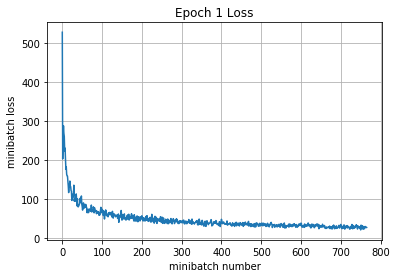

Validation
Epoch 1, Overall loss = 0.444 and accuracy of 0.372


In [4]:
def run_model(session, predict, loss_val, Xd, yd,
              epochs=1, batch_size=64, print_every=100,
              training=None, plot_losses=False):
    # have tensorflow compute accuracy
    correct_prediction = tf.equal(tf.argmax(predict,1), y)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    # shuffle indicies
    train_indicies = np.arange(Xd.shape[0])
    np.random.shuffle(train_indicies)

    training_now = training is not None
    
    # setting up variables we want to compute (and optimizing)
    # if we have a training function, add that to things we compute
    variables = [mean_loss,correct_prediction,accuracy]
    if training_now:
        variables[-1] = training
    
    # counter 
    iter_cnt = 0
    for e in range(epochs):
        # keep track of losses and accuracy
        correct = 0
        losses = []
        # make sure we iterate over the dataset once
        for i in range(int(math.ceil(Xd.shape[0]/batch_size))):
            # generate indicies for the batch
            start_idx = (i*batch_size)%X_train.shape[0]
            idx = train_indicies[start_idx:start_idx+batch_size]
            
            # create a feed dictionary for this batch
            feed_dict = {X: Xd[idx,:],
                         y: yd[idx],
                         is_training: training_now }
            # get batch size
            actual_batch_size = yd[i:i+batch_size].shape[0]
            
            # have tensorflow compute loss and correct predictions
            # and (if given) perform a training step
            loss, corr, _ = session.run(variables,feed_dict=feed_dict)
            
            # aggregate performance stats
            losses.append(loss*actual_batch_size)
            correct += np.sum(corr)
            
            # print every now and then
            if training_now and (iter_cnt % print_every) == 0:
                print("Iteration {0}: with minibatch training loss = {1:.3g} and accuracy of {2:.2g}"\
                      .format(iter_cnt,loss,np.sum(corr)/actual_batch_size))
            iter_cnt += 1
        total_correct = correct/Xd.shape[0]
        total_loss = np.sum(losses)/Xd.shape[0]
        print("Epoch {2}, Overall loss = {0:.3g} and accuracy of {1:.3g}"\
              .format(total_loss,total_correct,e+1))
        if plot_losses:
            plt.plot(losses)
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(e+1))
            plt.xlabel('minibatch number')
            plt.ylabel('minibatch loss')
            plt.show()
    return total_loss,total_correct

with tf.Session() as sess:
    with tf.device("/cpu:0"): #"/cpu:0" or "/gpu:0" 
        sess.run(tf.global_variables_initializer())
        print('Training')
        run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True)
        print('Validation')
        run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

## Training a specific model

In this section, we're going to specify a model for you to construct. The goal here isn't to get good performance (that'll be next), but instead to get comfortable with understanding the TensorFlow documentation and configuring your own model. 

Using the code provided above as guidance, and using the following TensorFlow documentation, specify a model with the following architecture:

* 7x7 Convolutional Layer with 32 filters and stride of 1
* ReLU Activation Layer
* Spatial Batch Normalization Layer (trainable parameters, with scale and centering)
* 2x2 Max Pooling layer with a stride of 2
* Affine layer with 1024 output units
* ReLU Activation Layer
* Affine layer from 1024 input units to 10 outputs



In [5]:
# clear old variables
tf.reset_default_graph()

# define our input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

# define model
def complex_model(X,y,is_training):
    W_conv = tf.get_variable("Wconv",shape = [7,7,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(X, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    
    a1 = tf.nn.relu(a1)
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training)
    
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1_flat = tf.reshape(a1,[-1,16*16*32])
    W1 = tf.get_variable("W1",shape = [16*16*32,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,10])
    b2 = tf.get_variable("b2",shape = [10])
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    y_out = tf.matmul(affine,W2) + b2
    return y_out
    

y_out = complex_model(X,y,is_training)

To make sure you're doing the right thing, use the following tool to check the dimensionality of your output (it should be 64 x 10, since our batches have size 64 and the output of the final affine layer should be 10, corresponding to our 10 classes):

In [6]:
# Now we're going to feed a random batch into the model 
# and make sure the output is the right size
x = np.random.randn(64, 32, 32,3)
with tf.Session() as sess:
    with tf.device("/cpu:0"): #"/cpu:0" or "/gpu:0"
        tf.global_variables_initializer().run()

        ans = sess.run(y_out,feed_dict={X:x,is_training:True})
        %timeit sess.run(y_out,feed_dict={X:x,is_training:True})
        print(ans.shape)
        print(np.array_equal(ans.shape, np.array([64, 10])))

100 loops, best of 3: 4.77 ms per loop
(64, 10)
True


You should see the following from the run above 

`(64, 10)`

`True`

### GPU!

Now, we're going to try and start the model under the GPU device, the rest of the code stays unchanged and all our variables and operations will be computed using accelerated code paths. However, if there is no GPU, we get a Python exception and have to rebuild our graph. On a dual-core CPU, you might see around 50-80ms/batch running the above, while the Google Cloud GPUs (run below) should be around 2-5ms/batch.

In [7]:
try:
    with tf.Session() as sess:
        with tf.device("/gpu:0") as dev: #"/cpu:0" or "/gpu:0"
            tf.global_variables_initializer().run()

            ans = sess.run(y_out,feed_dict={X:x,is_training:True})
            %timeit sess.run(y_out,feed_dict={X:x,is_training:True})
except tf.errors.InvalidArgumentError:
    print("no gpu found, please use Google Cloud if you want GPU acceleration")    
    # rebuild the graph
    # trying to start a GPU throws an exception 
    # and also trashes the original graph
    tf.reset_default_graph()
    X = tf.placeholder(tf.float32, [None, 32, 32, 3])
    y = tf.placeholder(tf.int64, [None])
    is_training = tf.placeholder(tf.bool)
    y_out = complex_model(X,y,is_training)

100 loops, best of 3: 4.64 ms per loop


You should observe that even a simple forward pass like this is significantly faster on the GPU. So for the rest of the assignment (and when you go train your models in assignment 3 and your project!), you should use GPU devices. However, with TensorFlow, the default device is a GPU if one is available, and a CPU otherwise, so we can skip the device specification from now on.

### Train the model.

Now that you've seen how to define a model and do a single forward pass of some data through it, let's  walk through how you'd actually train one whole epoch over your training data (using the complex_model you created provided above).

Make sure you understand how each TensorFlow function used below corresponds to what you implemented in your custom neural network implementation.

First, set up an **RMSprop optimizer** (using a 1e-3 learning rate) and a **cross-entropy loss** function. See the TensorFlow documentation for more information
* Layers, Activations, Loss functions : https://www.tensorflow.org/api_guides/python/nn
* Optimizers: https://www.tensorflow.org/api_guides/python/train#Optimizers

In [8]:
# Inputs
#     y_out: is what your model computes
#     y: is your TensorFlow variable with label information
# Outputs
#    mean_loss: a TensorFlow variable (scalar) with numerical loss
#    optimizer: a TensorFlow optimizer
# This should be ~3 lines of code!
mean_loss = None
optimizer = None

total_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_out,labels = y)
mean_loss = tf.reduce_mean(total_loss)

# define our optimizer
optimizer = tf.train.RMSPropOptimizer(1e-4) # select optimizer and set learning rate

In [9]:
# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

### Train the model
Below we'll create a session and train the model over one epoch. You should see a loss of 1.4 to 1.8 and an accuracy of 0.4 to 0.5. There will be some variation due to random seeds and differences in initialization

In [10]:
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step)

Training
Iteration 0: with minibatch training loss = 3.51 and accuracy of 0.094
Iteration 100: with minibatch training loss = 1.9 and accuracy of 0.27
Iteration 200: with minibatch training loss = 1.72 and accuracy of 0.42
Iteration 300: with minibatch training loss = 1.35 and accuracy of 0.56
Iteration 400: with minibatch training loss = 1.16 and accuracy of 0.61
Iteration 500: with minibatch training loss = 1.37 and accuracy of 0.52
Iteration 600: with minibatch training loss = 1.32 and accuracy of 0.55
Iteration 700: with minibatch training loss = 1.23 and accuracy of 0.61
Epoch 1, Overall loss = 1.61 and accuracy of 0.461


(1.6122125930007623, 0.46144897959183673)

### Check the accuracy of the model.

Let's see the train and test code in action -- feel free to use these methods when evaluating the models you develop below. You should see a loss of 1.3 to 1.5 with an accuracy of 0.45 to 0.55.

In [11]:
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Validation
Epoch 1, Overall loss = 1.45 and accuracy of 0.503


(1.4507371749877929, 0.503)

## Train a _great_ model on CIFAR-10!

Now it's your job to experiment with architectures, hyperparameters, loss functions, and optimizers to train a model that achieves ** >= 70% accuracy on the validation set** of CIFAR-10. You can use the `run_model` function from above.

### Things you should try:
- **Filter size**: Above we used 7x7; this makes pretty pictures but smaller filters may be more efficient
- **Number of filters**: Above we used 32 filters. Do more or fewer do better?
- **Pooling vs Strided Convolution**: Do you use max pooling or just stride convolutions?
- **Batch normalization**: Try adding spatial batch normalization after convolution layers and vanilla batch normalization after affine layers. Do your networks train faster?
- **Network architecture**: The network above has two layers of trainable parameters. Can you do better with a deep network? Good architectures to try include:
    - [conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [conv-relu-conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [batchnorm-relu-conv]xN -> [affine]xM -> [softmax or SVM]
- **Use TensorFlow Scope**: Use TensorFlow scope and/or [tf.layers](https://www.tensorflow.org/api_docs/python/tf/layers) to make it easier to write deeper networks. See [this tutorial](https://www.tensorflow.org/tutorials/layers) for making how to use `tf.layers`. 
- **Use Learning Rate Decay**: [As the notes point out](http://cs231n.github.io/neural-networks-3/#anneal), decaying the learning rate might help the model converge. Feel free to decay every epoch, when loss doesn't change over an entire epoch, or any other heuristic you find appropriate. See the [Tensorflow documentation](https://www.tensorflow.org/versions/master/api_guides/python/train#Decaying_the_learning_rate) for learning rate decay.
- **Global Average Pooling**: Instead of flattening and then having multiple affine layers, perform convolutions until your image gets small (7x7 or so) and then perform an average pooling operation to get to a 1x1 image picture (1, 1 , Filter#), which is then reshaped into a (Filter#) vector. This is used in [Google's Inception Network](https://arxiv.org/abs/1512.00567) (See Table 1 for their architecture).
- **Regularization**: Add l2 weight regularization, or perhaps use [Dropout as in the TensorFlow MNIST tutorial](https://www.tensorflow.org/get_started/mnist/pros)

### Tips for training
For each network architecture that you try, you should tune the learning rate and regularization strength. When doing this there are a couple important things to keep in mind:

- If the parameters are working well, you should see improvement within a few hundred iterations
- Remember the coarse-to-fine approach for hyperparameter tuning: start by testing a large range of hyperparameters for just a few training iterations to find the combinations of parameters that are working at all.
- Once you have found some sets of parameters that seem to work, search more finely around these parameters. You may need to train for more epochs.
- You should use the validation set for hyperparameter search, and we'll save the test set for evaluating your architecture on the best parameters as selected by the validation set.

### Going above and beyond
If you are feeling adventurous there are many other features you can implement to try and improve your performance. You are **not required** to implement any of these; however they would be good things to try for extra credit.

- Alternative update steps: For the assignment we implemented SGD+momentum, RMSprop, and Adam; you could try alternatives like AdaGrad or AdaDelta.
- Alternative activation functions such as leaky ReLU, parametric ReLU, ELU, or MaxOut.
- Model ensembles
- Data augmentation
- New Architectures
  - [ResNets](https://arxiv.org/abs/1512.03385) where the input from the previous layer is added to the output.
  - [DenseNets](https://arxiv.org/abs/1608.06993) where inputs into previous layers are concatenated together.
  - [This blog has an in-depth overview](https://chatbotslife.com/resnets-highwaynets-and-densenets-oh-my-9bb15918ee32)

If you do decide to implement something extra, clearly describe it in the "Extra Credit Description" cell below.

### What we expect
At the very least, you should be able to train a ConvNet that gets at **>= 70% accuracy on the validation set**. This is just a lower bound - if you are careful it should be possible to get accuracies much higher than that! Extra credit points will be awarded for particularly high-scoring models or unique approaches.

You should use the space below to experiment and train your network. The final cell in this notebook should contain the training and validation set accuracies for your final trained network.

Have fun and happy training!

In [38]:
# Feel free to play with this cell

def my_model(X,y,is_training):
    
    W_conv = tf.get_variable("Wconv",shape = [3,3,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(X, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn1')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    W_conv2 = tf.get_variable("Wconv2",shape = [3,3,32,16])
    b_conv2 = tf.get_variable("bconv2",shape = [16])
    a1 = tf.nn.conv2d(a1, W_conv2, strides=[1,1,1,1], padding='SAME') + b_conv2
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn2')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
   
    a1_flat = tf.reshape(a1,[-1,8*8*16])
    W1 = tf.get_variable("W1",shape = [8*8*16,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,10])
    b2 = tf.get_variable("b2",shape = [10])
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    y_out = tf.matmul(affine,W2) + b2
    return y_out

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model(X,y,is_training)
mean_loss = None
optimizer = None

total_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_out,labels = y)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(5e-4)

# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

pass


Training
Iteration 0: with minibatch training loss = 2.62 and accuracy of 0.16
Iteration 100: with minibatch training loss = 1.35 and accuracy of 0.47
Iteration 200: with minibatch training loss = 1.31 and accuracy of 0.55
Iteration 300: with minibatch training loss = 1.21 and accuracy of 0.59
Iteration 400: with minibatch training loss = 1.2 and accuracy of 0.64
Iteration 500: with minibatch training loss = 1.37 and accuracy of 0.55
Iteration 600: with minibatch training loss = 1.31 and accuracy of 0.61
Iteration 700: with minibatch training loss = 1.25 and accuracy of 0.52
Epoch 1, Overall loss = 1.33 and accuracy of 0.529


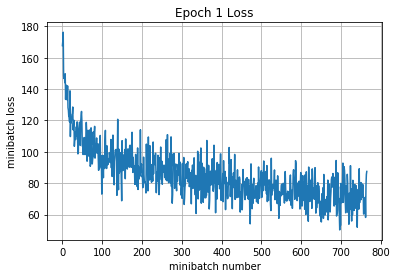

Validation
Epoch 1, Overall loss = 1.75 and accuracy of 0.462
Iteration 0: with minibatch training loss = 1.05 and accuracy of 0.56
Iteration 100: with minibatch training loss = 0.981 and accuracy of 0.67
Iteration 200: with minibatch training loss = 0.919 and accuracy of 0.64
Iteration 300: with minibatch training loss = 0.973 and accuracy of 0.64
Iteration 400: with minibatch training loss = 0.958 and accuracy of 0.69
Iteration 500: with minibatch training loss = 1.22 and accuracy of 0.58
Iteration 600: with minibatch training loss = 0.794 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.984 and accuracy of 0.59
Epoch 1, Overall loss = 0.977 and accuracy of 0.657


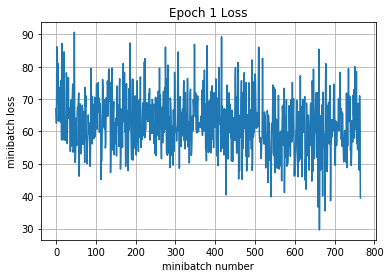

Validation
Epoch 1, Overall loss = 1.15 and accuracy of 0.613
Iteration 0: with minibatch training loss = 0.745 and accuracy of 0.69
Iteration 100: with minibatch training loss = 0.727 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.597 and accuracy of 0.78
Iteration 300: with minibatch training loss = 1.09 and accuracy of 0.58
Iteration 400: with minibatch training loss = 0.74 and accuracy of 0.67
Iteration 500: with minibatch training loss = 0.754 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.877 and accuracy of 0.64
Iteration 700: with minibatch training loss = 0.986 and accuracy of 0.7
Epoch 1, Overall loss = 0.818 and accuracy of 0.713


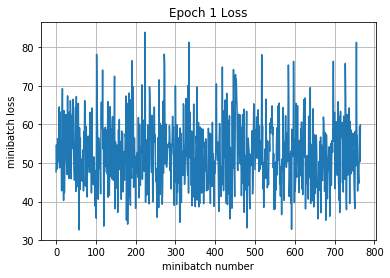

Validation
Epoch 1, Overall loss = 1.02 and accuracy of 0.667
Iteration 0: with minibatch training loss = 0.633 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.767 and accuracy of 0.72
Iteration 200: with minibatch training loss = 0.756 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.808 and accuracy of 0.7
Iteration 400: with minibatch training loss = 0.678 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.576 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.741 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.517 and accuracy of 0.83
Epoch 1, Overall loss = 0.695 and accuracy of 0.757


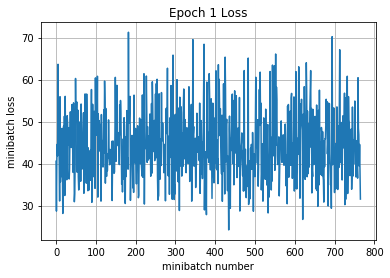

Validation
Epoch 1, Overall loss = 0.901 and accuracy of 0.697
Iteration 0: with minibatch training loss = 0.665 and accuracy of 0.72
Iteration 100: with minibatch training loss = 0.636 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.588 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.548 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.702 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.582 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.465 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.704 and accuracy of 0.8
Epoch 1, Overall loss = 0.587 and accuracy of 0.798


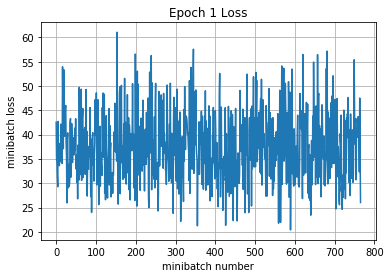

Validation
Epoch 1, Overall loss = 0.907 and accuracy of 0.718
Iteration 0: with minibatch training loss = 0.285 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.553 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.441 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.451 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.418 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.475 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.477 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.615 and accuracy of 0.78
Epoch 1, Overall loss = 0.486 and accuracy of 0.83


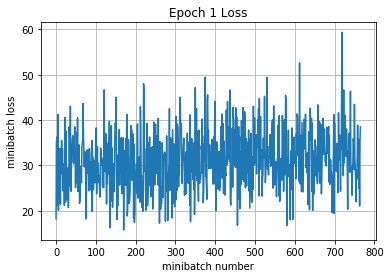

Validation
Epoch 1, Overall loss = 0.858 and accuracy of 0.719
Iteration 0: with minibatch training loss = 0.322 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.184 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.418 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.486 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.469 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.474 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.583 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.345 and accuracy of 0.91
Epoch 1, Overall loss = 0.396 and accuracy of 0.865


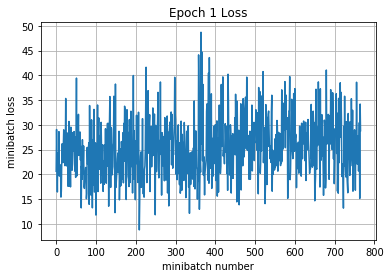

Validation
Epoch 1, Overall loss = 0.928 and accuracy of 0.721
Iteration 0: with minibatch training loss = 0.367 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.199 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.217 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.29 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.351 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.221 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.27 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.288 and accuracy of 0.89
Epoch 1, Overall loss = 0.305 and accuracy of 0.898


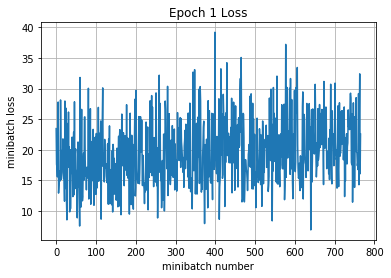

Validation
Epoch 1, Overall loss = 0.991 and accuracy of 0.715
Iteration 0: with minibatch training loss = 0.19 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.0876 and accuracy of 0.98
Iteration 200: with minibatch training loss = 0.211 and accuracy of 0.97
Iteration 300: with minibatch training loss = 0.232 and accuracy of 0.95
Iteration 400: with minibatch training loss = 0.287 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.191 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.178 and accuracy of 0.95
Iteration 700: with minibatch training loss = 0.24 and accuracy of 0.91
Epoch 1, Overall loss = 0.232 and accuracy of 0.924


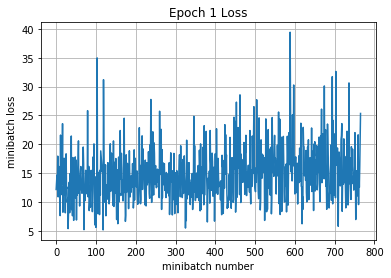

Validation
Epoch 1, Overall loss = 1.02 and accuracy of 0.707
Iteration 0: with minibatch training loss = 0.176 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.112 and accuracy of 0.98
Iteration 200: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 300: with minibatch training loss = 0.0963 and accuracy of 0.98
Iteration 400: with minibatch training loss = 0.142 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.354 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.113 and accuracy of 0.95
Iteration 700: with minibatch training loss = 0.177 and accuracy of 0.94
Epoch 1, Overall loss = 0.173 and accuracy of 0.945


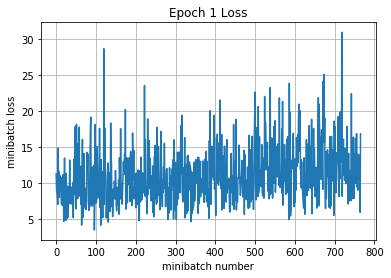

Validation
Epoch 1, Overall loss = 1.09 and accuracy of 0.721


In [45]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
num_epochs = 10
for i in range(num_epochs):
    run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True)
    print('Validation')
    run_model(sess,y_out,mean_loss,X_val,y_val,1,64)
    

In [46]:
# Test your model here, and make sure 
# the output of this cell is the accuracy
# of your best model on the training and val sets
# We're looking for >= 70% accuracy on Validation
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 0.132 and accuracy of 0.961
Validation
Epoch 1, Overall loss = 1.1 and accuracy of 0.721


(1.0951769027709961, 0.72099999999999997)

In [61]:
## As we clearly see , there is overfitting. We are able to achieve 72 percent. Now I change the code a little bit to 
## include dropout and modify the architecture a little.

def run_model(session, predict, loss_val, Xd, yd,
              epochs=1, batch_size=64, print_every=100,
              training=None, plot_losses=False,drop_o = 1):
    # have tensorflow compute accuracy
    correct_prediction = tf.equal(tf.argmax(predict,1), y)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    # shuffle indicies
    train_indicies = np.arange(Xd.shape[0])
    np.random.shuffle(train_indicies)

    training_now = training is not None
    
    # setting up variables we want to compute (and optimizing)
    # if we have a training function, add that to things we compute
    variables = [mean_loss,correct_prediction,accuracy]
    if training_now:
        variables[-1] = training
    
    # counter 
    iter_cnt = 0
    for e in range(epochs):
        # keep track of losses and accuracy
        correct = 0
        losses = []
        # make sure we iterate over the dataset once
        for i in range(int(math.ceil(Xd.shape[0]/batch_size))):
            # generate indicies for the batch
            start_idx = (i*batch_size)%X_train.shape[0]
            idx = train_indicies[start_idx:start_idx+batch_size]
            
            # create a feed dictionary for this batch
            if(training_now):
                feed_dict = {X: Xd[idx,:],
                             y: yd[idx],
                             is_training: training_now,
                             dropout: drop_o}
            else :
                feed_dict = {X: Xd[idx,:],
                             y: yd[idx],
                             is_training: training_now,
                             dropout: 1}
            # get batch size
            actual_batch_size = yd[i:i+batch_size].shape[0]
            
            # have tensorflow compute loss and correct predictions
            # and (if given) perform a training step
            loss, corr, _ = session.run(variables,feed_dict=feed_dict)
            
            # aggregate performance stats
            losses.append(loss*actual_batch_size)
            correct += np.sum(corr)
            
            # print every now and then
            if training_now and (iter_cnt % print_every) == 0:
                print("Iteration {0}: with minibatch training loss = {1:.3g} and accuracy of {2:.2g}"\
                      .format(iter_cnt,loss,np.sum(corr)/actual_batch_size))
            iter_cnt += 1
        total_correct = correct/Xd.shape[0]
        total_loss = np.sum(losses)/Xd.shape[0]
        print("Epoch {2}, Overall loss = {0:.3g} and accuracy of {1:.3g}"\
              .format(total_loss,total_correct,e+1))
        if plot_losses:
            plt.plot(losses)
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(e+1))
            plt.xlabel('minibatch number')
            plt.ylabel('minibatch loss')
            plt.show()
    return total_loss,total_correct


In [33]:
def my_model(X,y,drop_o,is_training):
    
    W_conv = tf.get_variable("Wconv",shape = [7,7,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(X, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn1')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    W_conv2 = tf.get_variable("Wconv2",shape = [5,5,32,64])
    b_conv2 = tf.get_variable("bconv2",shape = [64])
    a1 = tf.nn.conv2d(a1, W_conv2, strides=[1,1,1,1], padding='SAME') + b_conv2
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn2')
    a1 = tf.nn.relu(a1)
    
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
   
    W_conv3 = tf.get_variable("Wconv3",shape = [3,3,64,96])
    b_conv3 = tf.get_variable("bconv3",shape = [96])
    a1 = tf.nn.conv2d(a1, W_conv3, strides=[1,1,1,1], padding='SAME') + b_conv3
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn3')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.dropout(a1,drop_o)
    #a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    a1_flat = tf.reshape(a1,[-1,8*8*96])
    W1 = tf.get_variable("W1",shape = [8*8*96,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,1024])
    b2 = tf.get_variable("b2",shape = [1024])
    W3 = tf.get_variable("W3",shape = [1024,10])
    b3 = tf.get_variable("b3",shape = [10])
    
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    affine = tf.matmul(affine,W2) + b2
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    y_out = tf.matmul(affine,W2) + b2
    return y_out

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)
dropout = tf.placeholder(tf.float32, shape = ())

y_out = my_model(X,y,dropout,is_training)
mean_loss = None
optimizer = None

total_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_out,labels = y)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(1e-4)

# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)


Training
Iteration 0: with minibatch training loss = 8.16 and accuracy of 0
Iteration 100: with minibatch training loss = 2.65 and accuracy of 0.19
Iteration 200: with minibatch training loss = 2.2 and accuracy of 0.23
Iteration 300: with minibatch training loss = 2.04 and accuracy of 0.33
Iteration 400: with minibatch training loss = 2.01 and accuracy of 0.36
Iteration 500: with minibatch training loss = 2.25 and accuracy of 0.3
Iteration 600: with minibatch training loss = 2.07 and accuracy of 0.28
Iteration 700: with minibatch training loss = 1.63 and accuracy of 0.42
Epoch 1, Overall loss = 2.3 and accuracy of 0.261


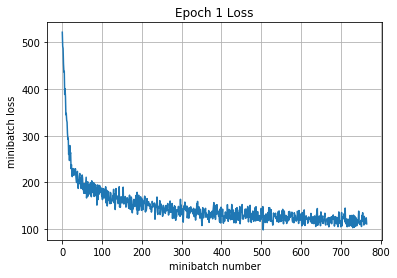

Validation
Epoch 1, Overall loss = 2.9 and accuracy of 0.36
Iteration 0: with minibatch training loss = 1.88 and accuracy of 0.3
Iteration 100: with minibatch training loss = 1.68 and accuracy of 0.25
Iteration 200: with minibatch training loss = 1.73 and accuracy of 0.42
Iteration 300: with minibatch training loss = 1.88 and accuracy of 0.31
Iteration 400: with minibatch training loss = 1.63 and accuracy of 0.42
Iteration 500: with minibatch training loss = 1.51 and accuracy of 0.44
Iteration 600: with minibatch training loss = 1.63 and accuracy of 0.39
Iteration 700: with minibatch training loss = 1.43 and accuracy of 0.42
Epoch 1, Overall loss = 1.67 and accuracy of 0.396


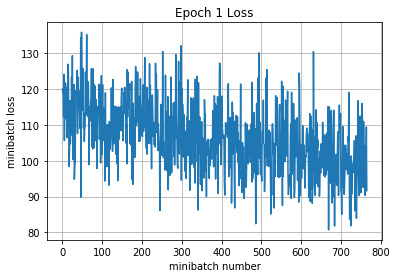

Validation
Epoch 1, Overall loss = 1.76 and accuracy of 0.465
Iteration 0: with minibatch training loss = 1.55 and accuracy of 0.38
Iteration 100: with minibatch training loss = 1.59 and accuracy of 0.42
Iteration 200: with minibatch training loss = 1.68 and accuracy of 0.45
Iteration 300: with minibatch training loss = 1.49 and accuracy of 0.47
Iteration 400: with minibatch training loss = 1.3 and accuracy of 0.39
Iteration 500: with minibatch training loss = 1.45 and accuracy of 0.45
Iteration 600: with minibatch training loss = 1.54 and accuracy of 0.42
Iteration 700: with minibatch training loss = 1.41 and accuracy of 0.47
Epoch 1, Overall loss = 1.49 and accuracy of 0.453


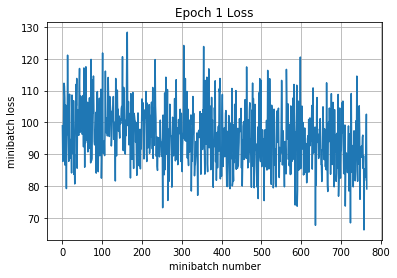

Validation
Epoch 1, Overall loss = 1.39 and accuracy of 0.539
Iteration 0: with minibatch training loss = 1.25 and accuracy of 0.52
Iteration 100: with minibatch training loss = 1.24 and accuracy of 0.53
Iteration 200: with minibatch training loss = 1.48 and accuracy of 0.47
Iteration 300: with minibatch training loss = 1.34 and accuracy of 0.53
Iteration 400: with minibatch training loss = 1.49 and accuracy of 0.45
Iteration 500: with minibatch training loss = 1.12 and accuracy of 0.62
Iteration 600: with minibatch training loss = 1.41 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.44 and accuracy of 0.53
Epoch 1, Overall loss = 1.38 and accuracy of 0.497


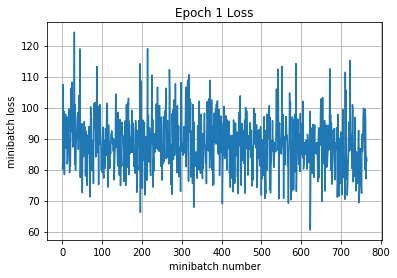

Validation
Epoch 1, Overall loss = 1.25 and accuracy of 0.578
Iteration 0: with minibatch training loss = 1.41 and accuracy of 0.44
Iteration 100: with minibatch training loss = 1.67 and accuracy of 0.36
Iteration 200: with minibatch training loss = 1.47 and accuracy of 0.42
Iteration 300: with minibatch training loss = 1.41 and accuracy of 0.5
Iteration 400: with minibatch training loss = 1.15 and accuracy of 0.56
Iteration 500: with minibatch training loss = 0.975 and accuracy of 0.59
Iteration 600: with minibatch training loss = 1.22 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.06 and accuracy of 0.59
Epoch 1, Overall loss = 1.29 and accuracy of 0.531


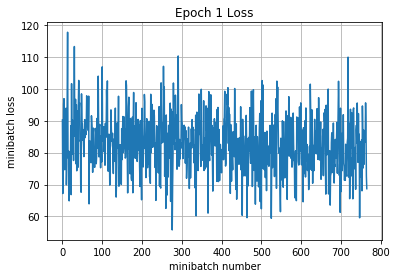

Validation
Epoch 1, Overall loss = 1.14 and accuracy of 0.61
Iteration 0: with minibatch training loss = 1.36 and accuracy of 0.48
Iteration 100: with minibatch training loss = 1.01 and accuracy of 0.61
Iteration 200: with minibatch training loss = 1.37 and accuracy of 0.62
Iteration 300: with minibatch training loss = 1.17 and accuracy of 0.56
Iteration 400: with minibatch training loss = 1.19 and accuracy of 0.56
Iteration 500: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 600: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 700: with minibatch training loss = 0.886 and accuracy of 0.62
Epoch 1, Overall loss = 1.21 and accuracy of 0.565


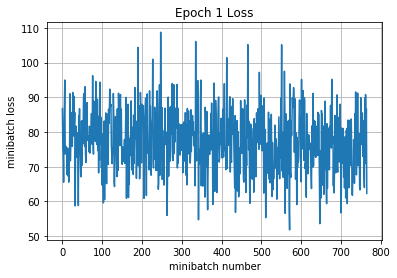

Validation
Epoch 1, Overall loss = 1.1 and accuracy of 0.616
Iteration 0: with minibatch training loss = 1.22 and accuracy of 0.58
Iteration 100: with minibatch training loss = 1.14 and accuracy of 0.61
Iteration 200: with minibatch training loss = 1.32 and accuracy of 0.64
Iteration 300: with minibatch training loss = 1.16 and accuracy of 0.55
Iteration 400: with minibatch training loss = 1.3 and accuracy of 0.5
Iteration 500: with minibatch training loss = 0.985 and accuracy of 0.69
Iteration 600: with minibatch training loss = 1 and accuracy of 0.67
Iteration 700: with minibatch training loss = 1.13 and accuracy of 0.53
Epoch 1, Overall loss = 1.15 and accuracy of 0.587


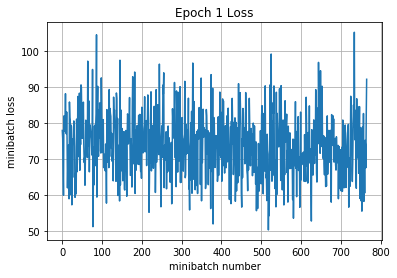

Validation
Epoch 1, Overall loss = 1.04 and accuracy of 0.652
Iteration 0: with minibatch training loss = 1.34 and accuracy of 0.47
Iteration 100: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 200: with minibatch training loss = 1.15 and accuracy of 0.52
Iteration 300: with minibatch training loss = 0.959 and accuracy of 0.64
Iteration 400: with minibatch training loss = 1.11 and accuracy of 0.62
Iteration 500: with minibatch training loss = 1.03 and accuracy of 0.7
Iteration 600: with minibatch training loss = 1.02 and accuracy of 0.66
Iteration 700: with minibatch training loss = 1.29 and accuracy of 0.58
Epoch 1, Overall loss = 1.11 and accuracy of 0.602


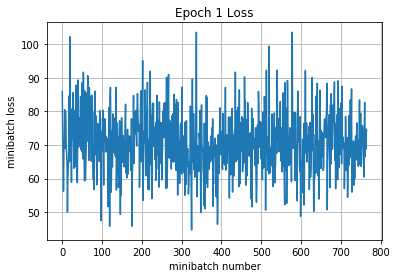

Validation
Epoch 1, Overall loss = 1 and accuracy of 0.681
Iteration 0: with minibatch training loss = 1 and accuracy of 0.62
Iteration 100: with minibatch training loss = 1.02 and accuracy of 0.59
Iteration 200: with minibatch training loss = 0.806 and accuracy of 0.69
Iteration 300: with minibatch training loss = 1.09 and accuracy of 0.64
Iteration 400: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 500: with minibatch training loss = 1.29 and accuracy of 0.61
Iteration 600: with minibatch training loss = 1.06 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.22 and accuracy of 0.58
Epoch 1, Overall loss = 1.06 and accuracy of 0.618


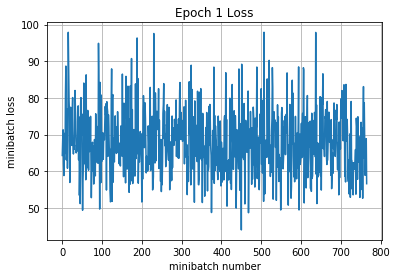

Validation
Epoch 1, Overall loss = 0.984 and accuracy of 0.667
Iteration 0: with minibatch training loss = 0.963 and accuracy of 0.69
Iteration 100: with minibatch training loss = 1.17 and accuracy of 0.64
Iteration 200: with minibatch training loss = 0.962 and accuracy of 0.62
Iteration 300: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 400: with minibatch training loss = 1.06 and accuracy of 0.64
Iteration 500: with minibatch training loss = 0.926 and accuracy of 0.69
Iteration 600: with minibatch training loss = 0.918 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.901 and accuracy of 0.67
Epoch 1, Overall loss = 1.03 and accuracy of 0.63


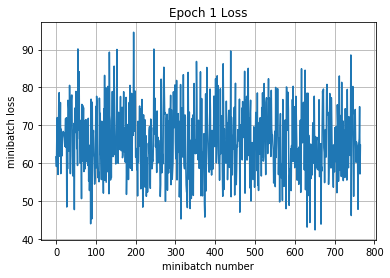

Validation
Epoch 1, Overall loss = 0.942 and accuracy of 0.691
Iteration 0: with minibatch training loss = 0.915 and accuracy of 0.7
Iteration 100: with minibatch training loss = 1.14 and accuracy of 0.55
Iteration 200: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 300: with minibatch training loss = 0.907 and accuracy of 0.61
Iteration 400: with minibatch training loss = 1.08 and accuracy of 0.56
Iteration 500: with minibatch training loss = 0.908 and accuracy of 0.69
Iteration 600: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 700: with minibatch training loss = 0.849 and accuracy of 0.69
Epoch 1, Overall loss = 0.994 and accuracy of 0.646


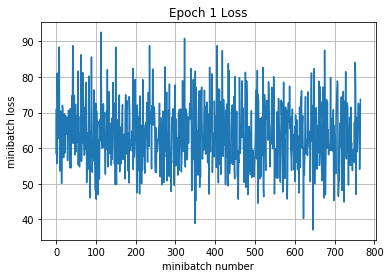

Validation
Epoch 1, Overall loss = 0.909 and accuracy of 0.694
Iteration 0: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 100: with minibatch training loss = 0.579 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.819 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.953 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.952 and accuracy of 0.61
Iteration 500: with minibatch training loss = 1.16 and accuracy of 0.66
Iteration 600: with minibatch training loss = 1.02 and accuracy of 0.66
Iteration 700: with minibatch training loss = 0.784 and accuracy of 0.7
Epoch 1, Overall loss = 0.96 and accuracy of 0.658


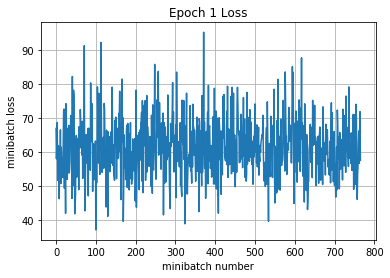

Validation
Epoch 1, Overall loss = 0.886 and accuracy of 0.703
Iteration 0: with minibatch training loss = 0.801 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.94 and accuracy of 0.67
Iteration 200: with minibatch training loss = 1.05 and accuracy of 0.7
Iteration 300: with minibatch training loss = 1.23 and accuracy of 0.61
Iteration 400: with minibatch training loss = 0.889 and accuracy of 0.69
Iteration 500: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 600: with minibatch training loss = 0.775 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.904 and accuracy of 0.67
Epoch 1, Overall loss = 0.936 and accuracy of 0.669


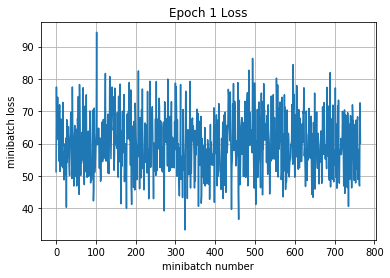

Validation
Epoch 1, Overall loss = 0.891 and accuracy of 0.703
Iteration 0: with minibatch training loss = 0.799 and accuracy of 0.67
Iteration 100: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 200: with minibatch training loss = 0.882 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.819 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.916 and accuracy of 0.69
Iteration 500: with minibatch training loss = 1.06 and accuracy of 0.64
Iteration 600: with minibatch training loss = 0.772 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.631 and accuracy of 0.75
Epoch 1, Overall loss = 0.905 and accuracy of 0.679


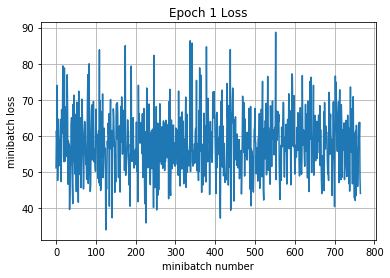

Validation
Epoch 1, Overall loss = 0.848 and accuracy of 0.694
Iteration 0: with minibatch training loss = 0.966 and accuracy of 0.69
Iteration 100: with minibatch training loss = 1.12 and accuracy of 0.56
Iteration 200: with minibatch training loss = 0.902 and accuracy of 0.69
Iteration 300: with minibatch training loss = 0.711 and accuracy of 0.75
Iteration 400: with minibatch training loss = 1.19 and accuracy of 0.55
Iteration 500: with minibatch training loss = 0.881 and accuracy of 0.64
Iteration 600: with minibatch training loss = 0.995 and accuracy of 0.66
Iteration 700: with minibatch training loss = 0.798 and accuracy of 0.64
Epoch 1, Overall loss = 0.886 and accuracy of 0.686


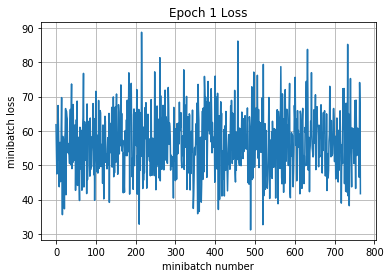

Validation
Epoch 1, Overall loss = 0.818 and accuracy of 0.72
Iteration 0: with minibatch training loss = 1.17 and accuracy of 0.5
Iteration 100: with minibatch training loss = 0.759 and accuracy of 0.66
Iteration 200: with minibatch training loss = 0.846 and accuracy of 0.7
Iteration 300: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 400: with minibatch training loss = 0.637 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.773 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.828 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.723 and accuracy of 0.77
Epoch 1, Overall loss = 0.864 and accuracy of 0.692


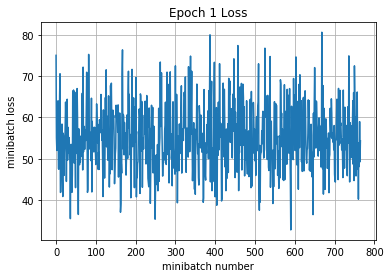

Validation
Epoch 1, Overall loss = 0.808 and accuracy of 0.727
Iteration 0: with minibatch training loss = 0.663 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.688 and accuracy of 0.78
Iteration 200: with minibatch training loss = 1.11 and accuracy of 0.56
Iteration 300: with minibatch training loss = 0.788 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.875 and accuracy of 0.69
Iteration 500: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 600: with minibatch training loss = 0.877 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.849 and accuracy of 0.73
Epoch 1, Overall loss = 0.838 and accuracy of 0.703


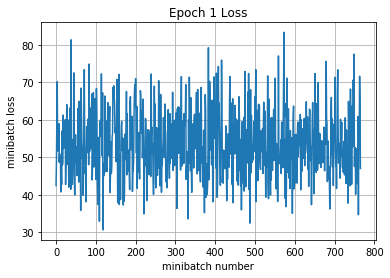

Validation
Epoch 1, Overall loss = 0.766 and accuracy of 0.753
Iteration 0: with minibatch training loss = 0.882 and accuracy of 0.66
Iteration 100: with minibatch training loss = 0.752 and accuracy of 0.7
Iteration 200: with minibatch training loss = 0.838 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.771 and accuracy of 0.7
Iteration 400: with minibatch training loss = 0.74 and accuracy of 0.67
Iteration 500: with minibatch training loss = 0.823 and accuracy of 0.7
Iteration 600: with minibatch training loss = 0.816 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.692 and accuracy of 0.75
Epoch 1, Overall loss = 0.814 and accuracy of 0.711


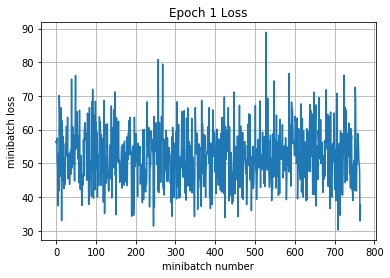

Validation
Epoch 1, Overall loss = 0.754 and accuracy of 0.75
Iteration 0: with minibatch training loss = 0.958 and accuracy of 0.61
Iteration 100: with minibatch training loss = 0.808 and accuracy of 0.7
Iteration 200: with minibatch training loss = 0.704 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.907 and accuracy of 0.66
Iteration 400: with minibatch training loss = 0.584 and accuracy of 0.83
Iteration 500: with minibatch training loss = 1.12 and accuracy of 0.59
Iteration 600: with minibatch training loss = 0.893 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.81 and accuracy of 0.78
Epoch 1, Overall loss = 0.801 and accuracy of 0.714


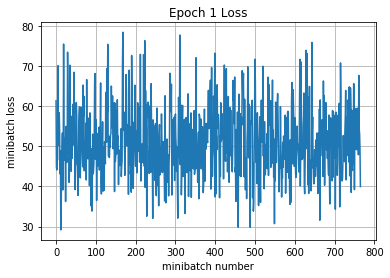

Validation
Epoch 1, Overall loss = 0.793 and accuracy of 0.73
Iteration 0: with minibatch training loss = 0.67 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.965 and accuracy of 0.62
Iteration 200: with minibatch training loss = 0.702 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.547 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.849 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.827 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.63 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.623 and accuracy of 0.75
Epoch 1, Overall loss = 0.782 and accuracy of 0.723


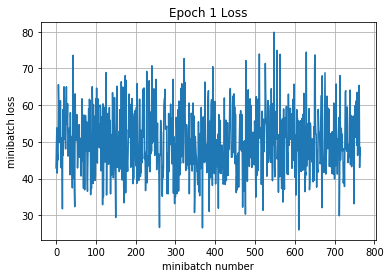

Validation
Epoch 1, Overall loss = 0.747 and accuracy of 0.753
Iteration 0: with minibatch training loss = 0.799 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.8 and accuracy of 0.7
Iteration 200: with minibatch training loss = 0.749 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.704 and accuracy of 0.7
Iteration 400: with minibatch training loss = 0.775 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.727 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.737 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.651 and accuracy of 0.75
Epoch 1, Overall loss = 0.766 and accuracy of 0.728


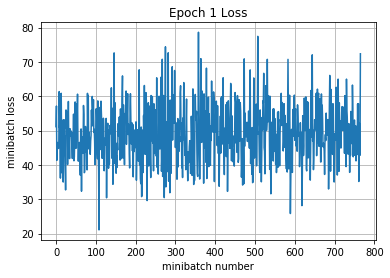

Validation
Epoch 1, Overall loss = 0.713 and accuracy of 0.761
Iteration 0: with minibatch training loss = 0.739 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.65 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.841 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.61 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.723 and accuracy of 0.7
Iteration 500: with minibatch training loss = 0.839 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.796 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.964 and accuracy of 0.58
Epoch 1, Overall loss = 0.746 and accuracy of 0.733


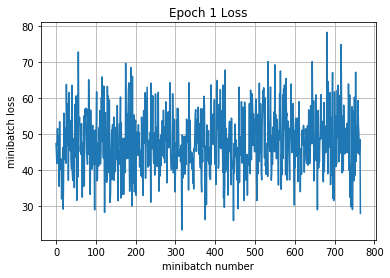

Validation
Epoch 1, Overall loss = 0.699 and accuracy of 0.773
Iteration 0: with minibatch training loss = 0.585 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.815 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.798 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.761 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.641 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.635 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.641 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.671 and accuracy of 0.75
Epoch 1, Overall loss = 0.738 and accuracy of 0.739


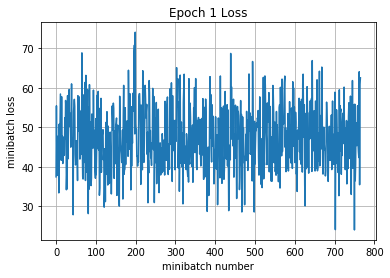

Validation
Epoch 1, Overall loss = 0.724 and accuracy of 0.759
Iteration 0: with minibatch training loss = 0.832 and accuracy of 0.66
Iteration 100: with minibatch training loss = 0.518 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.575 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.586 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.566 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.921 and accuracy of 0.66
Iteration 600: with minibatch training loss = 0.476 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.659 and accuracy of 0.77
Epoch 1, Overall loss = 0.719 and accuracy of 0.745


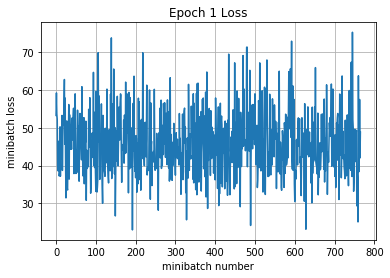

Validation
Epoch 1, Overall loss = 0.723 and accuracy of 0.759
Iteration 0: with minibatch training loss = 0.895 and accuracy of 0.67
Iteration 100: with minibatch training loss = 0.767 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.763 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.712 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.823 and accuracy of 0.73
Iteration 500: with minibatch training loss = 0.796 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.56 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.604 and accuracy of 0.72
Epoch 1, Overall loss = 0.705 and accuracy of 0.75


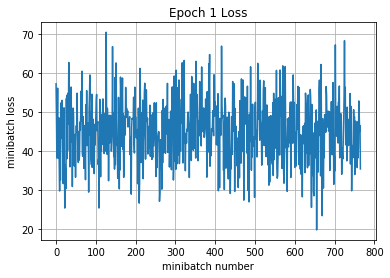

Validation
Epoch 1, Overall loss = 0.699 and accuracy of 0.778
Iteration 0: with minibatch training loss = 0.616 and accuracy of 0.7
Iteration 100: with minibatch training loss = 0.633 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.651 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.705 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.867 and accuracy of 0.67
Iteration 500: with minibatch training loss = 0.898 and accuracy of 0.67
Iteration 600: with minibatch training loss = 0.764 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.854 and accuracy of 0.73
Epoch 1, Overall loss = 0.691 and accuracy of 0.754


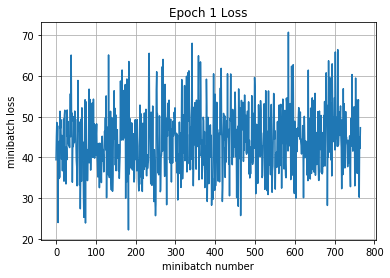

Validation
Epoch 1, Overall loss = 0.669 and accuracy of 0.776
Iteration 0: with minibatch training loss = 0.672 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.699 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.52 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.564 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.655 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.87 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.743 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.458 and accuracy of 0.84
Epoch 1, Overall loss = 0.674 and accuracy of 0.762


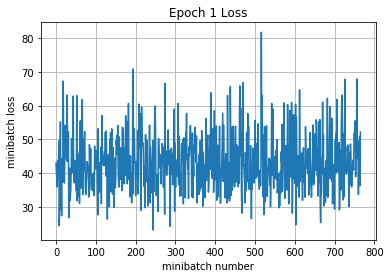

Validation
Epoch 1, Overall loss = 0.649 and accuracy of 0.787
Iteration 0: with minibatch training loss = 0.671 and accuracy of 0.69
Iteration 100: with minibatch training loss = 0.564 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.644 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.501 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.536 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.675 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.556 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.698 and accuracy of 0.75
Epoch 1, Overall loss = 0.669 and accuracy of 0.762


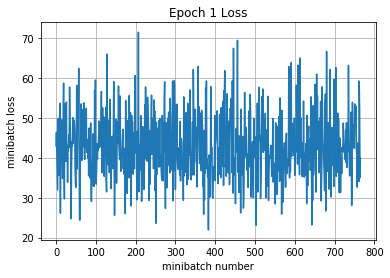

Validation
Epoch 1, Overall loss = 0.652 and accuracy of 0.786
Iteration 0: with minibatch training loss = 0.585 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.654 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.705 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.652 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.706 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.64 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.49 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.693 and accuracy of 0.78
Epoch 1, Overall loss = 0.65 and accuracy of 0.768


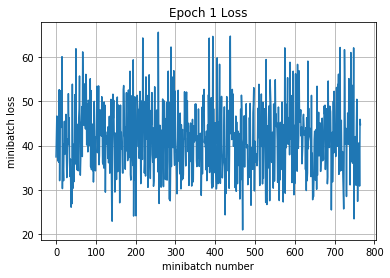

Validation
Epoch 1, Overall loss = 0.65 and accuracy of 0.782
Iteration 0: with minibatch training loss = 0.693 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.615 and accuracy of 0.73
Iteration 200: with minibatch training loss = 0.612 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.634 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.572 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.968 and accuracy of 0.67
Iteration 600: with minibatch training loss = 0.521 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.505 and accuracy of 0.83
Epoch 1, Overall loss = 0.639 and accuracy of 0.774


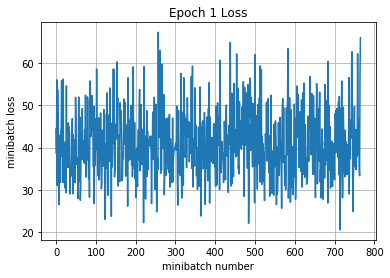

Validation
Epoch 1, Overall loss = 0.615 and accuracy of 0.792
Iteration 0: with minibatch training loss = 0.562 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.513 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.823 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.601 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.67 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.453 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.62 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.49 and accuracy of 0.84
Epoch 1, Overall loss = 0.628 and accuracy of 0.777


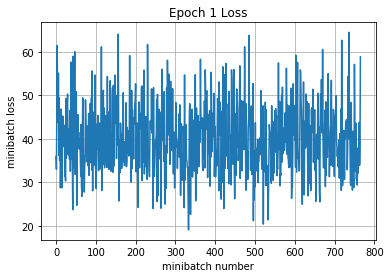

Validation
Epoch 1, Overall loss = 0.616 and accuracy of 0.789
Iteration 0: with minibatch training loss = 0.638 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.731 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.433 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.513 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.534 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.582 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.339 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.576 and accuracy of 0.77
Epoch 1, Overall loss = 0.619 and accuracy of 0.781


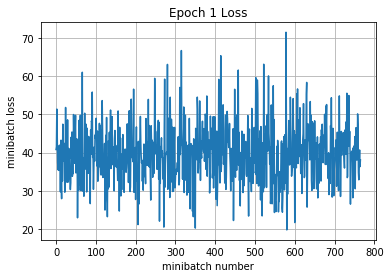

Validation
Epoch 1, Overall loss = 0.622 and accuracy of 0.798
Iteration 0: with minibatch training loss = 0.782 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.619 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.656 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.558 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.449 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.56 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.736 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.646 and accuracy of 0.75
Epoch 1, Overall loss = 0.61 and accuracy of 0.782


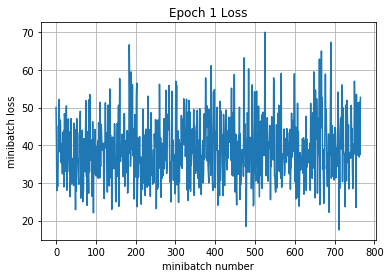

Validation
Epoch 1, Overall loss = 0.651 and accuracy of 0.785
Iteration 0: with minibatch training loss = 0.53 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.454 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.585 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.579 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.778 and accuracy of 0.73
Iteration 500: with minibatch training loss = 0.465 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.617 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.542 and accuracy of 0.81
Epoch 1, Overall loss = 0.598 and accuracy of 0.79


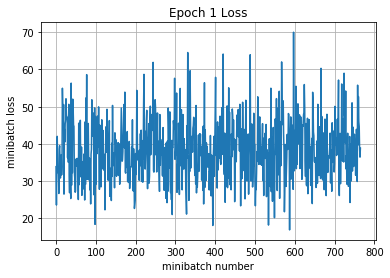

Validation
Epoch 1, Overall loss = 0.623 and accuracy of 0.793
Iteration 0: with minibatch training loss = 0.89 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.509 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.554 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.628 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.528 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.54 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.447 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.655 and accuracy of 0.75
Epoch 1, Overall loss = 0.584 and accuracy of 0.792


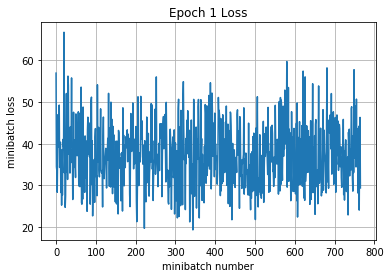

Validation
Epoch 1, Overall loss = 0.611 and accuracy of 0.798
Iteration 0: with minibatch training loss = 0.427 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.743 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.546 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.531 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.814 and accuracy of 0.7
Iteration 500: with minibatch training loss = 0.403 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.505 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.64 and accuracy of 0.81
Epoch 1, Overall loss = 0.575 and accuracy of 0.796


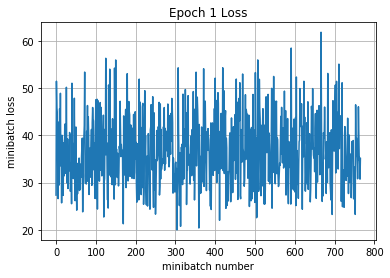

Validation
Epoch 1, Overall loss = 0.611 and accuracy of 0.793
Iteration 0: with minibatch training loss = 0.678 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.762 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.728 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.457 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.367 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.688 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.529 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.588 and accuracy of 0.78
Epoch 1, Overall loss = 0.566 and accuracy of 0.798


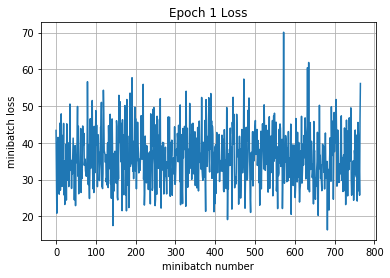

Validation
Epoch 1, Overall loss = 0.587 and accuracy of 0.804
Iteration 0: with minibatch training loss = 0.594 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.584 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.675 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.845 and accuracy of 0.7
Iteration 400: with minibatch training loss = 0.424 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.463 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.695 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.709 and accuracy of 0.77
Epoch 1, Overall loss = 0.556 and accuracy of 0.804


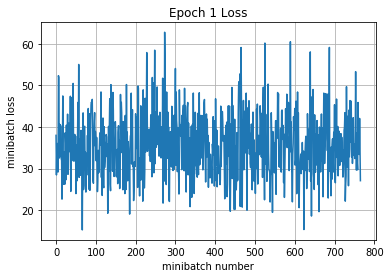

Validation
Epoch 1, Overall loss = 0.588 and accuracy of 0.798
Iteration 0: with minibatch training loss = 0.659 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.698 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.38 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.609 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.653 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.432 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.386 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.602 and accuracy of 0.78
Epoch 1, Overall loss = 0.551 and accuracy of 0.803


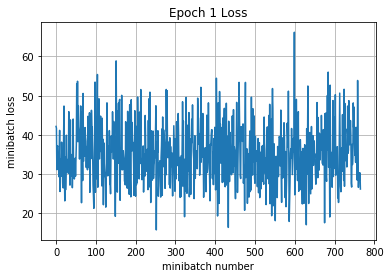

Validation
Epoch 1, Overall loss = 0.578 and accuracy of 0.799
Iteration 0: with minibatch training loss = 0.494 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.515 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.385 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.424 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.527 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.56 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.852 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.447 and accuracy of 0.83
Epoch 1, Overall loss = 0.54 and accuracy of 0.807


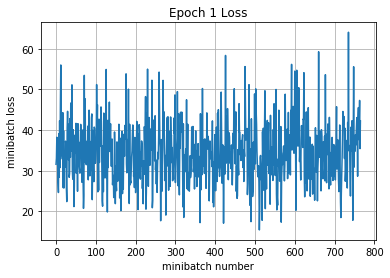

Validation
Epoch 1, Overall loss = 0.584 and accuracy of 0.807
Iteration 0: with minibatch training loss = 0.427 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.533 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.562 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.568 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.459 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.497 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.443 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.733 and accuracy of 0.77
Epoch 1, Overall loss = 0.534 and accuracy of 0.809


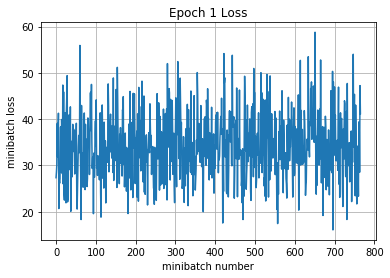

Validation
Epoch 1, Overall loss = 0.572 and accuracy of 0.81
Iteration 0: with minibatch training loss = 0.31 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.438 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.54 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.443 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.48 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.355 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.395 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.474 and accuracy of 0.84
Epoch 1, Overall loss = 0.523 and accuracy of 0.814


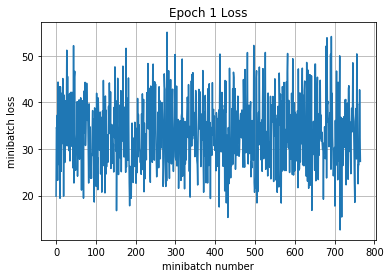

Validation
Epoch 1, Overall loss = 0.545 and accuracy of 0.828
Iteration 0: with minibatch training loss = 0.525 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.785 and accuracy of 0.66
Iteration 200: with minibatch training loss = 0.384 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.612 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.586 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.618 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.514 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.499 and accuracy of 0.81
Epoch 1, Overall loss = 0.51 and accuracy of 0.818


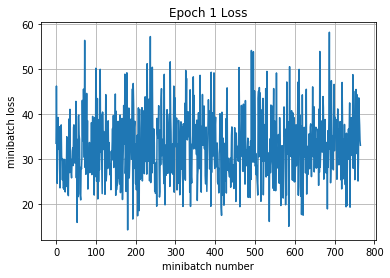

Validation
Epoch 1, Overall loss = 0.568 and accuracy of 0.803
Iteration 0: with minibatch training loss = 0.369 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.541 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.381 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.544 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.73 and accuracy of 0.7
Iteration 500: with minibatch training loss = 0.654 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.644 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.572 and accuracy of 0.75
Epoch 1, Overall loss = 0.507 and accuracy of 0.819


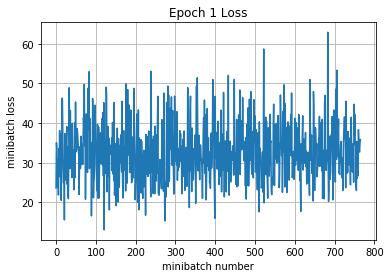

Validation
Epoch 1, Overall loss = 0.552 and accuracy of 0.82
Iteration 0: with minibatch training loss = 0.469 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.814 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.425 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.52 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.445 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.74 and accuracy of 0.69
Iteration 600: with minibatch training loss = 0.419 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.472 and accuracy of 0.86
Epoch 1, Overall loss = 0.499 and accuracy of 0.825


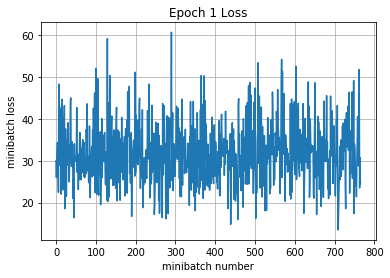

Validation
Epoch 1, Overall loss = 0.547 and accuracy of 0.815
Iteration 0: with minibatch training loss = 0.511 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.388 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.446 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.693 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.771 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.399 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.605 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.457 and accuracy of 0.81
Epoch 1, Overall loss = 0.492 and accuracy of 0.823


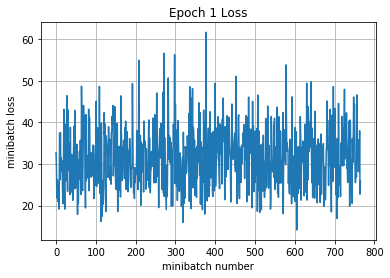

Validation
Epoch 1, Overall loss = 0.563 and accuracy of 0.82
Iteration 0: with minibatch training loss = 0.497 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.586 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.595 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.671 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.398 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.455 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.521 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.543 and accuracy of 0.78
Epoch 1, Overall loss = 0.482 and accuracy of 0.827


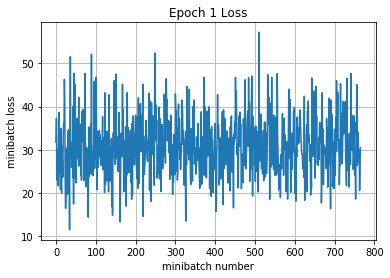

Validation
Epoch 1, Overall loss = 0.535 and accuracy of 0.817
Iteration 0: with minibatch training loss = 0.762 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.509 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.427 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.434 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.526 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.364 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.373 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.353 and accuracy of 0.94
Epoch 1, Overall loss = 0.478 and accuracy of 0.83


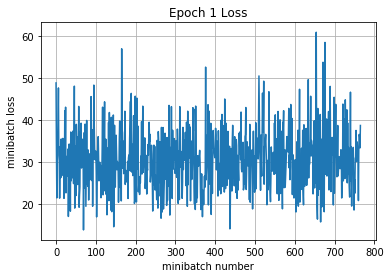

Validation
Epoch 1, Overall loss = 0.578 and accuracy of 0.809
Iteration 0: with minibatch training loss = 0.453 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.31 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.511 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.575 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.686 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.474 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.559 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.753 and accuracy of 0.75
Epoch 1, Overall loss = 0.472 and accuracy of 0.832


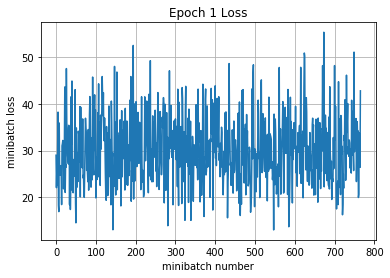

Validation
Epoch 1, Overall loss = 0.568 and accuracy of 0.811
Iteration 0: with minibatch training loss = 0.664 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.39 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.407 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.395 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.352 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.443 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.223 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.477 and accuracy of 0.84
Epoch 1, Overall loss = 0.461 and accuracy of 0.835


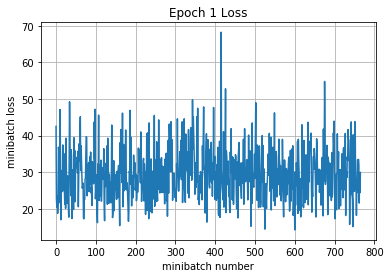

Validation
Epoch 1, Overall loss = 0.539 and accuracy of 0.826


In [34]:
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
num_epochs = 50
for i in range(num_epochs):
    run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True,drop_o = 0.5)
    print('Validation')
    run_model(sess,y_out,mean_loss,X_val,y_val,1,64)
    

In [35]:
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 0.226 and accuracy of 0.937
Validation
Epoch 1, Overall loss = 0.531 and accuracy of 0.826


(0.53095504760742185, 0.82599999999999996)

### Describe what you did here
In this cell you should also write an explanation of what you did, any additional features that you implemented, and any visualizations or graphs that you make in the process of training and evaluating your network

_On observing that initial model overfitted the results, I  added a dropout layer and also increased the complexity of model by introducing additional convolutional layer. We get a whooping 82.6 percent on the validation set. Moreover the overfitting reduced a lot, with the difference in training and validation accuracy being only around 10 percent. To further increase the accuracy, I am going to try two more things in the extra credit section below :
First is data augmentation. From the existing images, we generate more images using affine transformations. This has a lot of benefit. More training data always helps, it has an inherent regulariser effect, also the model will learn that image labels tend to be invariant to orientation or brightness/lighting and will learn more robus features.

Second is trying a much deeper convolutional neural network based on the idea of global average pooling._

### Test Set - Do this only once
Now that we've gotten a result that we're happy with, we test our final model on the test set. This would be the score we would achieve on a competition. Think about how this compares to your validation set accuracy.

In [36]:
print('Test')
run_model(sess,y_out,mean_loss,X_test,y_test,1,64)

Test
Epoch 1, Overall loss = 0.558 and accuracy of 0.809


(0.55766288738250736, 0.80879999999999996)

## Going further with TensorFlow

The next assignment will make heavy use of TensorFlow. You might also find it useful for your projects. 


# Extra Credit Description
If you implement any additional features for extra credit, clearly describe them here with pointers to any code in this or other files if applicable.

## 1.) Visualise the weights. In the cell below, i run the above model again for 10 epochs and plot the weights of the first convolutional layer to visualise them

I am able to get an accuracy of around 82 percent on the validation set with the model defined above which has three convolutional layers with 2 fully connected layers at the end. It uses dropout as the regularizer.

Now to further improve the accuracy, we are going to try two things:

## 1.) Data Augmentation : 

I will increase the training data by using data augmentation. New data can be generated from the images by randomly flipping the image left to right and doing some affine transformtions like increasing the brightness or contrast of images randomly .

The code snippet which achieves this is given :

```
image = tf.map_fn(lambda img: tf.image.random_flip_left_right(img), X)
image = tf.map_fn(lambda img: tf.image.random_brightness(img,max_delta=63),image)
image = tf.map_fn(lambda img: tf.image.random_contrast(img,lower=0.2, upper=1.8),image)       
image = tf.map_fn(lambda img: tf.image.per_image_standardization(img),image)
```

Using this augmented data, we train our model and tested on the original validation set.

** As seen in the below 3 cells,we are able to achieve an accuracy of 86.2 percent on the validation set.
Thus , just with data augmentation, the accuracy improved by nearly 4 points on the same architecture.**


## 2.) Trying a different architecture  (Global Average Pooling): 

This architecture is based on the idea of global average pooling, where I have convolutional layers till I get 1*1*(num_filters) size. Using this architecture did not help much and did not increase the performance of our model. 


Iteration 0: with minibatch training loss = 7.56 and accuracy of 0
Iteration 100: with minibatch training loss = 2.35 and accuracy of 0.27
Iteration 200: with minibatch training loss = 2.06 and accuracy of 0.3
Iteration 300: with minibatch training loss = 1.71 and accuracy of 0.33
Iteration 400: with minibatch training loss = 1.91 and accuracy of 0.44
Iteration 500: with minibatch training loss = 1.72 and accuracy of 0.42
Iteration 600: with minibatch training loss = 1.65 and accuracy of 0.36
Iteration 700: with minibatch training loss = 1.49 and accuracy of 0.39
Epoch 1, Overall loss = 1.83 and accuracy of 0.359


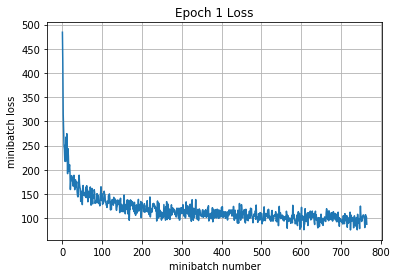

Iteration 800: with minibatch training loss = 1.51 and accuracy of 0.39
Iteration 900: with minibatch training loss = 1.42 and accuracy of 0.48
Iteration 1000: with minibatch training loss = 1.55 and accuracy of 0.41
Iteration 1100: with minibatch training loss = 1.53 and accuracy of 0.41
Iteration 1200: with minibatch training loss = 1.41 and accuracy of 0.42
Iteration 1300: with minibatch training loss = 1.38 and accuracy of 0.48
Iteration 1400: with minibatch training loss = 1.22 and accuracy of 0.58
Iteration 1500: with minibatch training loss = 1.51 and accuracy of 0.48
Epoch 2, Overall loss = 1.38 and accuracy of 0.5


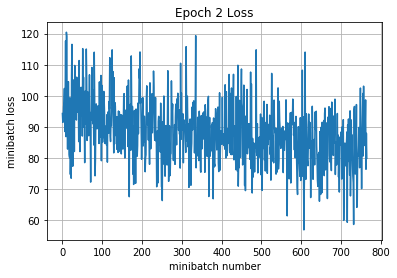

Iteration 1600: with minibatch training loss = 1.25 and accuracy of 0.55
Iteration 1700: with minibatch training loss = 0.885 and accuracy of 0.61
Iteration 1800: with minibatch training loss = 1.31 and accuracy of 0.55
Iteration 1900: with minibatch training loss = 1.04 and accuracy of 0.59
Iteration 2000: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 2100: with minibatch training loss = 1.14 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 1.25 and accuracy of 0.61
Epoch 3, Overall loss = 1.22 and accuracy of 0.565


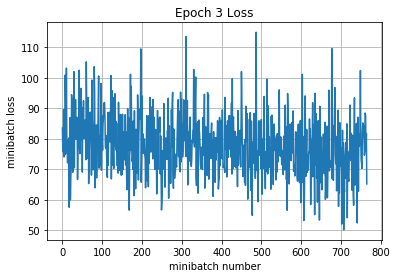

Iteration 2300: with minibatch training loss = 1.09 and accuracy of 0.64
Iteration 2400: with minibatch training loss = 1.38 and accuracy of 0.61
Iteration 2500: with minibatch training loss = 1.31 and accuracy of 0.61
Iteration 2600: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 2700: with minibatch training loss = 1.19 and accuracy of 0.61
Iteration 2800: with minibatch training loss = 0.828 and accuracy of 0.72
Iteration 2900: with minibatch training loss = 0.934 and accuracy of 0.66
Iteration 3000: with minibatch training loss = 0.902 and accuracy of 0.56
Epoch 4, Overall loss = 1.12 and accuracy of 0.602


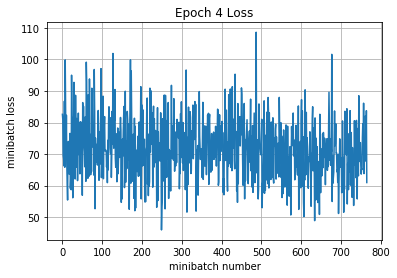

Iteration 3100: with minibatch training loss = 1.19 and accuracy of 0.61
Iteration 3200: with minibatch training loss = 1.21 and accuracy of 0.61
Iteration 3300: with minibatch training loss = 0.912 and accuracy of 0.72
Iteration 3400: with minibatch training loss = 0.826 and accuracy of 0.7
Iteration 3500: with minibatch training loss = 0.932 and accuracy of 0.67
Iteration 3600: with minibatch training loss = 1.27 and accuracy of 0.47
Iteration 3700: with minibatch training loss = 1.13 and accuracy of 0.59
Iteration 3800: with minibatch training loss = 0.913 and accuracy of 0.67
Epoch 5, Overall loss = 1.04 and accuracy of 0.635


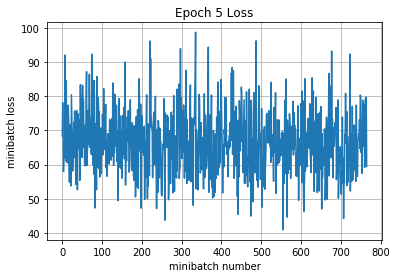

Iteration 3900: with minibatch training loss = 0.885 and accuracy of 0.64
Iteration 4000: with minibatch training loss = 1.13 and accuracy of 0.59
Iteration 4100: with minibatch training loss = 0.954 and accuracy of 0.64
Iteration 4200: with minibatch training loss = 0.967 and accuracy of 0.7
Iteration 4300: with minibatch training loss = 1.01 and accuracy of 0.7
Iteration 4400: with minibatch training loss = 0.664 and accuracy of 0.75
Iteration 4500: with minibatch training loss = 1.12 and accuracy of 0.55
Epoch 6, Overall loss = 0.982 and accuracy of 0.653


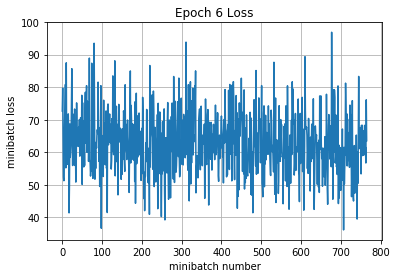

Iteration 4600: with minibatch training loss = 0.86 and accuracy of 0.8
Iteration 4700: with minibatch training loss = 0.964 and accuracy of 0.59
Iteration 4800: with minibatch training loss = 0.947 and accuracy of 0.61
Iteration 4900: with minibatch training loss = 0.884 and accuracy of 0.66
Iteration 5000: with minibatch training loss = 0.923 and accuracy of 0.69
Iteration 5100: with minibatch training loss = 0.9 and accuracy of 0.64
Iteration 5200: with minibatch training loss = 0.812 and accuracy of 0.69
Iteration 5300: with minibatch training loss = 1.07 and accuracy of 0.58
Epoch 7, Overall loss = 0.933 and accuracy of 0.675


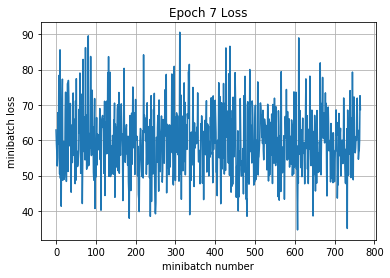

Iteration 5400: with minibatch training loss = 0.644 and accuracy of 0.75
Iteration 5500: with minibatch training loss = 0.948 and accuracy of 0.69
Iteration 5600: with minibatch training loss = 0.871 and accuracy of 0.75
Iteration 5700: with minibatch training loss = 0.814 and accuracy of 0.7
Iteration 5800: with minibatch training loss = 0.865 and accuracy of 0.8
Iteration 5900: with minibatch training loss = 0.936 and accuracy of 0.69
Iteration 6000: with minibatch training loss = 1.07 and accuracy of 0.64
Iteration 6100: with minibatch training loss = 0.822 and accuracy of 0.7
Epoch 8, Overall loss = 0.895 and accuracy of 0.687


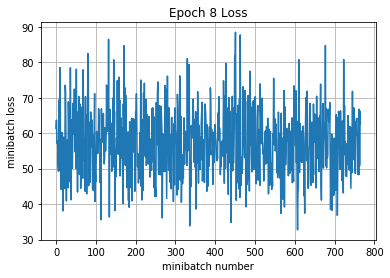

Iteration 6200: with minibatch training loss = 0.76 and accuracy of 0.73
Iteration 6300: with minibatch training loss = 0.7 and accuracy of 0.72
Iteration 6400: with minibatch training loss = 0.658 and accuracy of 0.7
Iteration 6500: with minibatch training loss = 0.817 and accuracy of 0.69
Iteration 6600: with minibatch training loss = 0.988 and accuracy of 0.62
Iteration 6700: with minibatch training loss = 0.764 and accuracy of 0.73
Iteration 6800: with minibatch training loss = 0.95 and accuracy of 0.66
Epoch 9, Overall loss = 0.855 and accuracy of 0.701


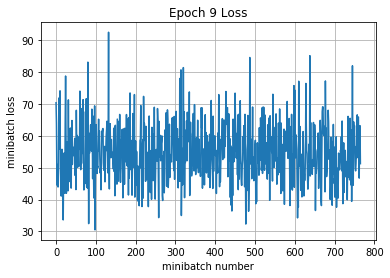

Iteration 6900: with minibatch training loss = 0.778 and accuracy of 0.69
Iteration 7000: with minibatch training loss = 1.05 and accuracy of 0.67
Iteration 7100: with minibatch training loss = 0.848 and accuracy of 0.7
Iteration 7200: with minibatch training loss = 0.748 and accuracy of 0.73
Iteration 7300: with minibatch training loss = 0.828 and accuracy of 0.67
Iteration 7400: with minibatch training loss = 1.04 and accuracy of 0.58
Iteration 7500: with minibatch training loss = 0.817 and accuracy of 0.67
Iteration 7600: with minibatch training loss = 0.775 and accuracy of 0.69
Epoch 10, Overall loss = 0.828 and accuracy of 0.71


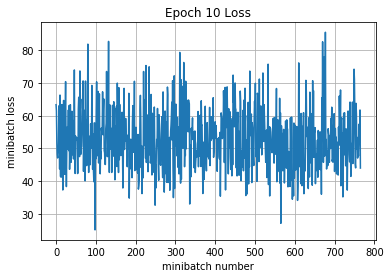

['model/Wconv:0', 'model/bconv:0', 'model/bn1/beta:0', 'model/bn1/gamma:0', 'model/Wconv2:0', 'model/bconv2:0', 'model/bn2/beta:0', 'model/bn2/gamma:0', 'model/Wconv3:0', 'model/bconv3:0', 'model/bn3/beta:0', 'model/bn3/gamma:0', 'model/W1:0', 'model/b1:0', 'model/W2:0', 'model/b2:0', 'model/W3:0', 'model/b3:0']
Tensor("model/Wconv/read:0", shape=(7, 7, 3, 32), dtype=float32)
(7, 7, 3, 32)


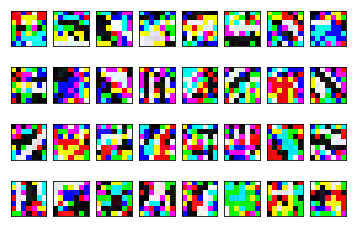

In [78]:
### Visualising Filter weights for the model above


sess = tf.Session()

sess.run(tf.global_variables_initializer())

run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True,drop_o = 0.5)

var  = tf.trainable_variables()
var = [v.name for v in tf.trainable_variables() ]
print (var)
var = [v for v in tf.trainable_variables() if v.name=="model/Wconv:0"][0]
print (var)

numpy_val = sess.run([var])
#print (numpy_val)
weights = np.asarray(numpy_val[0])
print (weights.shape)

w_min = np.min(numpy_val)
w_max = np.max(numpy_val)

channels = [0]
    # make a list of channels if all are plotted
#if channels_all:
#channels = range(weights.shape[2])

    # get number of convolutional filters
num_filters = weights.shape[3]

    # get number of grid rows and columns
grid_r, grid_c = 4,8

    # create figure and axes
fig, axes = plt.subplots(min([grid_r, grid_c]),
                             max([grid_r, grid_c]))



        # iterate filters inside every channel
for l, ax in enumerate(axes.flat):
        # get a single filter
    img = weights[:, :, :, l]
            # put it on the grid
    #ax.imshow(img)
    ax.imshow(img, vmin=w_min, vmax=w_max, interpolation='nearest', cmap='seismic')
            # remove any labels from the axes
    ax.set_xticks([])
    ax.set_yticks([])

    
    

In [3]:
##### Now we are going to try data augmentation to improve performance. It did improve results by around 4percent to get
### the total accuracy of a super whooping 86 percent on the validation set


def run_model(session, predict, loss_val, Xd, yd,
              epochs=1, batch_size=64, print_every=100,
              training=None, plot_losses=False,drop_o = 1):
    # have tensorflow compute accuracy
    correct_prediction = tf.equal(tf.argmax(predict,1), y)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    # shuffle indicies
    train_indicies = np.arange(Xd.shape[0])
    np.random.shuffle(train_indicies)

    training_now = training is not None
    
    # setting up variables we want to compute (and optimizing)
    # if we have a training function, add that to things we compute
    variables = [mean_loss,correct_prediction,accuracy]
    if training_now:
        variables[-1] = training
    
    # counter 
    iter_cnt = 0
    for e in range(epochs):
        # keep track of losses and accuracy
        correct = 0
        losses = []
        # make sure we iterate over the dataset once
        for i in range(int(math.ceil(Xd.shape[0]/batch_size))):
            # generate indicies for the batch
            start_idx = (i*batch_size)%X_train.shape[0]
            idx = train_indicies[start_idx:start_idx+batch_size]
            
            # create a feed dictionary for this batch
            if(training_now):
                feed_dict = {X: Xd[idx,:],
                             y: yd[idx],
                             is_training: training_now,
                             dropout: drop_o}
            else :
                feed_dict = {X: Xd[idx,:],
                             y: yd[idx],
                             is_training: training_now,
                             dropout: 1}
            # get batch size
            actual_batch_size = yd[i:i+batch_size].shape[0]
            
            # have tensorflow compute loss and correct predictions
            # and (if given) perform a training step
            loss, corr, _ = session.run(variables,feed_dict=feed_dict)
            
            # aggregate performance stats
            losses.append(loss*actual_batch_size)
            correct += np.sum(corr)
            
            # print every now and then
            if training_now and (iter_cnt % print_every) == 0:
                print("Iteration {0}: with minibatch training loss = {1:.3g} and accuracy of {2:.2g}"\
                      .format(iter_cnt,loss,np.sum(corr)/actual_batch_size))
            iter_cnt += 1
        total_correct = correct/Xd.shape[0]
        total_loss = np.sum(losses)/Xd.shape[0]
        print("Epoch {2}, Overall loss = {0:.3g} and accuracy of {1:.3g}"\
              .format(total_loss,total_correct,e+1))
        if plot_losses:
            plt.plot(losses)
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(e+1))
            plt.xlabel('minibatch number')
            plt.ylabel('minibatch loss')
            plt.show()
    return total_loss,total_correct


In [21]:
def my_model(X,y,drop_o,is_training):
    
    image = tf.map_fn(lambda img: tf.image.random_flip_left_right(img), X)
    image = tf.map_fn(lambda img: tf.image.random_brightness(img,max_delta=63),image)
    image = tf.map_fn(lambda img: tf.image.random_contrast(img,lower=0.2, upper=1.8),image)
        
    image = tf.map_fn(lambda img: tf.image.per_image_standardization(img),image)
    
    W_conv = tf.get_variable("Wconv",shape = [7,7,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(image, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn1')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    W_conv2 = tf.get_variable("Wconv2",shape = [5,5,32,64])
    b_conv2 = tf.get_variable("bconv2",shape = [64])
    a1 = tf.nn.conv2d(a1, W_conv2, strides=[1,1,1,1], padding='SAME') + b_conv2
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn2')
    a1 = tf.nn.relu(a1)
    
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
   
    W_conv3 = tf.get_variable("Wconv3",shape = [3,3,64,96])
    b_conv3 = tf.get_variable("bconv3",shape = [96])
    a1 = tf.nn.conv2d(a1, W_conv3, strides=[1,1,1,1], padding='SAME') + b_conv3
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn3')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.dropout(a1,drop_o)
    #a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    a1_flat = tf.reshape(a1,[-1,8*8*96])
    W1 = tf.get_variable("W1",shape = [8*8*96,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,1024])
    b2 = tf.get_variable("b2",shape = [1024])
    W3 = tf.get_variable("W3",shape = [1024,10])
    b3 = tf.get_variable("b3",shape = [10])
    
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    affine = tf.matmul(affine,W2) + b2
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    y_out = tf.matmul(affine,W2) + b2
    return y_out

def my_model2(X,y,drop_o,is_training):
    
    image = tf.map_fn(lambda img: tf.image.per_image_standardization(img),X)
    
    W_conv = tf.get_variable("Wconv",shape = [7,7,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(image, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn1')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    W_conv2 = tf.get_variable("Wconv2",shape = [5,5,32,64])
    b_conv2 = tf.get_variable("bconv2",shape = [64])
    a1 = tf.nn.conv2d(a1, W_conv2, strides=[1,1,1,1], padding='SAME') + b_conv2
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn2')
    a1 = tf.nn.relu(a1)
    
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
   
    W_conv3 = tf.get_variable("Wconv3",shape = [3,3,64,96])
    b_conv3 = tf.get_variable("bconv3",shape = [96])
    a1 = tf.nn.conv2d(a1, W_conv3, strides=[1,1,1,1], padding='SAME') + b_conv3
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn3')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.dropout(a1,drop_o)
    #a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    a1_flat = tf.reshape(a1,[-1,8*8*96])
    W1 = tf.get_variable("W1",shape = [8*8*96,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,1024])
    b2 = tf.get_variable("b2",shape = [1024])
    W3 = tf.get_variable("W3",shape = [1024,10])
    b3 = tf.get_variable("b3",shape = [10])
    
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    affine = tf.matmul(affine,W2) + b2
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    y_out = tf.matmul(affine,W2) + b2
    return y_out

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)
dropout = tf.placeholder(tf.float32, shape = ())

with tf.variable_scope("model") as scope:
    y_out = my_model(X,y,dropout,is_training)
    scope.reuse_variables()
    y_value = my_model2(X,y,dropout,is_training)
mean_loss = None
optimizer = None

total_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_out,labels = y)
mean_loss = tf.reduce_mean(total_loss)

total_loss2 = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_value,labels = y)
mean_loss2 = tf.reduce_mean(total_loss2)

optimizer = tf.train.AdamOptimizer(1e-4)

# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)


Training
EPOCH = %d 0
Iteration 0: with minibatch training loss = 7.54 and accuracy of 0
Iteration 100: with minibatch training loss = 2.16 and accuracy of 0.28
Iteration 200: with minibatch training loss = 2.19 and accuracy of 0.28
Iteration 300: with minibatch training loss = 2.21 and accuracy of 0.22
Iteration 400: with minibatch training loss = 1.93 and accuracy of 0.31
Iteration 500: with minibatch training loss = 1.71 and accuracy of 0.44
Iteration 600: with minibatch training loss = 1.58 and accuracy of 0.48
Iteration 700: with minibatch training loss = 1.76 and accuracy of 0.33
Epoch 1, Overall loss = 2.07 and accuracy of 0.307


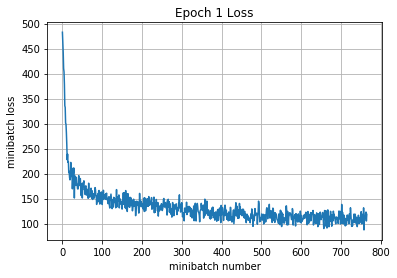

Validation
Epoch 1, Overall loss = 2.41 and accuracy of 0.354
Epoch 1, Overall loss = 2.4 and accuracy of 0.368
EPOCH = %d 1
Iteration 0: with minibatch training loss = 1.88 and accuracy of 0.34
Iteration 100: with minibatch training loss = 1.8 and accuracy of 0.34
Iteration 200: with minibatch training loss = 1.44 and accuracy of 0.45
Iteration 300: with minibatch training loss = 1.47 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.88 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.58 and accuracy of 0.44
Iteration 600: with minibatch training loss = 1.49 and accuracy of 0.45
Iteration 700: with minibatch training loss = 1.36 and accuracy of 0.45
Epoch 1, Overall loss = 1.57 and accuracy of 0.436


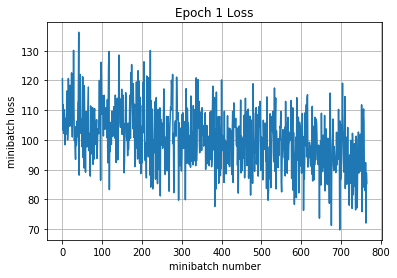

Validation
Epoch 1, Overall loss = 1.57 and accuracy of 0.496
Epoch 1, Overall loss = 1.56 and accuracy of 0.503
EPOCH = %d 2
Iteration 0: with minibatch training loss = 1.56 and accuracy of 0.42
Iteration 100: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 200: with minibatch training loss = 1.44 and accuracy of 0.47
Iteration 300: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 400: with minibatch training loss = 1.16 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.16 and accuracy of 0.66
Iteration 600: with minibatch training loss = 1.21 and accuracy of 0.59
Iteration 700: with minibatch training loss = 1.3 and accuracy of 0.56
Epoch 1, Overall loss = 1.37 and accuracy of 0.509


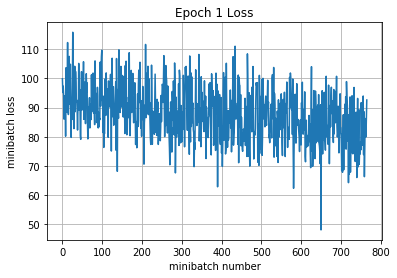

Validation
Epoch 1, Overall loss = 1.33 and accuracy of 0.544
Epoch 1, Overall loss = 1.34 and accuracy of 0.551
EPOCH = %d 3
Iteration 0: with minibatch training loss = 1.53 and accuracy of 0.53
Iteration 100: with minibatch training loss = 1.33 and accuracy of 0.55
Iteration 200: with minibatch training loss = 1.31 and accuracy of 0.5
Iteration 300: with minibatch training loss = 0.93 and accuracy of 0.67
Iteration 400: with minibatch training loss = 1.15 and accuracy of 0.64
Iteration 500: with minibatch training loss = 1.23 and accuracy of 0.53
Iteration 600: with minibatch training loss = 1.15 and accuracy of 0.67
Iteration 700: with minibatch training loss = 1.1 and accuracy of 0.53
Epoch 1, Overall loss = 1.24 and accuracy of 0.555


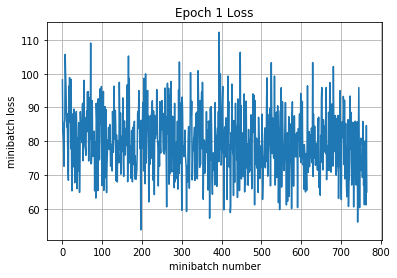

Validation
Epoch 1, Overall loss = 1.13 and accuracy of 0.619
Epoch 1, Overall loss = 1.13 and accuracy of 0.633
EPOCH = %d 4
Iteration 0: with minibatch training loss = 1.28 and accuracy of 0.61
Iteration 100: with minibatch training loss = 1.1 and accuracy of 0.66
Iteration 200: with minibatch training loss = 1.12 and accuracy of 0.58
Iteration 300: with minibatch training loss = 1.2 and accuracy of 0.62
Iteration 400: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 500: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 600: with minibatch training loss = 1.26 and accuracy of 0.58
Iteration 700: with minibatch training loss = 1.17 and accuracy of 0.56
Epoch 1, Overall loss = 1.16 and accuracy of 0.588


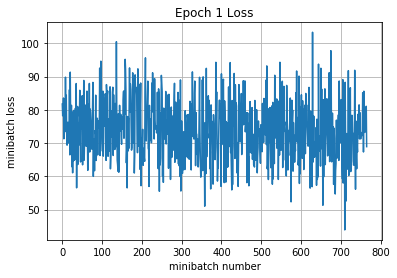

Validation
Epoch 1, Overall loss = 1.04 and accuracy of 0.653
Epoch 1, Overall loss = 1.05 and accuracy of 0.662
EPOCH = %d 5
Iteration 0: with minibatch training loss = 1.14 and accuracy of 0.53
Iteration 100: with minibatch training loss = 1.18 and accuracy of 0.58
Iteration 200: with minibatch training loss = 1.11 and accuracy of 0.58
Iteration 300: with minibatch training loss = 1.24 and accuracy of 0.55
Iteration 400: with minibatch training loss = 1.11 and accuracy of 0.69
Iteration 500: with minibatch training loss = 0.868 and accuracy of 0.64
Iteration 600: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 700: with minibatch training loss = 1.36 and accuracy of 0.55
Epoch 1, Overall loss = 1.09 and accuracy of 0.613


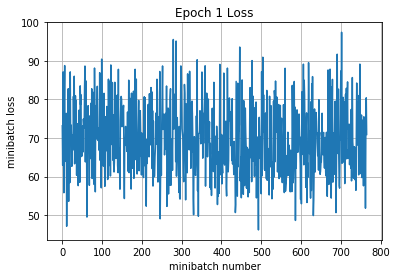

Validation
Epoch 1, Overall loss = 0.988 and accuracy of 0.674
Epoch 1, Overall loss = 0.979 and accuracy of 0.697
EPOCH = %d 6
Iteration 0: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 100: with minibatch training loss = 0.985 and accuracy of 0.66
Iteration 200: with minibatch training loss = 1.06 and accuracy of 0.59
Iteration 300: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 400: with minibatch training loss = 1.22 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.25 and accuracy of 0.55
Iteration 600: with minibatch training loss = 1.13 and accuracy of 0.59
Iteration 700: with minibatch training loss = 1.11 and accuracy of 0.52
Epoch 1, Overall loss = 1.03 and accuracy of 0.633


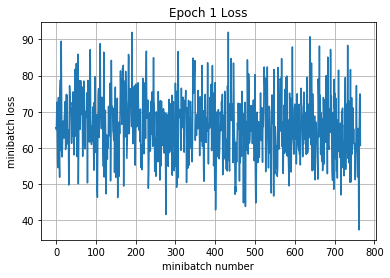

Validation
Epoch 1, Overall loss = 0.917 and accuracy of 0.7
Epoch 1, Overall loss = 0.926 and accuracy of 0.709
EPOCH = %d 7
Iteration 0: with minibatch training loss = 0.873 and accuracy of 0.69
Iteration 100: with minibatch training loss = 0.882 and accuracy of 0.67
Iteration 200: with minibatch training loss = 0.806 and accuracy of 0.73
Iteration 300: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 400: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 500: with minibatch training loss = 1.05 and accuracy of 0.67
Iteration 600: with minibatch training loss = 1.14 and accuracy of 0.55
Iteration 700: with minibatch training loss = 1.17 and accuracy of 0.61
Epoch 1, Overall loss = 0.986 and accuracy of 0.651


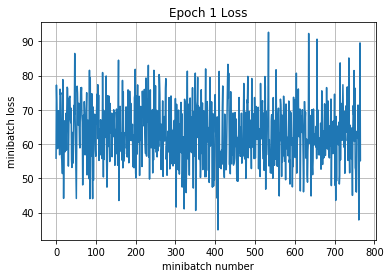

Validation
Epoch 1, Overall loss = 0.869 and accuracy of 0.725
Epoch 1, Overall loss = 0.867 and accuracy of 0.735
EPOCH = %d 8
Iteration 0: with minibatch training loss = 0.82 and accuracy of 0.7
Iteration 100: with minibatch training loss = 1.3 and accuracy of 0.5
Iteration 200: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 300: with minibatch training loss = 1.3 and accuracy of 0.53
Iteration 400: with minibatch training loss = 1.06 and accuracy of 0.66
Iteration 500: with minibatch training loss = 1.14 and accuracy of 0.66
Iteration 600: with minibatch training loss = 0.9 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.902 and accuracy of 0.69
Epoch 1, Overall loss = 0.946 and accuracy of 0.667


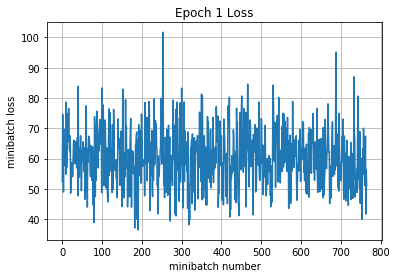

Validation
Epoch 1, Overall loss = 0.835 and accuracy of 0.717
Epoch 1, Overall loss = 0.829 and accuracy of 0.732
EPOCH = %d 9
Iteration 0: with minibatch training loss = 1.12 and accuracy of 0.59
Iteration 100: with minibatch training loss = 0.9 and accuracy of 0.66
Iteration 200: with minibatch training loss = 0.874 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.885 and accuracy of 0.72
Iteration 400: with minibatch training loss = 1 and accuracy of 0.66
Iteration 500: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 600: with minibatch training loss = 0.776 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.721 and accuracy of 0.77
Epoch 1, Overall loss = 0.903 and accuracy of 0.681


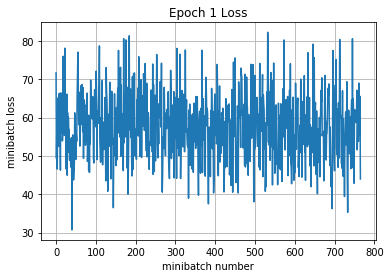

Validation
Epoch 1, Overall loss = 0.806 and accuracy of 0.734
Epoch 1, Overall loss = 0.787 and accuracy of 0.761
EPOCH = %d 10
Iteration 0: with minibatch training loss = 0.931 and accuracy of 0.69
Iteration 100: with minibatch training loss = 0.825 and accuracy of 0.75
Iteration 200: with minibatch training loss = 1.07 and accuracy of 0.61
Iteration 300: with minibatch training loss = 0.837 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.721 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.723 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.79 and accuracy of 0.67
Iteration 700: with minibatch training loss = 0.819 and accuracy of 0.78
Epoch 1, Overall loss = 0.877 and accuracy of 0.69


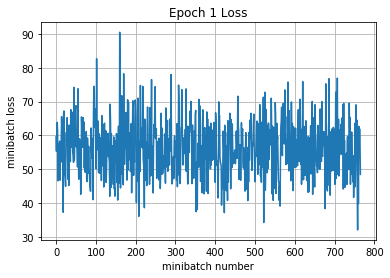

Validation
Epoch 1, Overall loss = 0.81 and accuracy of 0.726
Epoch 1, Overall loss = 0.827 and accuracy of 0.74
EPOCH = %d 11
Iteration 0: with minibatch training loss = 0.83 and accuracy of 0.66
Iteration 100: with minibatch training loss = 0.941 and accuracy of 0.62
Iteration 200: with minibatch training loss = 0.773 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.677 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.628 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.877 and accuracy of 0.56
Iteration 600: with minibatch training loss = 0.595 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.749 and accuracy of 0.72
Epoch 1, Overall loss = 0.848 and accuracy of 0.7


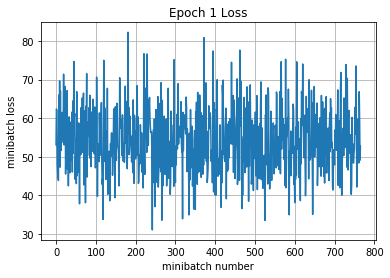

Validation
Epoch 1, Overall loss = 0.791 and accuracy of 0.737
Epoch 1, Overall loss = 0.784 and accuracy of 0.76
EPOCH = %d 12
Iteration 0: with minibatch training loss = 0.6 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.9 and accuracy of 0.72
Iteration 200: with minibatch training loss = 0.733 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.666 and accuracy of 0.78
Iteration 400: with minibatch training loss = 1.15 and accuracy of 0.69
Iteration 500: with minibatch training loss = 0.945 and accuracy of 0.66
Iteration 600: with minibatch training loss = 1.05 and accuracy of 0.62
Iteration 700: with minibatch training loss = 0.714 and accuracy of 0.77
Epoch 1, Overall loss = 0.826 and accuracy of 0.71


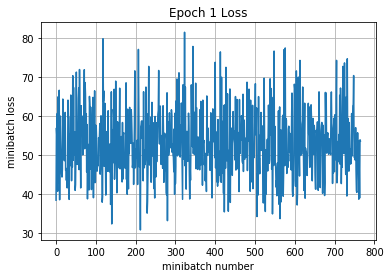

Validation
Epoch 1, Overall loss = 0.759 and accuracy of 0.749
Epoch 1, Overall loss = 0.756 and accuracy of 0.762
EPOCH = %d 13
Iteration 0: with minibatch training loss = 0.903 and accuracy of 0.67
Iteration 100: with minibatch training loss = 1.19 and accuracy of 0.61
Iteration 200: with minibatch training loss = 0.721 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.787 and accuracy of 0.67
Iteration 400: with minibatch training loss = 0.8 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.686 and accuracy of 0.67
Iteration 600: with minibatch training loss = 0.726 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.82 and accuracy of 0.67
Epoch 1, Overall loss = 0.799 and accuracy of 0.719


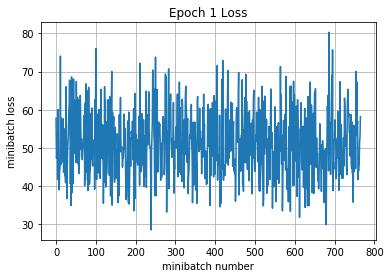

Validation
Epoch 1, Overall loss = 0.741 and accuracy of 0.757
Epoch 1, Overall loss = 0.731 and accuracy of 0.775
EPOCH = %d 14
Iteration 0: with minibatch training loss = 0.916 and accuracy of 0.69
Iteration 100: with minibatch training loss = 0.749 and accuracy of 0.78
Iteration 200: with minibatch training loss = 1 and accuracy of 0.67
Iteration 300: with minibatch training loss = 0.476 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.991 and accuracy of 0.62
Iteration 500: with minibatch training loss = 0.599 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.736 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.643 and accuracy of 0.78
Epoch 1, Overall loss = 0.777 and accuracy of 0.726


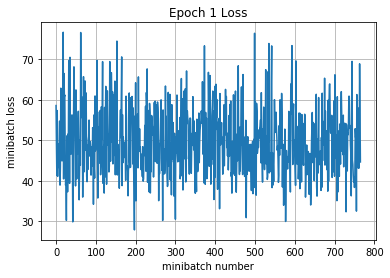

Validation
Epoch 1, Overall loss = 0.73 and accuracy of 0.748
Epoch 1, Overall loss = 0.717 and accuracy of 0.764
EPOCH = %d 15
Iteration 0: with minibatch training loss = 0.905 and accuracy of 0.72
Iteration 100: with minibatch training loss = 0.851 and accuracy of 0.69
Iteration 200: with minibatch training loss = 0.552 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.722 and accuracy of 0.75
Iteration 400: with minibatch training loss = 1 and accuracy of 0.64
Iteration 500: with minibatch training loss = 0.747 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.657 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.656 and accuracy of 0.73
Epoch 1, Overall loss = 0.76 and accuracy of 0.733


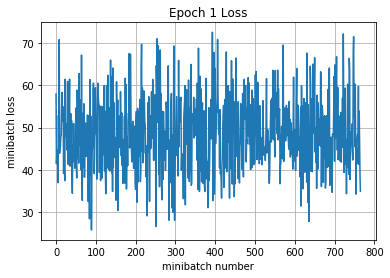

Validation
Epoch 1, Overall loss = 0.722 and accuracy of 0.762
Epoch 1, Overall loss = 0.731 and accuracy of 0.776
EPOCH = %d 16
Iteration 0: with minibatch training loss = 0.801 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.744 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.765 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.768 and accuracy of 0.69
Iteration 400: with minibatch training loss = 0.842 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.895 and accuracy of 0.7
Iteration 600: with minibatch training loss = 0.558 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.951 and accuracy of 0.62
Epoch 1, Overall loss = 0.739 and accuracy of 0.74


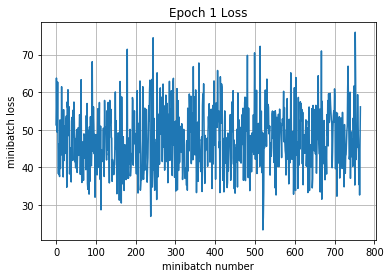

Validation
Epoch 1, Overall loss = 0.712 and accuracy of 0.776
Epoch 1, Overall loss = 0.688 and accuracy of 0.786
EPOCH = %d 17
Iteration 0: with minibatch training loss = 0.507 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.705 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.493 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.658 and accuracy of 0.8
Iteration 400: with minibatch training loss = 1.09 and accuracy of 0.61
Iteration 500: with minibatch training loss = 0.655 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.661 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.703 and accuracy of 0.78
Epoch 1, Overall loss = 0.725 and accuracy of 0.747


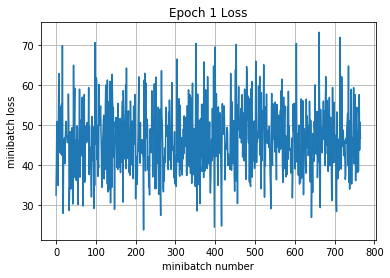

Validation
Epoch 1, Overall loss = 0.677 and accuracy of 0.778
Epoch 1, Overall loss = 0.665 and accuracy of 0.79
EPOCH = %d 18
Iteration 0: with minibatch training loss = 0.821 and accuracy of 0.7
Iteration 100: with minibatch training loss = 0.677 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.715 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.913 and accuracy of 0.64
Iteration 400: with minibatch training loss = 0.579 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.61 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.654 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.701 and accuracy of 0.73
Epoch 1, Overall loss = 0.71 and accuracy of 0.75


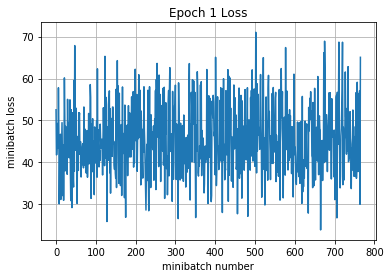

Validation
Epoch 1, Overall loss = 0.669 and accuracy of 0.775
Epoch 1, Overall loss = 0.65 and accuracy of 0.787
EPOCH = %d 19
Iteration 0: with minibatch training loss = 0.829 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.58 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.588 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.477 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.669 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.729 and accuracy of 0.67
Iteration 600: with minibatch training loss = 0.815 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.557 and accuracy of 0.8
Epoch 1, Overall loss = 0.693 and accuracy of 0.756


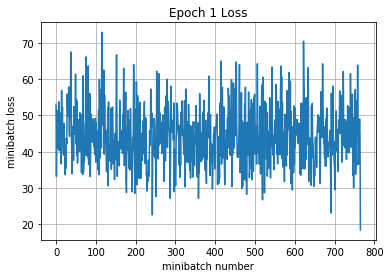

Validation
Epoch 1, Overall loss = 0.647 and accuracy of 0.778
Epoch 1, Overall loss = 0.661 and accuracy of 0.803
EPOCH = %d 20
Iteration 0: with minibatch training loss = 0.765 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.656 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.716 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.634 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.64 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.575 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.678 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.906 and accuracy of 0.75
Epoch 1, Overall loss = 0.68 and accuracy of 0.76


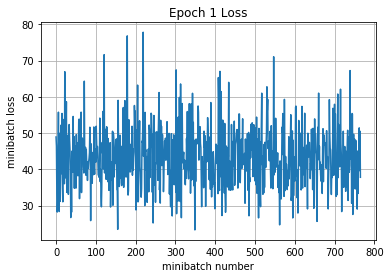

Validation
Epoch 1, Overall loss = 0.654 and accuracy of 0.792
Epoch 1, Overall loss = 0.657 and accuracy of 0.792
EPOCH = %d 21
Iteration 0: with minibatch training loss = 0.601 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.724 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.648 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.703 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.503 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.768 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.443 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.815 and accuracy of 0.69
Epoch 1, Overall loss = 0.661 and accuracy of 0.767


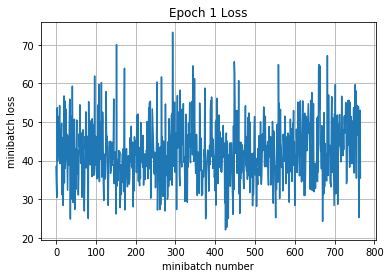

Validation
Epoch 1, Overall loss = 0.617 and accuracy of 0.804
Epoch 1, Overall loss = 0.613 and accuracy of 0.819
EPOCH = %d 22
Iteration 0: with minibatch training loss = 0.532 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.679 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.548 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.696 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.724 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.698 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.526 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.615 and accuracy of 0.78
Epoch 1, Overall loss = 0.656 and accuracy of 0.771


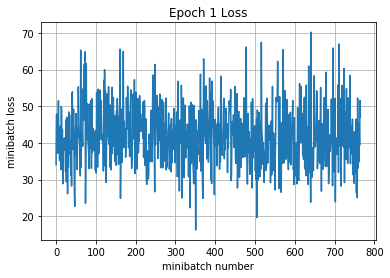

Validation
Epoch 1, Overall loss = 0.638 and accuracy of 0.786
Epoch 1, Overall loss = 0.637 and accuracy of 0.807
EPOCH = %d 23
Iteration 0: with minibatch training loss = 0.566 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.532 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.451 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.761 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.557 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.722 and accuracy of 0.69
Iteration 600: with minibatch training loss = 0.833 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.644 and accuracy of 0.75
Epoch 1, Overall loss = 0.643 and accuracy of 0.773


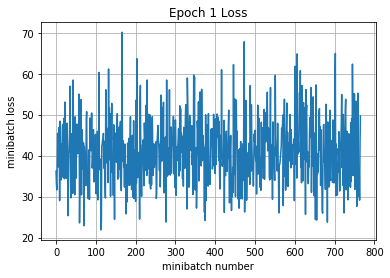

Validation
Epoch 1, Overall loss = 0.61 and accuracy of 0.803
Epoch 1, Overall loss = 0.609 and accuracy of 0.817
EPOCH = %d 24
Iteration 0: with minibatch training loss = 0.705 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.524 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.608 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.993 and accuracy of 0.64
Iteration 400: with minibatch training loss = 0.684 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.54 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.782 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.449 and accuracy of 0.81
Epoch 1, Overall loss = 0.63 and accuracy of 0.779


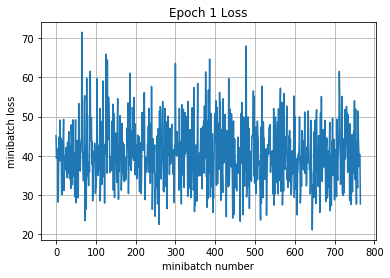

Validation
Epoch 1, Overall loss = 0.601 and accuracy of 0.801
Epoch 1, Overall loss = 0.589 and accuracy of 0.817
EPOCH = %d 25
Iteration 0: with minibatch training loss = 0.605 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.598 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.838 and accuracy of 0.69
Iteration 300: with minibatch training loss = 0.763 and accuracy of 0.72
Iteration 400: with minibatch training loss = 0.751 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.663 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.602 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.51 and accuracy of 0.83
Epoch 1, Overall loss = 0.617 and accuracy of 0.782


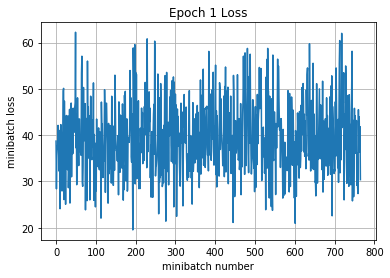

Validation
Epoch 1, Overall loss = 0.583 and accuracy of 0.805
Epoch 1, Overall loss = 0.613 and accuracy of 0.808
EPOCH = %d 26
Iteration 0: with minibatch training loss = 0.513 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.485 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.675 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.633 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.698 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.547 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.665 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.738 and accuracy of 0.77
Epoch 1, Overall loss = 0.603 and accuracy of 0.788


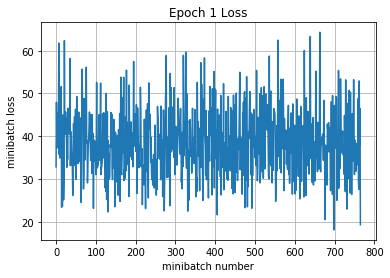

Validation
Epoch 1, Overall loss = 0.585 and accuracy of 0.811
Epoch 1, Overall loss = 0.596 and accuracy of 0.812
EPOCH = %d 27
Iteration 0: with minibatch training loss = 0.462 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.554 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.65 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.363 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.643 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.545 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.652 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.624 and accuracy of 0.78
Epoch 1, Overall loss = 0.59 and accuracy of 0.793


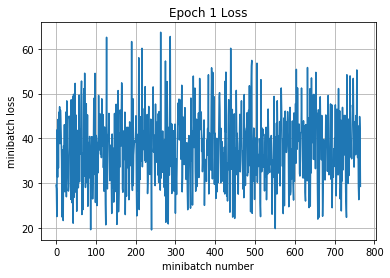

Validation
Epoch 1, Overall loss = 0.584 and accuracy of 0.808
Epoch 1, Overall loss = 0.591 and accuracy of 0.811
EPOCH = %d 28
Iteration 0: with minibatch training loss = 0.583 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.745 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.624 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.428 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.536 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.763 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.575 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.518 and accuracy of 0.78
Epoch 1, Overall loss = 0.587 and accuracy of 0.794


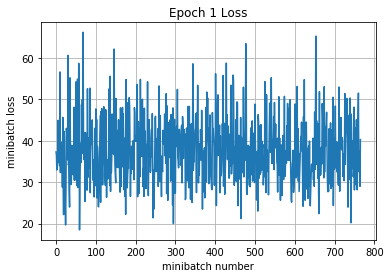

Validation
Epoch 1, Overall loss = 0.575 and accuracy of 0.813
Epoch 1, Overall loss = 0.571 and accuracy of 0.828
EPOCH = %d 29
Iteration 0: with minibatch training loss = 0.708 and accuracy of 0.72
Iteration 100: with minibatch training loss = 0.479 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.488 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.662 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.8 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.386 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.677 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.532 and accuracy of 0.83
Epoch 1, Overall loss = 0.572 and accuracy of 0.799


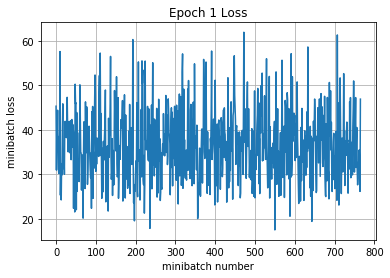

Validation
Epoch 1, Overall loss = 0.577 and accuracy of 0.811
Epoch 1, Overall loss = 0.594 and accuracy of 0.822
EPOCH = %d 30
Iteration 0: with minibatch training loss = 0.669 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.572 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.708 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.405 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.457 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.56 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.526 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.526 and accuracy of 0.8
Epoch 1, Overall loss = 0.563 and accuracy of 0.8


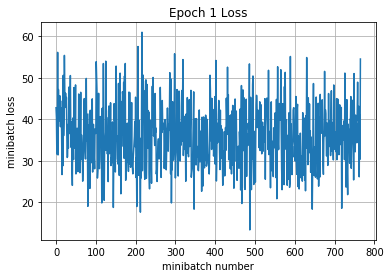

Validation
Epoch 1, Overall loss = 0.567 and accuracy of 0.823
Epoch 1, Overall loss = 0.566 and accuracy of 0.826
EPOCH = %d 31
Iteration 0: with minibatch training loss = 0.439 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.795 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.35 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.594 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.638 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.507 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.65 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.54 and accuracy of 0.83
Epoch 1, Overall loss = 0.556 and accuracy of 0.804


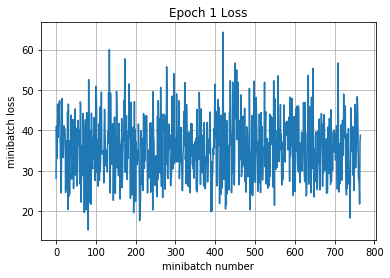

Validation
Epoch 1, Overall loss = 0.547 and accuracy of 0.825
Epoch 1, Overall loss = 0.538 and accuracy of 0.828
EPOCH = %d 32
Iteration 0: with minibatch training loss = 0.29 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.632 and accuracy of 0.73
Iteration 200: with minibatch training loss = 0.774 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.507 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.457 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.333 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.443 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.611 and accuracy of 0.75
Epoch 1, Overall loss = 0.539 and accuracy of 0.809


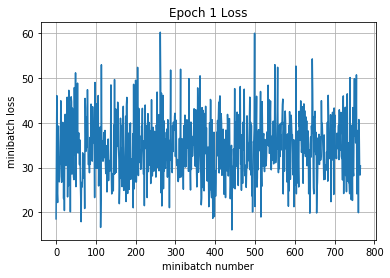

Validation
Epoch 1, Overall loss = 0.558 and accuracy of 0.818
Epoch 1, Overall loss = 0.565 and accuracy of 0.83
EPOCH = %d 33
Iteration 0: with minibatch training loss = 0.471 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.654 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.468 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.404 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.536 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.73 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.44 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.634 and accuracy of 0.77
Epoch 1, Overall loss = 0.534 and accuracy of 0.811


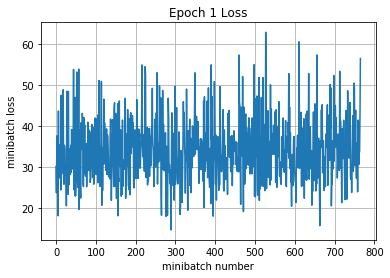

Validation
Epoch 1, Overall loss = 0.552 and accuracy of 0.821
Epoch 1, Overall loss = 0.523 and accuracy of 0.828
EPOCH = %d 34
Iteration 0: with minibatch training loss = 0.758 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.346 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.561 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.651 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.533 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.276 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.449 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.631 and accuracy of 0.77
Epoch 1, Overall loss = 0.532 and accuracy of 0.812


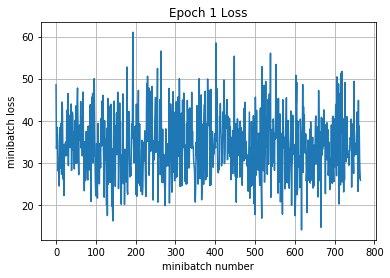

Validation
Epoch 1, Overall loss = 0.531 and accuracy of 0.827
Epoch 1, Overall loss = 0.506 and accuracy of 0.833
EPOCH = %d 35
Iteration 0: with minibatch training loss = 0.347 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.593 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.491 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.37 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.307 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.858 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.345 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.39 and accuracy of 0.84
Epoch 1, Overall loss = 0.522 and accuracy of 0.816


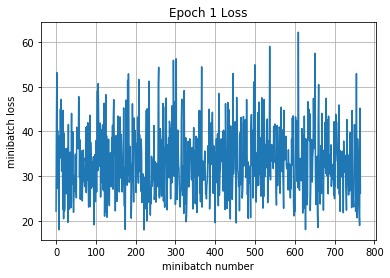

Validation
Epoch 1, Overall loss = 0.53 and accuracy of 0.83
Epoch 1, Overall loss = 0.533 and accuracy of 0.827
EPOCH = %d 36
Iteration 0: with minibatch training loss = 0.5 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.416 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.402 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.427 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.43 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.398 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.383 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.491 and accuracy of 0.81
Epoch 1, Overall loss = 0.514 and accuracy of 0.817


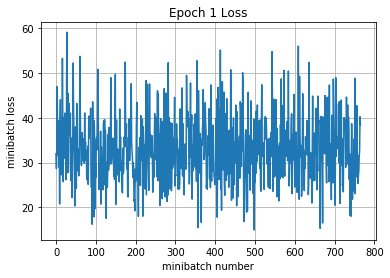

Validation
Epoch 1, Overall loss = 0.546 and accuracy of 0.825
Epoch 1, Overall loss = 0.533 and accuracy of 0.829
EPOCH = %d 37
Iteration 0: with minibatch training loss = 0.304 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.421 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.645 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.564 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.677 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.312 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.425 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.43 and accuracy of 0.78
Epoch 1, Overall loss = 0.507 and accuracy of 0.82


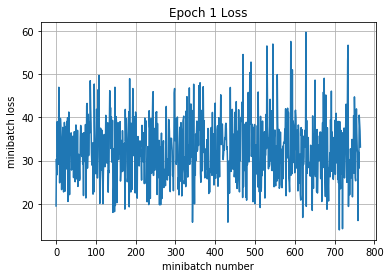

Validation
Epoch 1, Overall loss = 0.535 and accuracy of 0.827
Epoch 1, Overall loss = 0.505 and accuracy of 0.844
EPOCH = %d 38
Iteration 0: with minibatch training loss = 0.593 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.56 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.511 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.649 and accuracy of 0.72
Iteration 400: with minibatch training loss = 0.541 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.604 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.399 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.632 and accuracy of 0.8
Epoch 1, Overall loss = 0.491 and accuracy of 0.828


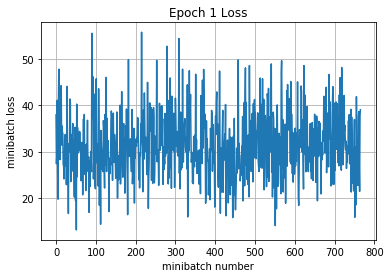

Validation
Epoch 1, Overall loss = 0.521 and accuracy of 0.829
Epoch 1, Overall loss = 0.521 and accuracy of 0.842
EPOCH = %d 39
Iteration 0: with minibatch training loss = 0.419 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.537 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.451 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.516 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.417 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.621 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.507 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.477 and accuracy of 0.84
Epoch 1, Overall loss = 0.488 and accuracy of 0.827


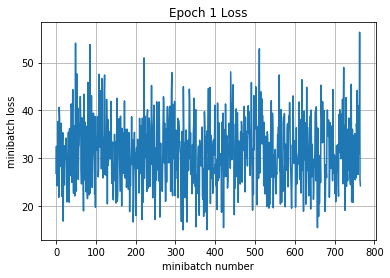

Validation
Epoch 1, Overall loss = 0.513 and accuracy of 0.837
Epoch 1, Overall loss = 0.516 and accuracy of 0.84
EPOCH = %d 40
Iteration 0: with minibatch training loss = 0.498 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.369 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.532 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.477 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.463 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.644 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.454 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.358 and accuracy of 0.89
Epoch 1, Overall loss = 0.483 and accuracy of 0.829


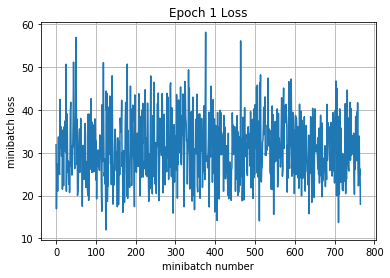

Validation
Epoch 1, Overall loss = 0.542 and accuracy of 0.825
Epoch 1, Overall loss = 0.547 and accuracy of 0.828
EPOCH = %d 41
Iteration 0: with minibatch training loss = 0.409 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.449 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.568 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.297 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.295 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.536 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.343 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.501 and accuracy of 0.81
Epoch 1, Overall loss = 0.47 and accuracy of 0.833


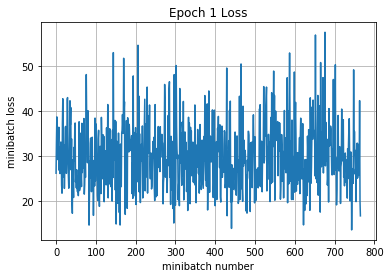

Validation
Epoch 1, Overall loss = 0.514 and accuracy of 0.829
Epoch 1, Overall loss = 0.518 and accuracy of 0.837
EPOCH = %d 42
Iteration 0: with minibatch training loss = 0.284 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.43 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.339 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.347 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.355 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.537 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.599 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.389 and accuracy of 0.88
Epoch 1, Overall loss = 0.469 and accuracy of 0.834


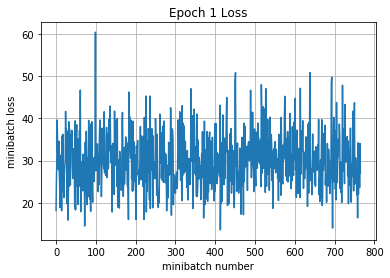

Validation
Epoch 1, Overall loss = 0.553 and accuracy of 0.811
Epoch 1, Overall loss = 0.548 and accuracy of 0.821
EPOCH = %d 43
Iteration 0: with minibatch training loss = 0.404 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.367 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.426 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.567 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.341 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.436 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.531 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.426 and accuracy of 0.8
Epoch 1, Overall loss = 0.464 and accuracy of 0.837


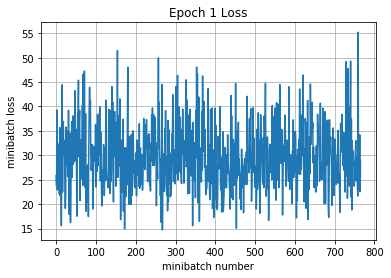

Validation
Epoch 1, Overall loss = 0.497 and accuracy of 0.833
Epoch 1, Overall loss = 0.496 and accuracy of 0.844
EPOCH = %d 44
Iteration 0: with minibatch training loss = 0.499 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.357 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.545 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.415 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.594 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.467 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.32 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.339 and accuracy of 0.86
Epoch 1, Overall loss = 0.452 and accuracy of 0.839


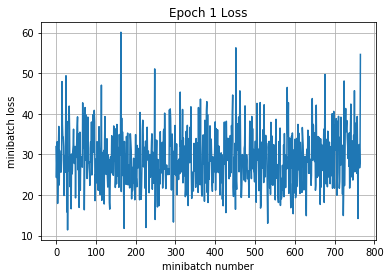

Validation
Epoch 1, Overall loss = 0.496 and accuracy of 0.838
Epoch 1, Overall loss = 0.488 and accuracy of 0.851
EPOCH = %d 45
Iteration 0: with minibatch training loss = 0.386 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.235 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.568 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.451 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.241 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.472 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.428 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.588 and accuracy of 0.83
Epoch 1, Overall loss = 0.443 and accuracy of 0.841


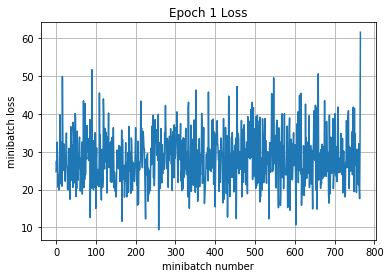

Validation
Epoch 1, Overall loss = 0.55 and accuracy of 0.83
Epoch 1, Overall loss = 0.537 and accuracy of 0.843
EPOCH = %d 46
Iteration 0: with minibatch training loss = 0.496 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.313 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.41 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.491 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.346 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.479 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.455 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.436 and accuracy of 0.88
Epoch 1, Overall loss = 0.441 and accuracy of 0.844


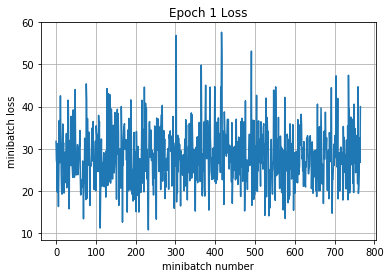

Validation
Epoch 1, Overall loss = 0.497 and accuracy of 0.853
Epoch 1, Overall loss = 0.489 and accuracy of 0.85
EPOCH = %d 47
Iteration 0: with minibatch training loss = 0.393 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.432 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.412 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.473 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.36 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.396 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.369 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.439 and accuracy of 0.89
Epoch 1, Overall loss = 0.437 and accuracy of 0.845


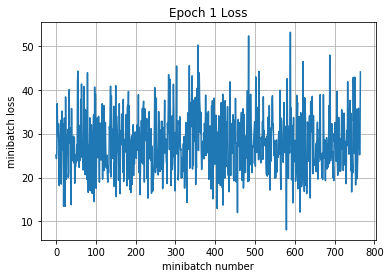

Validation
Epoch 1, Overall loss = 0.51 and accuracy of 0.84
Epoch 1, Overall loss = 0.523 and accuracy of 0.846
EPOCH = %d 48
Iteration 0: with minibatch training loss = 0.719 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.408 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.5 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.457 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.666 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.566 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.262 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.631 and accuracy of 0.78
Epoch 1, Overall loss = 0.423 and accuracy of 0.85


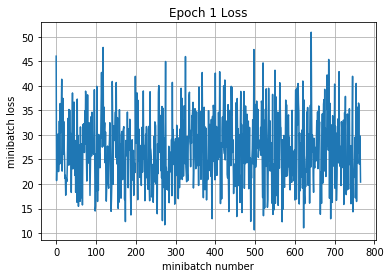

Validation
Epoch 1, Overall loss = 0.503 and accuracy of 0.838
Epoch 1, Overall loss = 0.489 and accuracy of 0.85
EPOCH = %d 49
Iteration 0: with minibatch training loss = 0.278 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.485 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.344 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.315 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.643 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.262 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.426 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.476 and accuracy of 0.8
Epoch 1, Overall loss = 0.426 and accuracy of 0.849


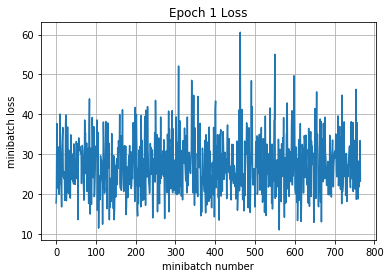

Validation
Epoch 1, Overall loss = 0.497 and accuracy of 0.839
Epoch 1, Overall loss = 0.49 and accuracy of 0.846
EPOCH = %d 50
Iteration 0: with minibatch training loss = 0.371 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.276 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.415 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.529 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.608 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.374 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.455 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.563 and accuracy of 0.8
Epoch 1, Overall loss = 0.416 and accuracy of 0.852


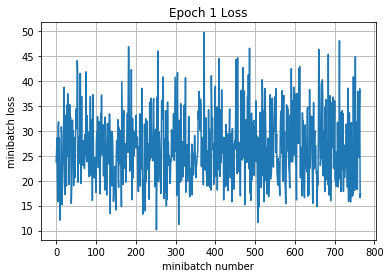

Validation
Epoch 1, Overall loss = 0.535 and accuracy of 0.835
Epoch 1, Overall loss = 0.535 and accuracy of 0.849
EPOCH = %d 51
Iteration 0: with minibatch training loss = 0.181 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.456 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.404 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.362 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.241 and accuracy of 0.95
Iteration 500: with minibatch training loss = 0.368 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.323 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.564 and accuracy of 0.81
Epoch 1, Overall loss = 0.405 and accuracy of 0.856


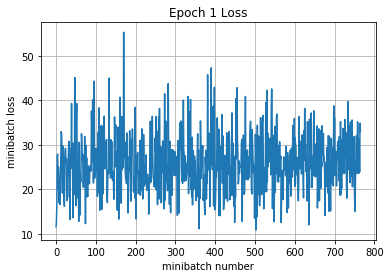

Validation
Epoch 1, Overall loss = 0.516 and accuracy of 0.835
Epoch 1, Overall loss = 0.514 and accuracy of 0.845
EPOCH = %d 52
Iteration 0: with minibatch training loss = 0.25 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.509 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.367 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.352 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.567 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.495 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.304 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.346 and accuracy of 0.89
Epoch 1, Overall loss = 0.409 and accuracy of 0.853


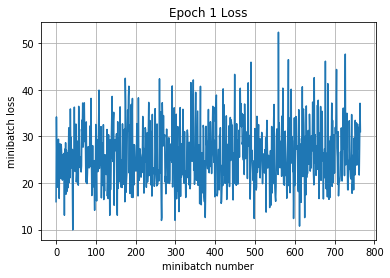

Validation
Epoch 1, Overall loss = 0.51 and accuracy of 0.842
Epoch 1, Overall loss = 0.518 and accuracy of 0.845
EPOCH = %d 53
Iteration 0: with minibatch training loss = 0.596 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.371 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.372 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.665 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.391 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.376 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.347 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.594 and accuracy of 0.75
Epoch 1, Overall loss = 0.401 and accuracy of 0.857


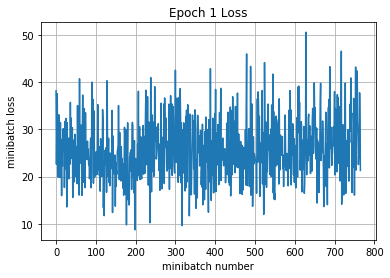

Validation
Epoch 1, Overall loss = 0.5 and accuracy of 0.839
Epoch 1, Overall loss = 0.49 and accuracy of 0.845
EPOCH = %d 54
Iteration 0: with minibatch training loss = 0.204 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.342 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.442 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.449 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.442 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.417 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.405 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.269 and accuracy of 0.94
Epoch 1, Overall loss = 0.397 and accuracy of 0.86


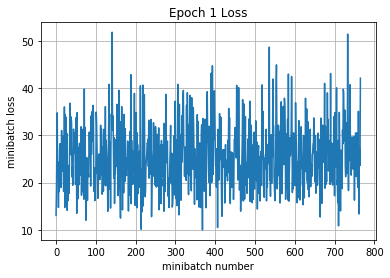

Validation
Epoch 1, Overall loss = 0.466 and accuracy of 0.849
Epoch 1, Overall loss = 0.484 and accuracy of 0.855
EPOCH = %d 55
Iteration 0: with minibatch training loss = 0.442 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.296 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.37 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.47 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.286 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.456 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.337 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.385 and accuracy of 0.86
Epoch 1, Overall loss = 0.392 and accuracy of 0.859


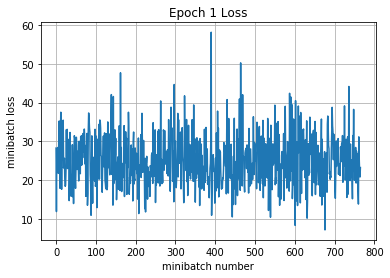

Validation
Epoch 1, Overall loss = 0.488 and accuracy of 0.835
Epoch 1, Overall loss = 0.486 and accuracy of 0.853
EPOCH = %d 56
Iteration 0: with minibatch training loss = 0.261 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.452 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.448 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.328 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.175 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.416 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.307 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.35 and accuracy of 0.84
Epoch 1, Overall loss = 0.384 and accuracy of 0.862


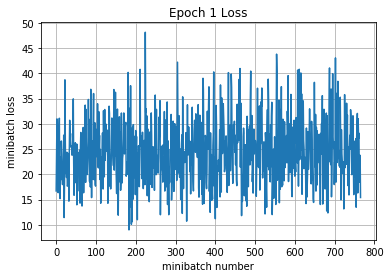

Validation
Epoch 1, Overall loss = 0.496 and accuracy of 0.845
Epoch 1, Overall loss = 0.504 and accuracy of 0.852
EPOCH = %d 57
Iteration 0: with minibatch training loss = 0.26 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.346 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.366 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.273 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.381 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.462 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.343 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.411 and accuracy of 0.81
Epoch 1, Overall loss = 0.385 and accuracy of 0.864


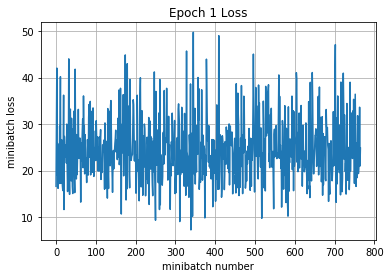

Validation
Epoch 1, Overall loss = 0.504 and accuracy of 0.845
Epoch 1, Overall loss = 0.474 and accuracy of 0.852
EPOCH = %d 58
Iteration 0: with minibatch training loss = 0.528 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.18 and accuracy of 0.97
Iteration 200: with minibatch training loss = 0.332 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.409 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.329 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.36 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.359 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.138 and accuracy of 0.97
Epoch 1, Overall loss = 0.375 and accuracy of 0.867


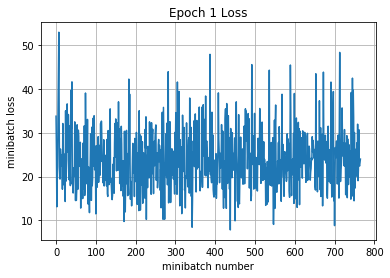

Validation
Epoch 1, Overall loss = 0.478 and accuracy of 0.85
Epoch 1, Overall loss = 0.474 and accuracy of 0.857
EPOCH = %d 59
Iteration 0: with minibatch training loss = 0.421 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.167 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.157 and accuracy of 0.94
Iteration 300: with minibatch training loss = 0.412 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.373 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.263 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.477 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.338 and accuracy of 0.86
Epoch 1, Overall loss = 0.376 and accuracy of 0.865


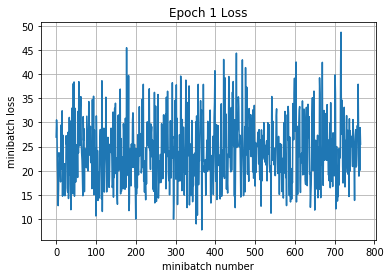

Validation
Epoch 1, Overall loss = 0.471 and accuracy of 0.859
Epoch 1, Overall loss = 0.485 and accuracy of 0.854
EPOCH = %d 60
Iteration 0: with minibatch training loss = 0.217 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.33 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.361 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.356 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.406 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.492 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.309 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.224 and accuracy of 0.92
Epoch 1, Overall loss = 0.367 and accuracy of 0.869


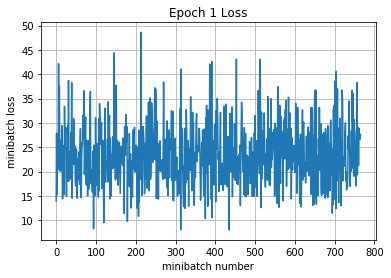

Validation
Epoch 1, Overall loss = 0.479 and accuracy of 0.842
Epoch 1, Overall loss = 0.494 and accuracy of 0.852
EPOCH = %d 61
Iteration 0: with minibatch training loss = 0.435 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.311 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.552 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.612 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.524 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.42 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.282 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.317 and accuracy of 0.88
Epoch 1, Overall loss = 0.365 and accuracy of 0.868


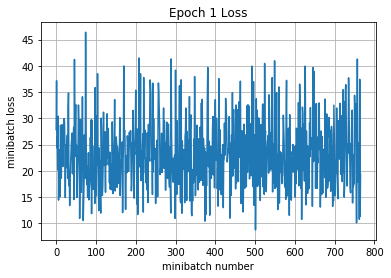

Validation
Epoch 1, Overall loss = 0.504 and accuracy of 0.843
Epoch 1, Overall loss = 0.466 and accuracy of 0.852
EPOCH = %d 62
Iteration 0: with minibatch training loss = 0.343 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.49 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.347 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.453 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.384 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.422 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.41 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.356 and accuracy of 0.84
Epoch 1, Overall loss = 0.355 and accuracy of 0.873


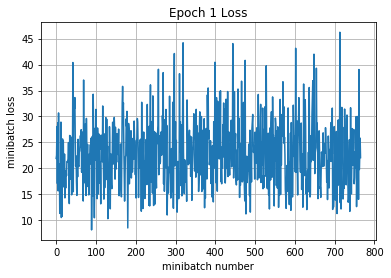

Validation
Epoch 1, Overall loss = 0.49 and accuracy of 0.851
Epoch 1, Overall loss = 0.489 and accuracy of 0.851
EPOCH = %d 63
Iteration 0: with minibatch training loss = 0.445 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.216 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.348 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.487 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.461 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.369 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.405 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.304 and accuracy of 0.91
Epoch 1, Overall loss = 0.353 and accuracy of 0.873


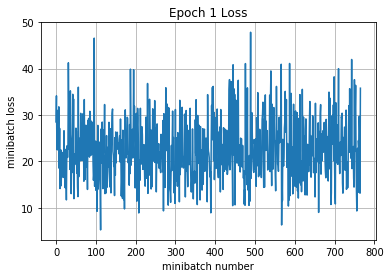

Validation
Epoch 1, Overall loss = 0.477 and accuracy of 0.837
Epoch 1, Overall loss = 0.492 and accuracy of 0.846
EPOCH = %d 64
Iteration 0: with minibatch training loss = 0.222 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.321 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.361 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.227 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.385 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.252 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.304 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.553 and accuracy of 0.88
Epoch 1, Overall loss = 0.353 and accuracy of 0.875


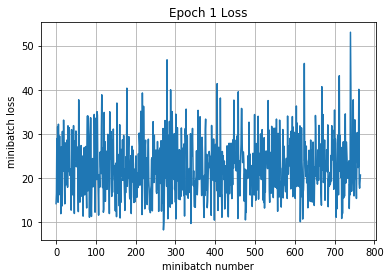

Validation
Epoch 1, Overall loss = 0.493 and accuracy of 0.848
Epoch 1, Overall loss = 0.484 and accuracy of 0.858
EPOCH = %d 65
Iteration 0: with minibatch training loss = 0.388 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.302 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.302 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.468 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.432 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.306 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.161 and accuracy of 0.97
Iteration 700: with minibatch training loss = 0.404 and accuracy of 0.86
Epoch 1, Overall loss = 0.346 and accuracy of 0.876


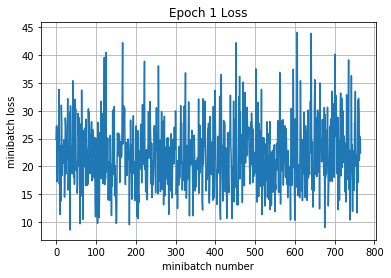

Validation
Epoch 1, Overall loss = 0.465 and accuracy of 0.858
Epoch 1, Overall loss = 0.472 and accuracy of 0.856
EPOCH = %d 66
Iteration 0: with minibatch training loss = 0.237 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.21 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.206 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.259 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.317 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.385 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.347 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.209 and accuracy of 0.92
Epoch 1, Overall loss = 0.337 and accuracy of 0.879


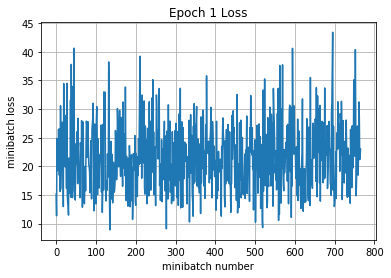

Validation
Epoch 1, Overall loss = 0.463 and accuracy of 0.836
Epoch 1, Overall loss = 0.481 and accuracy of 0.847
EPOCH = %d 67
Iteration 0: with minibatch training loss = 0.246 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.29 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.337 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.237 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.199 and accuracy of 0.95
Iteration 500: with minibatch training loss = 0.131 and accuracy of 0.95
Iteration 600: with minibatch training loss = 0.517 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.272 and accuracy of 0.89
Epoch 1, Overall loss = 0.339 and accuracy of 0.88


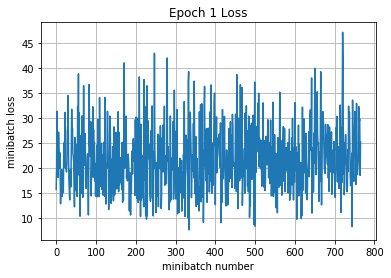

Validation
Epoch 1, Overall loss = 0.471 and accuracy of 0.845
Epoch 1, Overall loss = 0.487 and accuracy of 0.858
EPOCH = %d 68
Iteration 0: with minibatch training loss = 0.476 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.382 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.293 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.251 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.44 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.216 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.161 and accuracy of 0.97
Iteration 700: with minibatch training loss = 0.284 and accuracy of 0.91
Epoch 1, Overall loss = 0.334 and accuracy of 0.88


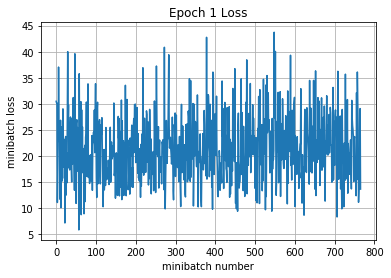

Validation
Epoch 1, Overall loss = 0.446 and accuracy of 0.861
Epoch 1, Overall loss = 0.473 and accuracy of 0.862
EPOCH = %d 69
Iteration 0: with minibatch training loss = 0.417 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.321 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.312 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.498 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.224 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.321 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.411 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.262 and accuracy of 0.92
Epoch 1, Overall loss = 0.328 and accuracy of 0.882


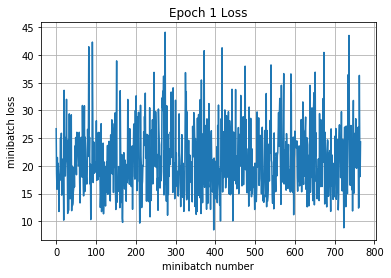

Validation
Epoch 1, Overall loss = 0.48 and accuracy of 0.842
Epoch 1, Overall loss = 0.486 and accuracy of 0.857
EPOCH = %d 70
Iteration 0: with minibatch training loss = 0.515 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.266 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.329 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.325 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.307 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.322 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.208 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.383 and accuracy of 0.81
Epoch 1, Overall loss = 0.325 and accuracy of 0.884


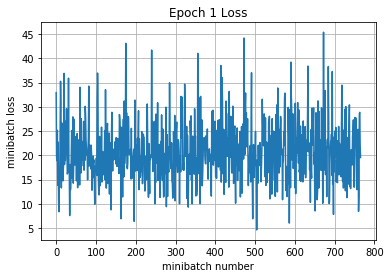

Validation
Epoch 1, Overall loss = 0.491 and accuracy of 0.843
Epoch 1, Overall loss = 0.499 and accuracy of 0.846
EPOCH = %d 71
Iteration 0: with minibatch training loss = 0.312 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.53 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.491 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.288 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.387 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.347 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.367 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.314 and accuracy of 0.86
Epoch 1, Overall loss = 0.326 and accuracy of 0.884


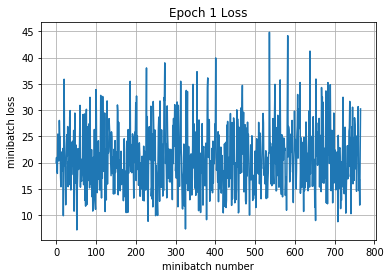

Validation
Epoch 1, Overall loss = 0.488 and accuracy of 0.844
Epoch 1, Overall loss = 0.494 and accuracy of 0.86
EPOCH = %d 72
Iteration 0: with minibatch training loss = 0.441 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.376 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.268 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.282 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.315 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.318 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.219 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.223 and accuracy of 0.94
Epoch 1, Overall loss = 0.317 and accuracy of 0.886


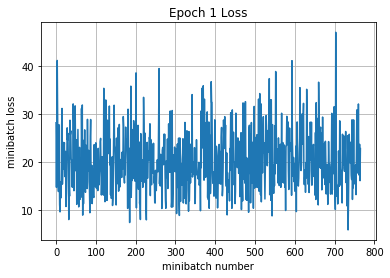

Validation
Epoch 1, Overall loss = 0.478 and accuracy of 0.844
Epoch 1, Overall loss = 0.476 and accuracy of 0.857
EPOCH = %d 73
Iteration 0: with minibatch training loss = 0.404 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.367 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.352 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.311 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.311 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.325 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.248 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.4 and accuracy of 0.84
Epoch 1, Overall loss = 0.314 and accuracy of 0.888


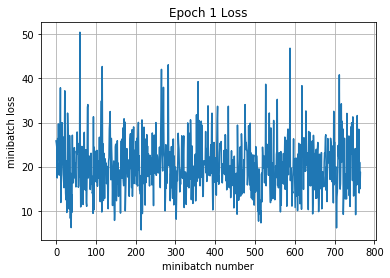

Validation
Epoch 1, Overall loss = 0.463 and accuracy of 0.853
Epoch 1, Overall loss = 0.469 and accuracy of 0.865
EPOCH = %d 74
Iteration 0: with minibatch training loss = 0.24 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.309 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.47 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.237 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.452 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.31 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.261 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.332 and accuracy of 0.88
Epoch 1, Overall loss = 0.316 and accuracy of 0.888


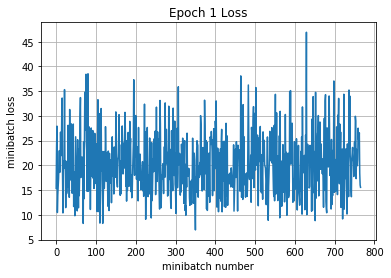

Validation
Epoch 1, Overall loss = 0.47 and accuracy of 0.851
Epoch 1, Overall loss = 0.482 and accuracy of 0.872
EPOCH = %d 75
Iteration 0: with minibatch training loss = 0.141 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.331 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.173 and accuracy of 0.94
Iteration 300: with minibatch training loss = 0.232 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.474 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.194 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.28 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.347 and accuracy of 0.88
Epoch 1, Overall loss = 0.305 and accuracy of 0.891


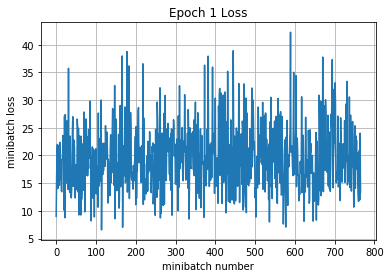

Validation
Epoch 1, Overall loss = 0.459 and accuracy of 0.852
Epoch 1, Overall loss = 0.471 and accuracy of 0.851
EPOCH = %d 76
Iteration 0: with minibatch training loss = 0.19 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.166 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.373 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.297 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.221 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.245 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.157 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.183 and accuracy of 0.94
Epoch 1, Overall loss = 0.301 and accuracy of 0.89


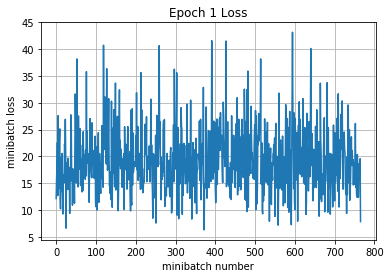

Validation
Epoch 1, Overall loss = 0.467 and accuracy of 0.848
Epoch 1, Overall loss = 0.475 and accuracy of 0.868
EPOCH = %d 77
Iteration 0: with minibatch training loss = 0.237 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.226 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.346 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.264 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.233 and accuracy of 0.95
Iteration 500: with minibatch training loss = 0.393 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.44 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.242 and accuracy of 0.89
Epoch 1, Overall loss = 0.303 and accuracy of 0.893


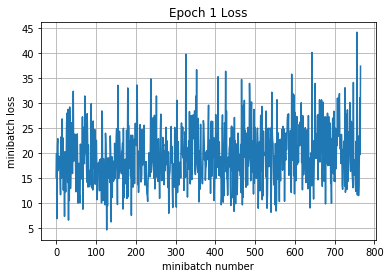

Validation
Epoch 1, Overall loss = 0.486 and accuracy of 0.858
Epoch 1, Overall loss = 0.492 and accuracy of 0.859
EPOCH = %d 78
Iteration 0: with minibatch training loss = 0.339 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.297 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.402 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.206 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.211 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.272 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.451 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.277 and accuracy of 0.88
Epoch 1, Overall loss = 0.299 and accuracy of 0.893


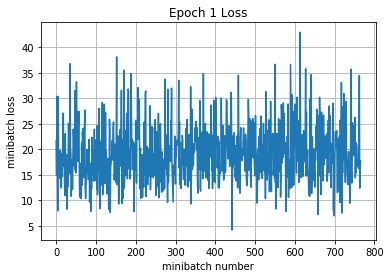

Validation
Epoch 1, Overall loss = 0.488 and accuracy of 0.831
Epoch 1, Overall loss = 0.494 and accuracy of 0.856
EPOCH = %d 79
Iteration 0: with minibatch training loss = 0.371 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.196 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.348 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.272 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.224 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.504 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.47 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.166 and accuracy of 0.92
Epoch 1, Overall loss = 0.294 and accuracy of 0.895


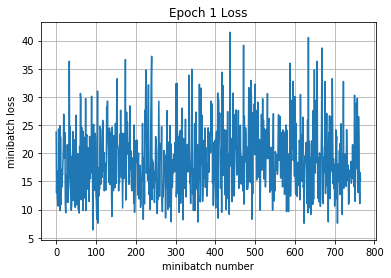

Validation
Epoch 1, Overall loss = 0.455 and accuracy of 0.861
Epoch 1, Overall loss = 0.456 and accuracy of 0.869
EPOCH = %d 80
Iteration 0: with minibatch training loss = 0.288 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.215 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.432 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.215 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.202 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.298 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.273 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.369 and accuracy of 0.89
Epoch 1, Overall loss = 0.294 and accuracy of 0.895


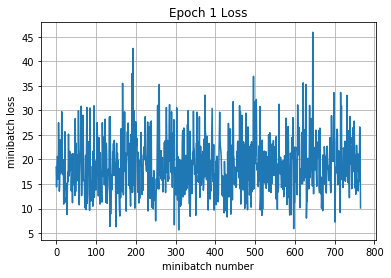

Validation
Epoch 1, Overall loss = 0.486 and accuracy of 0.854
Epoch 1, Overall loss = 0.486 and accuracy of 0.867
EPOCH = %d 81
Iteration 0: with minibatch training loss = 0.286 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.235 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.344 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.29 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.296 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.236 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.338 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.279 and accuracy of 0.88
Epoch 1, Overall loss = 0.287 and accuracy of 0.897


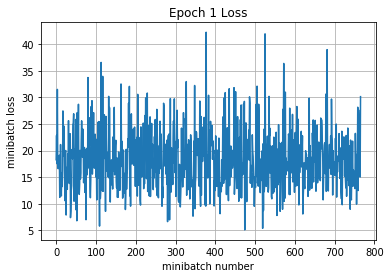

Validation
Epoch 1, Overall loss = 0.483 and accuracy of 0.842
Epoch 1, Overall loss = 0.475 and accuracy of 0.85
EPOCH = %d 82
Iteration 0: with minibatch training loss = 0.282 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.305 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.284 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.159 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.329 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.0723 and accuracy of 1
Iteration 600: with minibatch training loss = 0.172 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.43 and accuracy of 0.86
Epoch 1, Overall loss = 0.284 and accuracy of 0.897


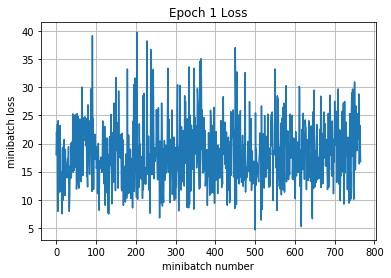

Validation
Epoch 1, Overall loss = 0.474 and accuracy of 0.857
Epoch 1, Overall loss = 0.533 and accuracy of 0.861
EPOCH = %d 83
Iteration 0: with minibatch training loss = 0.133 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.227 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.425 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.27 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.263 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.598 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.175 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.0981 and accuracy of 0.98
Epoch 1, Overall loss = 0.287 and accuracy of 0.896


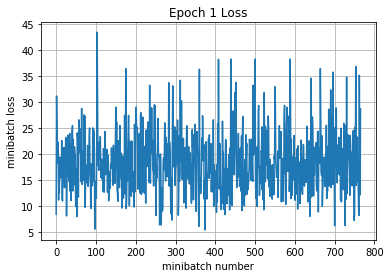

Validation
Epoch 1, Overall loss = 0.469 and accuracy of 0.855
Epoch 1, Overall loss = 0.456 and accuracy of 0.868
EPOCH = %d 84
Iteration 0: with minibatch training loss = 0.4 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.426 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.19 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.211 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.302 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.33 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.184 and accuracy of 0.97
Iteration 700: with minibatch training loss = 0.184 and accuracy of 0.95
Epoch 1, Overall loss = 0.278 and accuracy of 0.901


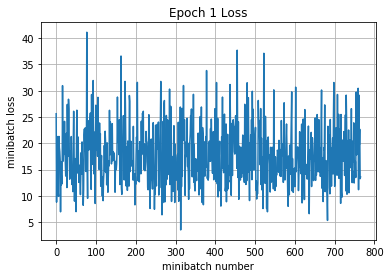

Validation
Epoch 1, Overall loss = 0.494 and accuracy of 0.843
Epoch 1, Overall loss = 0.504 and accuracy of 0.855
EPOCH = %d 85
Iteration 0: with minibatch training loss = 0.139 and accuracy of 0.97
Iteration 100: with minibatch training loss = 0.378 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.32 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.275 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.226 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.217 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.274 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.315 and accuracy of 0.83
Epoch 1, Overall loss = 0.277 and accuracy of 0.9


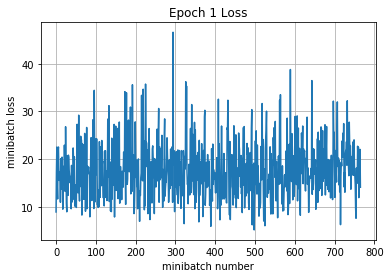

Validation
Epoch 1, Overall loss = 0.467 and accuracy of 0.849
Epoch 1, Overall loss = 0.481 and accuracy of 0.86
EPOCH = %d 86
Iteration 0: with minibatch training loss = 0.2 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.204 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.338 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.24 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.228 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.347 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.35 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.264 and accuracy of 0.91
Epoch 1, Overall loss = 0.274 and accuracy of 0.902


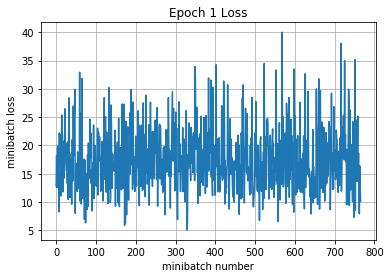

Validation
Epoch 1, Overall loss = 0.486 and accuracy of 0.845
Epoch 1, Overall loss = 0.495 and accuracy of 0.864
EPOCH = %d 87
Iteration 0: with minibatch training loss = 0.185 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.161 and accuracy of 0.97
Iteration 200: with minibatch training loss = 0.241 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.3 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.242 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.271 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.327 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.308 and accuracy of 0.91
Epoch 1, Overall loss = 0.272 and accuracy of 0.903


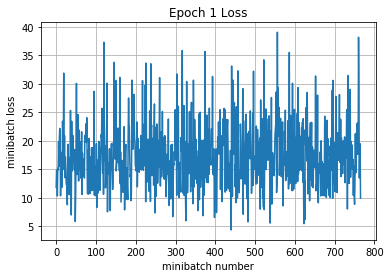

Validation
Epoch 1, Overall loss = 0.519 and accuracy of 0.853
Epoch 1, Overall loss = 0.484 and accuracy of 0.865
EPOCH = %d 88
Iteration 0: with minibatch training loss = 0.293 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.292 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.262 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.16 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.378 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.152 and accuracy of 0.95
Iteration 600: with minibatch training loss = 0.372 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.251 and accuracy of 0.97
Epoch 1, Overall loss = 0.272 and accuracy of 0.903


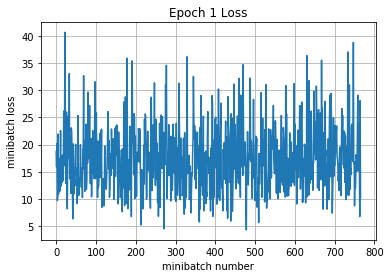

Validation
Epoch 1, Overall loss = 0.508 and accuracy of 0.847
Epoch 1, Overall loss = 0.514 and accuracy of 0.86
EPOCH = %d 89
Iteration 0: with minibatch training loss = 0.345 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.127 and accuracy of 0.97
Iteration 200: with minibatch training loss = 0.4 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.304 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.275 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.389 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.207 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.244 and accuracy of 0.91
Epoch 1, Overall loss = 0.272 and accuracy of 0.904


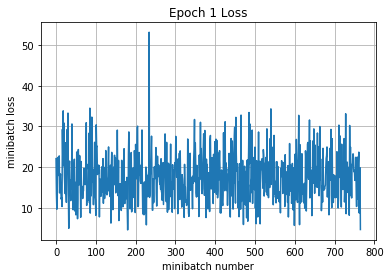

Validation
Epoch 1, Overall loss = 0.469 and accuracy of 0.856
Epoch 1, Overall loss = 0.466 and accuracy of 0.856
EPOCH = %d 90
Iteration 0: with minibatch training loss = 0.34 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.317 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.119 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.247 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.235 and accuracy of 0.95
Iteration 500: with minibatch training loss = 0.528 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.219 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.331 and accuracy of 0.88
Epoch 1, Overall loss = 0.261 and accuracy of 0.906


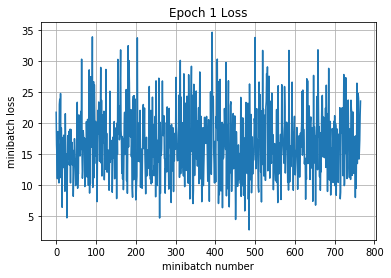

Validation
Epoch 1, Overall loss = 0.533 and accuracy of 0.846
Epoch 1, Overall loss = 0.511 and accuracy of 0.856
EPOCH = %d 91
Iteration 0: with minibatch training loss = 0.419 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.334 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.419 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.195 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.321 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.292 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.34 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.376 and accuracy of 0.91
Epoch 1, Overall loss = 0.265 and accuracy of 0.904


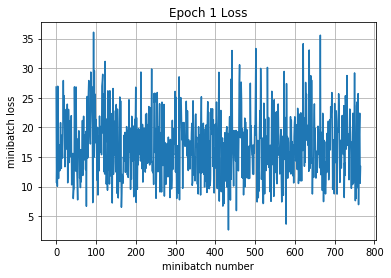

Validation
Epoch 1, Overall loss = 0.53 and accuracy of 0.843
Epoch 1, Overall loss = 0.516 and accuracy of 0.857
EPOCH = %d 92
Iteration 0: with minibatch training loss = 0.16 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.21 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.158 and accuracy of 0.94
Iteration 300: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 400: with minibatch training loss = 0.168 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.446 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.38 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.186 and accuracy of 0.94
Epoch 1, Overall loss = 0.258 and accuracy of 0.908


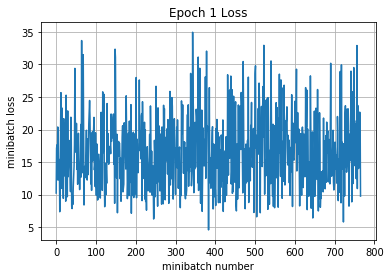

Validation
Epoch 1, Overall loss = 0.494 and accuracy of 0.853
Epoch 1, Overall loss = 0.471 and accuracy of 0.866
EPOCH = %d 93
Iteration 0: with minibatch training loss = 0.225 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.207 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.536 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.257 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.315 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.239 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.357 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.248 and accuracy of 0.88
Epoch 1, Overall loss = 0.256 and accuracy of 0.909


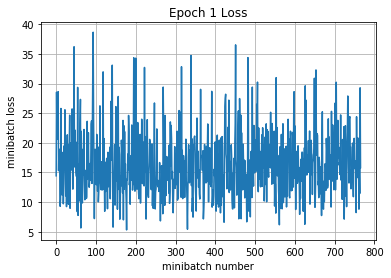

Validation
Epoch 1, Overall loss = 0.486 and accuracy of 0.859
Epoch 1, Overall loss = 0.483 and accuracy of 0.858
EPOCH = %d 94
Iteration 0: with minibatch training loss = 0.232 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.292 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.224 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.277 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.188 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.118 and accuracy of 0.95
Iteration 600: with minibatch training loss = 0.324 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.279 and accuracy of 0.91
Epoch 1, Overall loss = 0.255 and accuracy of 0.908


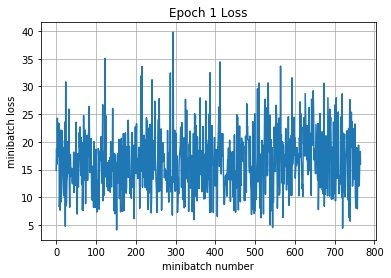

Validation
Epoch 1, Overall loss = 0.476 and accuracy of 0.851
Epoch 1, Overall loss = 0.473 and accuracy of 0.865
EPOCH = %d 95
Iteration 0: with minibatch training loss = 0.19 and accuracy of 0.97
Iteration 100: with minibatch training loss = 0.247 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.171 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.251 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.188 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.287 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.236 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.223 and accuracy of 0.94
Epoch 1, Overall loss = 0.252 and accuracy of 0.91


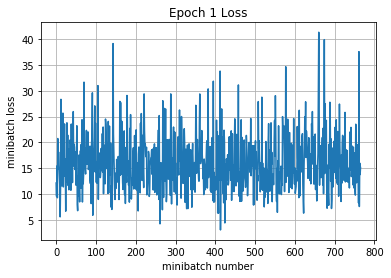

Validation
Epoch 1, Overall loss = 0.479 and accuracy of 0.852
Epoch 1, Overall loss = 0.488 and accuracy of 0.852
EPOCH = %d 96
Iteration 0: with minibatch training loss = 0.156 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.335 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.32 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.223 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.218 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.215 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.264 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.168 and accuracy of 0.95
Epoch 1, Overall loss = 0.254 and accuracy of 0.911


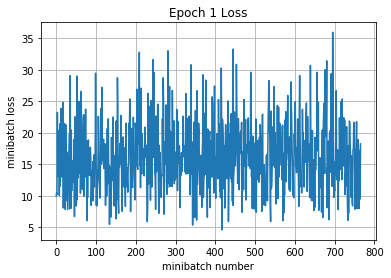

Validation
Epoch 1, Overall loss = 0.469 and accuracy of 0.86
Epoch 1, Overall loss = 0.49 and accuracy of 0.86
EPOCH = %d 97
Iteration 0: with minibatch training loss = 0.333 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.158 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.142 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.152 and accuracy of 0.95
Iteration 400: with minibatch training loss = 0.364 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.324 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.59 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.142 and accuracy of 0.94
Epoch 1, Overall loss = 0.246 and accuracy of 0.912


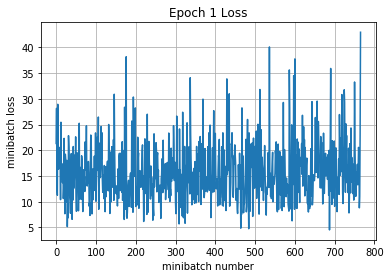

Validation
Epoch 1, Overall loss = 0.472 and accuracy of 0.859
Epoch 1, Overall loss = 0.474 and accuracy of 0.874
EPOCH = %d 98
Iteration 0: with minibatch training loss = 0.208 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.291 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.203 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 400: with minibatch training loss = 0.196 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.346 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.209 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.191 and accuracy of 0.92
Epoch 1, Overall loss = 0.249 and accuracy of 0.91


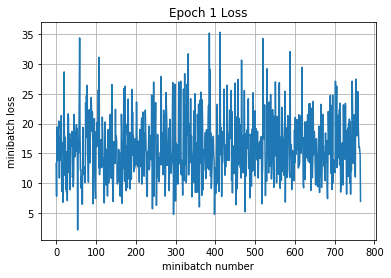

Validation
Epoch 1, Overall loss = 0.508 and accuracy of 0.848
Epoch 1, Overall loss = 0.502 and accuracy of 0.861
EPOCH = %d 99
Iteration 0: with minibatch training loss = 0.232 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.189 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.289 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.243 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.434 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.458 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.215 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.182 and accuracy of 0.92
Epoch 1, Overall loss = 0.248 and accuracy of 0.912


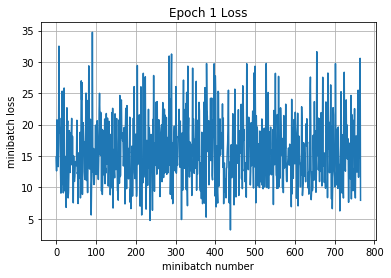

Validation
Epoch 1, Overall loss = 0.486 and accuracy of 0.855
Epoch 1, Overall loss = 0.507 and accuracy of 0.862


In [22]:
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
num_epochs = 100
for i in range(num_epochs):
    print ("EPOCH = %d",i)
    run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True,drop_o = 0.6)
    print('Validation')
    run_model(sess,y_out,mean_loss,X_val,y_val,1,64)
    run_model(sess,y_value,mean_loss2,X_val,y_val,1,64)

In [23]:
print('Training')
run_model(sess,y_value,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_value,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 0.0616 and accuracy of 0.991
Validation
Epoch 1, Overall loss = 0.5 and accuracy of 0.862


(0.50023630142211917, 0.86199999999999999)

In [27]:
#### Try a very deep different architecture based on global average pooling. It didn't help much in the performance
## and got arund 84-85 percent of accuracy on the validation set.

def my_model(X,y,drop_o,is_training):
    
    image = tf.map_fn(lambda img: tf.image.random_flip_left_right(img), X)
    image = tf.map_fn(lambda img: tf.image.random_brightness(img,max_delta=63),image)
    image = tf.map_fn(lambda img: tf.image.random_contrast(img,lower=0.2, upper=1.8),image)
        
    image = tf.map_fn(lambda img: tf.image.per_image_standardization(img),image)
    
    W_conv = tf.get_variable("Wconv",shape = [3,3,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(image, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn1')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    
    W_conv2 = tf.get_variable("Wconv2",shape = [2,2,32,64])
    b_conv2 = tf.get_variable("bconv2",shape = [64])
    a1 = tf.nn.conv2d(a1, W_conv2, strides=[1,1,1,1], padding='SAME') + b_conv2
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn2')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
  
   
    W_conv3 = tf.get_variable("Wconv3",shape = [2,2,64,128])
    b_conv3 = tf.get_variable("bconv3",shape = [128])
    a1 = tf.nn.conv2d(a1, W_conv3, strides=[1,1,1,1], padding='SAME') + b_conv3
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn3')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
    
    W_conv4 = tf.get_variable("Wconv4",shape = [2,2,128,256])
    b_conv4 = tf.get_variable("bconv4",shape = [256])
    a1 = tf.nn.conv2d(a1, W_conv4, strides=[1,1,1,1], padding='SAME') + b_conv4
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn4')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
    
    W_conv5 = tf.get_variable("Wconv5",shape = [2,2,256,512])
    b_conv5 = tf.get_variable("bconv5",shape = [512])
    a1 = tf.nn.conv2d(a1, W_conv5, strides=[1,1,1,1], padding='SAME') + b_conv5
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn5')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
    
    
    a1_flat = tf.reshape(a1,[-1,512])
    W1 = tf.get_variable("W1",shape = [512,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,1024])
    b2 = tf.get_variable("b2",shape = [1024])
    W3 = tf.get_variable("W3",shape = [1024,10])
    b3 = tf.get_variable("b3",shape = [10])
    
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    affine = tf.matmul(affine,W2) + b2
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    y_out = tf.matmul(affine,W2) + b2
    return y_out

def my_model2(X,y,drop_o,is_training):
    
    image = tf.map_fn(lambda img: tf.image.per_image_standardization(img),X)
    
    W_conv = tf.get_variable("Wconv",shape = [3,3,3,32])
    b_conv = tf.get_variable("bconv",shape = [32])
    a1 = tf.nn.conv2d(image, W_conv, strides=[1,1,1,1], padding='SAME') + b_conv
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn1')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    #a1 = tf.nn.dropout(a1,drop_o)
    
    W_conv2 = tf.get_variable("Wconv2",shape = [2,2,32,64])
    b_conv2 = tf.get_variable("bconv2",shape = [64])
    a1 = tf.nn.conv2d(a1, W_conv2, strides=[1,1,1,1], padding='SAME') + b_conv2
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn2')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    #a1 = tf.nn.dropout(a1,drop_o)
   
    W_conv3 = tf.get_variable("Wconv3",shape = [2,2,64,128])
    b_conv3 = tf.get_variable("bconv3",shape = [128])
    a1 = tf.nn.conv2d(a1, W_conv3, strides=[1,1,1,1], padding='SAME') + b_conv3
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn3')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    #a1 = tf.nn.dropout(a1,drop_o)
    
    W_conv4 = tf.get_variable("Wconv4",shape = [2,2,128,256])
    b_conv4 = tf.get_variable("bconv4",shape = [256])
    a1 = tf.nn.conv2d(a1, W_conv4, strides=[1,1,1,1], padding='SAME') + b_conv4
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn4')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
    
    W_conv5 = tf.get_variable("Wconv5",shape = [2,2,256,512])
    b_conv5 = tf.get_variable("bconv5",shape = [512])
    a1 = tf.nn.conv2d(a1, W_conv5, strides=[1,1,1,1], padding='SAME') + b_conv5
    a1 = tf.contrib.layers.batch_norm(a1,center = True, scale = True, is_training = is_training,scope = 'bn5')
    a1 = tf.nn.relu(a1)
    a1 = tf.nn.max_pool(a1,ksize = [1,2,2,1],strides = [1,2,2,1],padding = 'VALID')
    a1 = tf.nn.dropout(a1,drop_o)
    
    
    a1_flat = tf.reshape(a1,[-1,512])
    W1 = tf.get_variable("W1",shape = [512,1024])
    b1 = tf.get_variable("b1",shape = [1024])
    W2 = tf.get_variable("W2",shape = [1024,1024])
    b2 = tf.get_variable("b2",shape = [1024])
    W3 = tf.get_variable("W3",shape = [1024,10])
    b3 = tf.get_variable("b3",shape = [10])
    
    affine = tf.matmul(a1_flat,W1) + b1
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    affine = tf.matmul(affine,W2) + b2
    affine = tf.nn.relu(affine)
    affine = tf.nn.dropout(affine,drop_o)
    
    y_out = tf.matmul(affine,W2) + b2
    return y_out

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)
dropout = tf.placeholder(tf.float32, shape = ())

with tf.variable_scope("model") as scope:
    y_out = my_model(X,y,dropout,is_training)
    scope.reuse_variables()
    y_value = my_model2(X,y,dropout,is_training)
mean_loss = None
optimizer = None

total_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_out,labels = y)
mean_loss = tf.reduce_mean(total_loss)

total_loss2 = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = y_value,labels = y)
mean_loss2 = tf.reduce_mean(total_loss2)

optimizer = tf.train.AdamOptimizer(1e-4)

# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)


Training
EPOCH = %d 0
Iteration 0: with minibatch training loss = 7.09 and accuracy of 0.016
Iteration 100: with minibatch training loss = 2.32 and accuracy of 0.19
Iteration 200: with minibatch training loss = 1.88 and accuracy of 0.36
Iteration 300: with minibatch training loss = 1.84 and accuracy of 0.3
Iteration 400: with minibatch training loss = 1.86 and accuracy of 0.3
Iteration 500: with minibatch training loss = 1.55 and accuracy of 0.42
Iteration 600: with minibatch training loss = 1.67 and accuracy of 0.34
Iteration 700: with minibatch training loss = 1.46 and accuracy of 0.42
Epoch 1, Overall loss = 1.9 and accuracy of 0.335


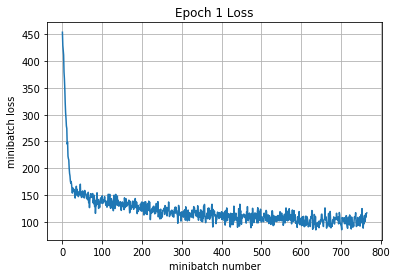

Validation
Epoch 1, Overall loss = 2.43 and accuracy of 0.281
Epoch 1, Overall loss = 2.42 and accuracy of 0.29
EPOCH = %d 1
Iteration 0: with minibatch training loss = 1.52 and accuracy of 0.48
Iteration 100: with minibatch training loss = 1.25 and accuracy of 0.56
Iteration 200: with minibatch training loss = 1.67 and accuracy of 0.53
Iteration 300: with minibatch training loss = 1.47 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.3 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.53 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.35 and accuracy of 0.48
Epoch 1, Overall loss = 1.45 and accuracy of 0.472


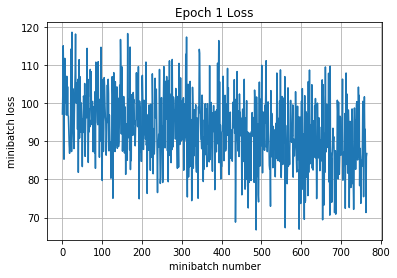

Validation
Epoch 1, Overall loss = 1.67 and accuracy of 0.437
Epoch 1, Overall loss = 1.66 and accuracy of 0.429
EPOCH = %d 2
Iteration 0: with minibatch training loss = 1.33 and accuracy of 0.42
Iteration 100: with minibatch training loss = 1.31 and accuracy of 0.53
Iteration 200: with minibatch training loss = 1.17 and accuracy of 0.56
Iteration 300: with minibatch training loss = 1.77 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.42 and accuracy of 0.48
Iteration 500: with minibatch training loss = 1.24 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.46 and accuracy of 0.38
Iteration 700: with minibatch training loss = 1.15 and accuracy of 0.56
Epoch 1, Overall loss = 1.32 and accuracy of 0.522


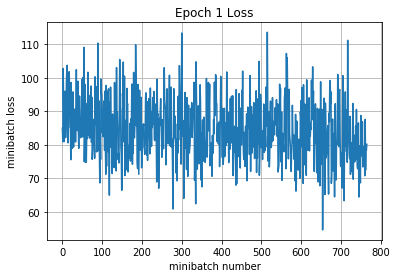

Validation
Epoch 1, Overall loss = 1.3 and accuracy of 0.556
Epoch 1, Overall loss = 1.32 and accuracy of 0.556
EPOCH = %d 3
Iteration 0: with minibatch training loss = 1.22 and accuracy of 0.52
Iteration 100: with minibatch training loss = 1.13 and accuracy of 0.56
Iteration 200: with minibatch training loss = 1.14 and accuracy of 0.62
Iteration 300: with minibatch training loss = 1.03 and accuracy of 0.69
Iteration 400: with minibatch training loss = 1.19 and accuracy of 0.62
Iteration 500: with minibatch training loss = 1.5 and accuracy of 0.52
Iteration 600: with minibatch training loss = 1.01 and accuracy of 0.62
Iteration 700: with minibatch training loss = 1.29 and accuracy of 0.55
Epoch 1, Overall loss = 1.23 and accuracy of 0.556


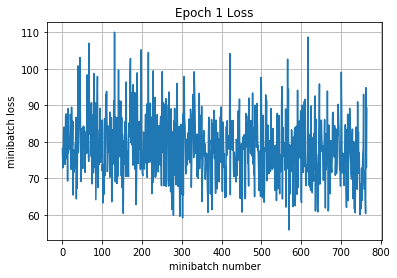

Validation
Epoch 1, Overall loss = 1.15 and accuracy of 0.601
Epoch 1, Overall loss = 1.16 and accuracy of 0.609
EPOCH = %d 4
Iteration 0: with minibatch training loss = 0.904 and accuracy of 0.64
Iteration 100: with minibatch training loss = 1.06 and accuracy of 0.61
Iteration 200: with minibatch training loss = 1.21 and accuracy of 0.62
Iteration 300: with minibatch training loss = 1.1 and accuracy of 0.61
Iteration 400: with minibatch training loss = 0.949 and accuracy of 0.66
Iteration 500: with minibatch training loss = 1.3 and accuracy of 0.47
Iteration 600: with minibatch training loss = 1.3 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.48 and accuracy of 0.42
Epoch 1, Overall loss = 1.15 and accuracy of 0.584


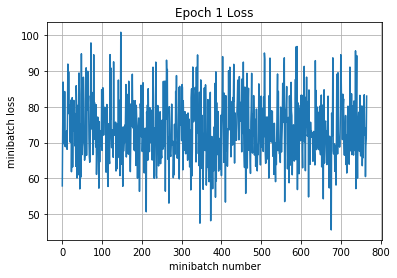

Validation
Epoch 1, Overall loss = 1.08 and accuracy of 0.633
Epoch 1, Overall loss = 1.09 and accuracy of 0.629
EPOCH = %d 5
Iteration 0: with minibatch training loss = 0.974 and accuracy of 0.59
Iteration 100: with minibatch training loss = 1.13 and accuracy of 0.58
Iteration 200: with minibatch training loss = 1.18 and accuracy of 0.53
Iteration 300: with minibatch training loss = 1.22 and accuracy of 0.56
Iteration 400: with minibatch training loss = 0.954 and accuracy of 0.62
Iteration 500: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 600: with minibatch training loss = 0.988 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.938 and accuracy of 0.62
Epoch 1, Overall loss = 1.1 and accuracy of 0.603


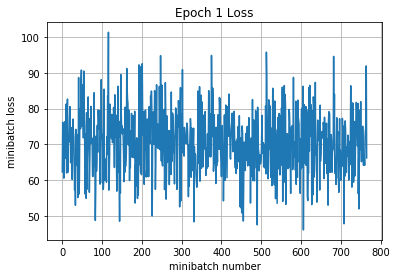

Validation
Epoch 1, Overall loss = 0.992 and accuracy of 0.66
Epoch 1, Overall loss = 0.984 and accuracy of 0.672
EPOCH = %d 6
Iteration 0: with minibatch training loss = 0.909 and accuracy of 0.64
Iteration 100: with minibatch training loss = 1.15 and accuracy of 0.56
Iteration 200: with minibatch training loss = 1.16 and accuracy of 0.61
Iteration 300: with minibatch training loss = 0.97 and accuracy of 0.64
Iteration 400: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 500: with minibatch training loss = 1.19 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.28 and accuracy of 0.56
Iteration 700: with minibatch training loss = 0.91 and accuracy of 0.64
Epoch 1, Overall loss = 1.05 and accuracy of 0.624


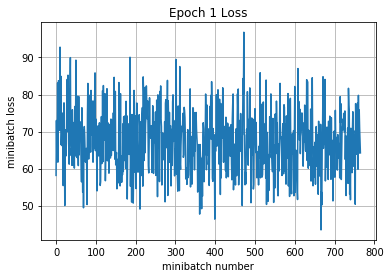

Validation
Epoch 1, Overall loss = 0.95 and accuracy of 0.67
Epoch 1, Overall loss = 0.928 and accuracy of 0.68
EPOCH = %d 7
Iteration 0: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 100: with minibatch training loss = 0.918 and accuracy of 0.69
Iteration 200: with minibatch training loss = 1.04 and accuracy of 0.62
Iteration 300: with minibatch training loss = 1.18 and accuracy of 0.55
Iteration 400: with minibatch training loss = 1.04 and accuracy of 0.7
Iteration 500: with minibatch training loss = 0.913 and accuracy of 0.67
Iteration 600: with minibatch training loss = 1 and accuracy of 0.61
Iteration 700: with minibatch training loss = 1.17 and accuracy of 0.61
Epoch 1, Overall loss = 1.01 and accuracy of 0.639


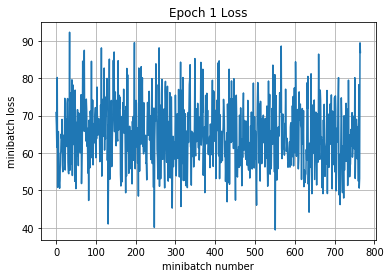

Validation
Epoch 1, Overall loss = 0.959 and accuracy of 0.677
Epoch 1, Overall loss = 0.944 and accuracy of 0.671
EPOCH = %d 8
Iteration 0: with minibatch training loss = 1.02 and accuracy of 0.61
Iteration 100: with minibatch training loss = 0.807 and accuracy of 0.69
Iteration 200: with minibatch training loss = 1 and accuracy of 0.64
Iteration 300: with minibatch training loss = 1.13 and accuracy of 0.56
Iteration 400: with minibatch training loss = 0.906 and accuracy of 0.66
Iteration 500: with minibatch training loss = 0.944 and accuracy of 0.62
Iteration 600: with minibatch training loss = 0.833 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.866 and accuracy of 0.67
Epoch 1, Overall loss = 0.979 and accuracy of 0.652


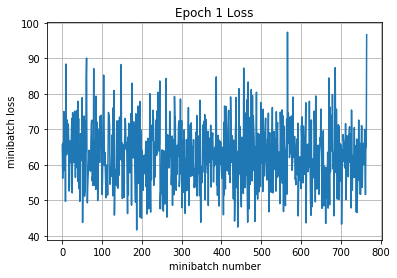

Validation
Epoch 1, Overall loss = 0.911 and accuracy of 0.684
Epoch 1, Overall loss = 0.881 and accuracy of 0.687
EPOCH = %d 9
Iteration 0: with minibatch training loss = 0.834 and accuracy of 0.7
Iteration 100: with minibatch training loss = 0.987 and accuracy of 0.66
Iteration 200: with minibatch training loss = 0.974 and accuracy of 0.69
Iteration 300: with minibatch training loss = 0.875 and accuracy of 0.66
Iteration 400: with minibatch training loss = 0.944 and accuracy of 0.67
Iteration 500: with minibatch training loss = 0.98 and accuracy of 0.7
Iteration 600: with minibatch training loss = 0.803 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.834 and accuracy of 0.67
Epoch 1, Overall loss = 0.946 and accuracy of 0.666


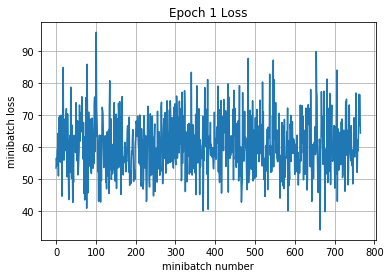

Validation
Epoch 1, Overall loss = 0.851 and accuracy of 0.702
Epoch 1, Overall loss = 0.861 and accuracy of 0.706
EPOCH = %d 10
Iteration 0: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 100: with minibatch training loss = 0.707 and accuracy of 0.73
Iteration 200: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 300: with minibatch training loss = 1.06 and accuracy of 0.67
Iteration 400: with minibatch training loss = 0.977 and accuracy of 0.62
Iteration 500: with minibatch training loss = 0.971 and accuracy of 0.64
Iteration 600: with minibatch training loss = 0.877 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.914 and accuracy of 0.66
Epoch 1, Overall loss = 0.925 and accuracy of 0.672


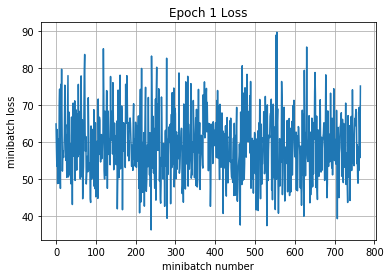

Validation
Epoch 1, Overall loss = 0.855 and accuracy of 0.706
Epoch 1, Overall loss = 0.838 and accuracy of 0.712
EPOCH = %d 11
Iteration 0: with minibatch training loss = 0.856 and accuracy of 0.7
Iteration 100: with minibatch training loss = 0.92 and accuracy of 0.66
Iteration 200: with minibatch training loss = 0.713 and accuracy of 0.75
Iteration 300: with minibatch training loss = 1.05 and accuracy of 0.59
Iteration 400: with minibatch training loss = 0.977 and accuracy of 0.66
Iteration 500: with minibatch training loss = 0.847 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.671 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.994 and accuracy of 0.67
Epoch 1, Overall loss = 0.896 and accuracy of 0.682


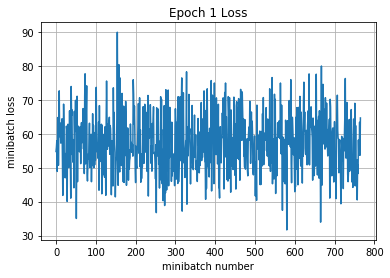

Validation
Epoch 1, Overall loss = 0.806 and accuracy of 0.713
Epoch 1, Overall loss = 0.805 and accuracy of 0.725
EPOCH = %d 12
Iteration 0: with minibatch training loss = 1.05 and accuracy of 0.58
Iteration 100: with minibatch training loss = 1.01 and accuracy of 0.59
Iteration 200: with minibatch training loss = 0.873 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.98 and accuracy of 0.59
Iteration 400: with minibatch training loss = 0.862 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.596 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.899 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.859 and accuracy of 0.72
Epoch 1, Overall loss = 0.877 and accuracy of 0.689


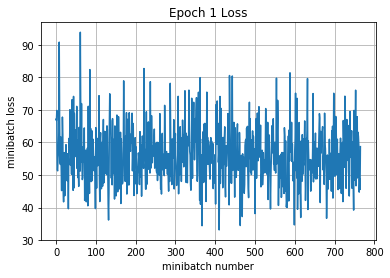

Validation
Epoch 1, Overall loss = 0.826 and accuracy of 0.719
Epoch 1, Overall loss = 0.832 and accuracy of 0.727
EPOCH = %d 13
Iteration 0: with minibatch training loss = 0.983 and accuracy of 0.59
Iteration 100: with minibatch training loss = 0.876 and accuracy of 0.69
Iteration 200: with minibatch training loss = 0.937 and accuracy of 0.66
Iteration 300: with minibatch training loss = 0.761 and accuracy of 0.67
Iteration 400: with minibatch training loss = 0.746 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.978 and accuracy of 0.67
Iteration 600: with minibatch training loss = 0.943 and accuracy of 0.64
Iteration 700: with minibatch training loss = 1.17 and accuracy of 0.61
Epoch 1, Overall loss = 0.854 and accuracy of 0.698


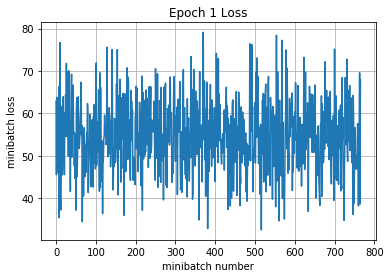

Validation
Epoch 1, Overall loss = 0.761 and accuracy of 0.733
Epoch 1, Overall loss = 0.776 and accuracy of 0.739
EPOCH = %d 14
Iteration 0: with minibatch training loss = 0.794 and accuracy of 0.67
Iteration 100: with minibatch training loss = 0.824 and accuracy of 0.75
Iteration 200: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 300: with minibatch training loss = 0.721 and accuracy of 0.72
Iteration 400: with minibatch training loss = 0.625 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.611 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.727 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.914 and accuracy of 0.67
Epoch 1, Overall loss = 0.832 and accuracy of 0.704


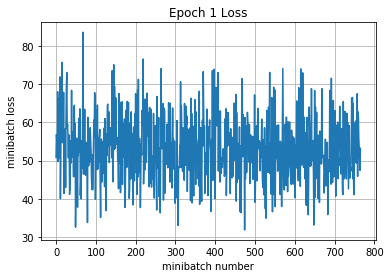

Validation
Epoch 1, Overall loss = 0.736 and accuracy of 0.76
Epoch 1, Overall loss = 0.757 and accuracy of 0.742
EPOCH = %d 15
Iteration 0: with minibatch training loss = 0.782 and accuracy of 0.7
Iteration 100: with minibatch training loss = 0.922 and accuracy of 0.7
Iteration 200: with minibatch training loss = 0.801 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.691 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.877 and accuracy of 0.7
Iteration 500: with minibatch training loss = 0.794 and accuracy of 0.7
Iteration 600: with minibatch training loss = 0.762 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.676 and accuracy of 0.72
Epoch 1, Overall loss = 0.822 and accuracy of 0.708


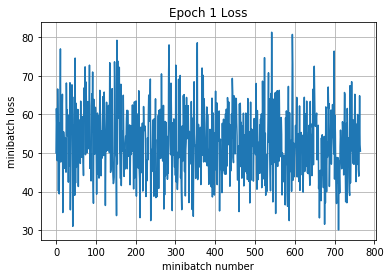

Validation
Epoch 1, Overall loss = 0.759 and accuracy of 0.722
Epoch 1, Overall loss = 0.766 and accuracy of 0.741
EPOCH = %d 16
Iteration 0: with minibatch training loss = 0.908 and accuracy of 0.64
Iteration 100: with minibatch training loss = 0.648 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.74 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.496 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.616 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.85 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.783 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.821 and accuracy of 0.66
Epoch 1, Overall loss = 0.802 and accuracy of 0.718


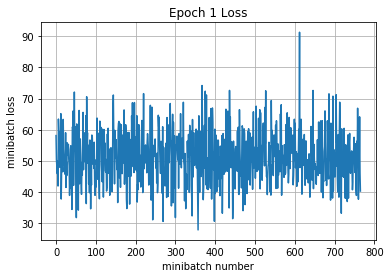

Validation
Epoch 1, Overall loss = 0.753 and accuracy of 0.748
Epoch 1, Overall loss = 0.76 and accuracy of 0.755
EPOCH = %d 17
Iteration 0: with minibatch training loss = 0.833 and accuracy of 0.67
Iteration 100: with minibatch training loss = 0.751 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.848 and accuracy of 0.67
Iteration 300: with minibatch training loss = 0.774 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.912 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.638 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.913 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.759 and accuracy of 0.78
Epoch 1, Overall loss = 0.793 and accuracy of 0.72


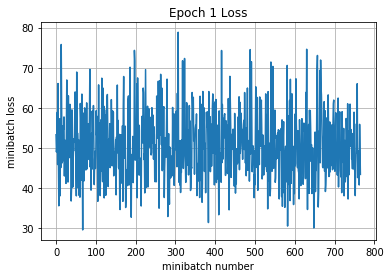

Validation
Epoch 1, Overall loss = 0.728 and accuracy of 0.747
Epoch 1, Overall loss = 0.74 and accuracy of 0.766
EPOCH = %d 18
Iteration 0: with minibatch training loss = 0.917 and accuracy of 0.66
Iteration 100: with minibatch training loss = 0.656 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.885 and accuracy of 0.67
Iteration 300: with minibatch training loss = 0.599 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.764 and accuracy of 0.73
Iteration 500: with minibatch training loss = 0.72 and accuracy of 0.69
Iteration 600: with minibatch training loss = 0.871 and accuracy of 0.67
Iteration 700: with minibatch training loss = 0.625 and accuracy of 0.81
Epoch 1, Overall loss = 0.772 and accuracy of 0.727


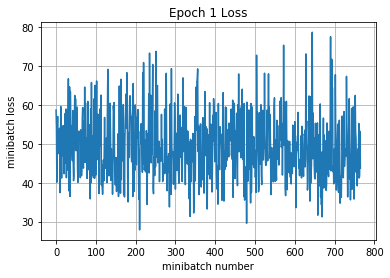

Validation
Epoch 1, Overall loss = 0.697 and accuracy of 0.775
Epoch 1, Overall loss = 0.715 and accuracy of 0.755
EPOCH = %d 19
Iteration 0: with minibatch training loss = 0.668 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.925 and accuracy of 0.66
Iteration 200: with minibatch training loss = 0.83 and accuracy of 0.69
Iteration 300: with minibatch training loss = 0.893 and accuracy of 0.69
Iteration 400: with minibatch training loss = 0.566 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.634 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.72 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.669 and accuracy of 0.8
Epoch 1, Overall loss = 0.761 and accuracy of 0.732


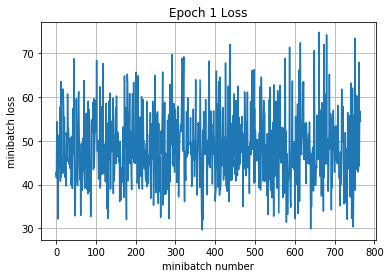

Validation
Epoch 1, Overall loss = 0.707 and accuracy of 0.756
Epoch 1, Overall loss = 0.688 and accuracy of 0.769
EPOCH = %d 20
Iteration 0: with minibatch training loss = 0.601 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.523 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.752 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.802 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.79 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.673 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.611 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.931 and accuracy of 0.64
Epoch 1, Overall loss = 0.746 and accuracy of 0.739


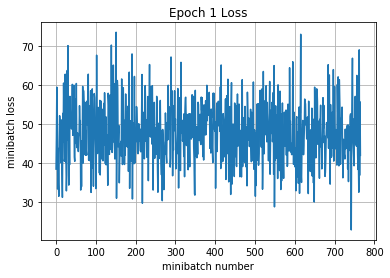

Validation
Epoch 1, Overall loss = 0.702 and accuracy of 0.774
Epoch 1, Overall loss = 0.692 and accuracy of 0.769
EPOCH = %d 21
Iteration 0: with minibatch training loss = 0.585 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.664 and accuracy of 0.75
Iteration 200: with minibatch training loss = 1.03 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.865 and accuracy of 0.75
Iteration 400: with minibatch training loss = 1.08 and accuracy of 0.62
Iteration 500: with minibatch training loss = 0.442 and accuracy of 0.86
Iteration 600: with minibatch training loss = 1.13 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.657 and accuracy of 0.81
Epoch 1, Overall loss = 0.741 and accuracy of 0.738


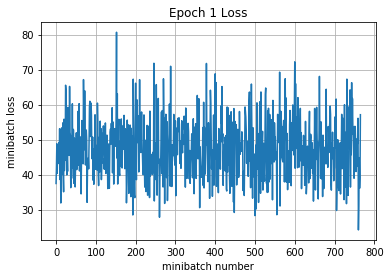

Validation
Epoch 1, Overall loss = 0.682 and accuracy of 0.768
Epoch 1, Overall loss = 0.679 and accuracy of 0.782
EPOCH = %d 22
Iteration 0: with minibatch training loss = 0.671 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.808 and accuracy of 0.72
Iteration 200: with minibatch training loss = 0.71 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.502 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.503 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.552 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.681 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.908 and accuracy of 0.7
Epoch 1, Overall loss = 0.724 and accuracy of 0.745


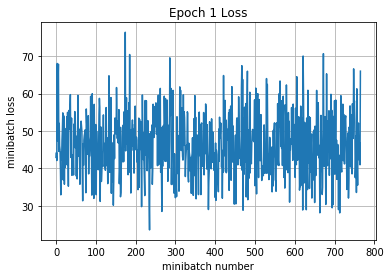

Validation
Epoch 1, Overall loss = 0.716 and accuracy of 0.748
Epoch 1, Overall loss = 0.706 and accuracy of 0.762
EPOCH = %d 23
Iteration 0: with minibatch training loss = 0.741 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.772 and accuracy of 0.7
Iteration 200: with minibatch training loss = 0.947 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.465 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.585 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.731 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.585 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.781 and accuracy of 0.69
Epoch 1, Overall loss = 0.716 and accuracy of 0.748


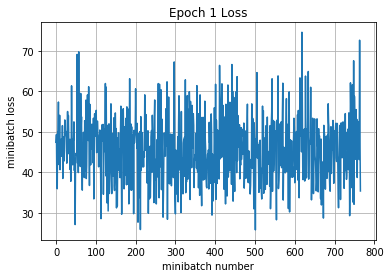

Validation
Epoch 1, Overall loss = 0.653 and accuracy of 0.784
Epoch 1, Overall loss = 0.675 and accuracy of 0.781
EPOCH = %d 24
Iteration 0: with minibatch training loss = 0.896 and accuracy of 0.64
Iteration 100: with minibatch training loss = 0.721 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.732 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.92 and accuracy of 0.67
Iteration 400: with minibatch training loss = 0.733 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.778 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.738 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.769 and accuracy of 0.7
Epoch 1, Overall loss = 0.705 and accuracy of 0.753


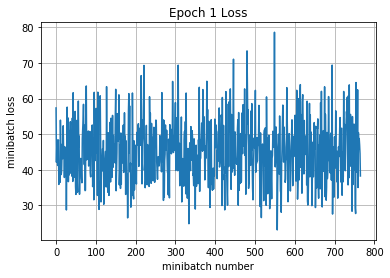

Validation
Epoch 1, Overall loss = 0.668 and accuracy of 0.771
Epoch 1, Overall loss = 0.639 and accuracy of 0.781
EPOCH = %d 25
Iteration 0: with minibatch training loss = 0.66 and accuracy of 0.73
Iteration 100: with minibatch training loss = 0.681 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.544 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.526 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.618 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.585 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.791 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.603 and accuracy of 0.78
Epoch 1, Overall loss = 0.689 and accuracy of 0.757


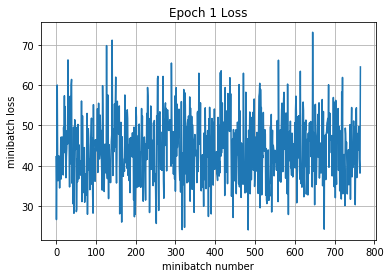

Validation
Epoch 1, Overall loss = 0.66 and accuracy of 0.773
Epoch 1, Overall loss = 0.669 and accuracy of 0.777
EPOCH = %d 26
Iteration 0: with minibatch training loss = 0.663 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.648 and accuracy of 0.73
Iteration 200: with minibatch training loss = 0.719 and accuracy of 0.69
Iteration 300: with minibatch training loss = 0.443 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.797 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.53 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.632 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.926 and accuracy of 0.67
Epoch 1, Overall loss = 0.683 and accuracy of 0.759


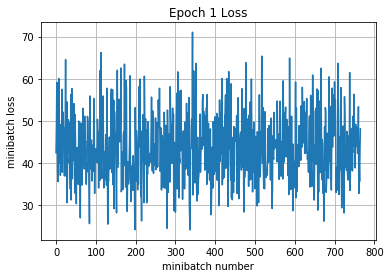

Validation
Epoch 1, Overall loss = 0.637 and accuracy of 0.792
Epoch 1, Overall loss = 0.655 and accuracy of 0.788
EPOCH = %d 27
Iteration 0: with minibatch training loss = 0.844 and accuracy of 0.7
Iteration 100: with minibatch training loss = 0.579 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.631 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.681 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.742 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.646 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.702 and accuracy of 0.72
Iteration 700: with minibatch training loss = 0.725 and accuracy of 0.73
Epoch 1, Overall loss = 0.669 and accuracy of 0.764


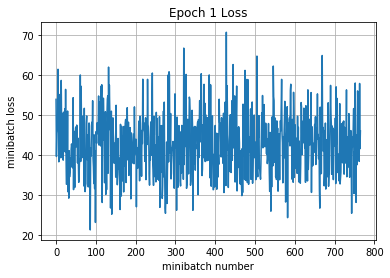

Validation
Epoch 1, Overall loss = 0.667 and accuracy of 0.777
Epoch 1, Overall loss = 0.641 and accuracy of 0.792
EPOCH = %d 28
Iteration 0: with minibatch training loss = 0.571 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.66 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.776 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.66 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.629 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.628 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.565 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.788 and accuracy of 0.72
Epoch 1, Overall loss = 0.666 and accuracy of 0.764


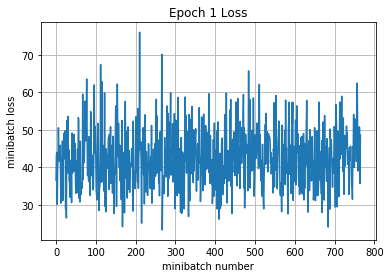

Validation
Epoch 1, Overall loss = 0.668 and accuracy of 0.775
Epoch 1, Overall loss = 0.664 and accuracy of 0.783
EPOCH = %d 29
Iteration 0: with minibatch training loss = 0.568 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.579 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.642 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.674 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.623 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.735 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.693 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.79 and accuracy of 0.7
Epoch 1, Overall loss = 0.661 and accuracy of 0.768


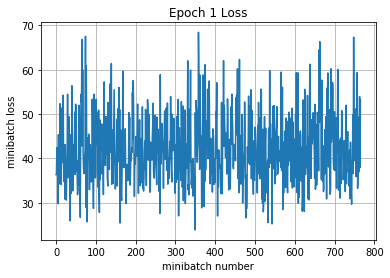

Validation
Epoch 1, Overall loss = 0.641 and accuracy of 0.788
Epoch 1, Overall loss = 0.645 and accuracy of 0.782
EPOCH = %d 30
Iteration 0: with minibatch training loss = 0.758 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.896 and accuracy of 0.72
Iteration 200: with minibatch training loss = 0.746 and accuracy of 0.7
Iteration 300: with minibatch training loss = 0.742 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.596 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.8 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.474 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.543 and accuracy of 0.8
Epoch 1, Overall loss = 0.652 and accuracy of 0.77


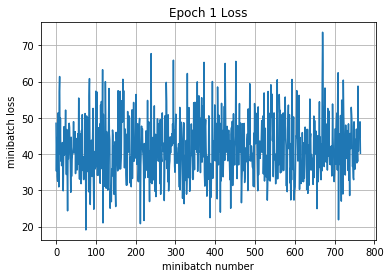

Validation
Epoch 1, Overall loss = 0.603 and accuracy of 0.792
Epoch 1, Overall loss = 0.609 and accuracy of 0.792
EPOCH = %d 31
Iteration 0: with minibatch training loss = 0.477 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.623 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.572 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.608 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.7 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.536 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.665 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.681 and accuracy of 0.75
Epoch 1, Overall loss = 0.637 and accuracy of 0.777


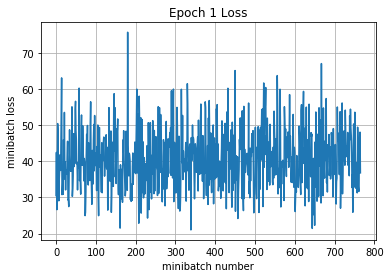

Validation
Epoch 1, Overall loss = 0.615 and accuracy of 0.804
Epoch 1, Overall loss = 0.614 and accuracy of 0.792
EPOCH = %d 32
Iteration 0: with minibatch training loss = 0.625 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.461 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.868 and accuracy of 0.69
Iteration 300: with minibatch training loss = 0.553 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.548 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.537 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.517 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.644 and accuracy of 0.8
Epoch 1, Overall loss = 0.628 and accuracy of 0.779


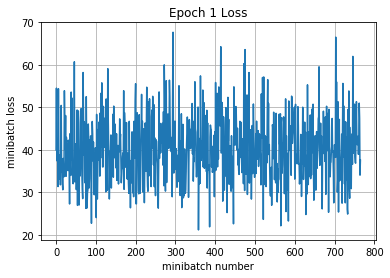

Validation
Epoch 1, Overall loss = 0.603 and accuracy of 0.798
Epoch 1, Overall loss = 0.594 and accuracy of 0.796
EPOCH = %d 33
Iteration 0: with minibatch training loss = 0.615 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.811 and accuracy of 0.67
Iteration 200: with minibatch training loss = 0.583 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.512 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.529 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.694 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.519 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.657 and accuracy of 0.77
Epoch 1, Overall loss = 0.624 and accuracy of 0.78


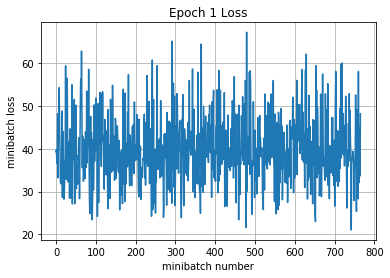

Validation
Epoch 1, Overall loss = 0.606 and accuracy of 0.794
Epoch 1, Overall loss = 0.611 and accuracy of 0.794
EPOCH = %d 34
Iteration 0: with minibatch training loss = 0.571 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.539 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.578 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.374 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.51 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.451 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.497 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.456 and accuracy of 0.88
Epoch 1, Overall loss = 0.613 and accuracy of 0.784


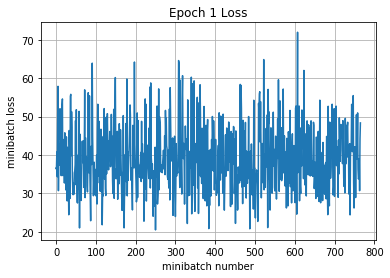

Validation
Epoch 1, Overall loss = 0.59 and accuracy of 0.795
Epoch 1, Overall loss = 0.59 and accuracy of 0.807
EPOCH = %d 35
Iteration 0: with minibatch training loss = 0.78 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.548 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.531 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.565 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.486 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.549 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.506 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.508 and accuracy of 0.81
Epoch 1, Overall loss = 0.607 and accuracy of 0.786


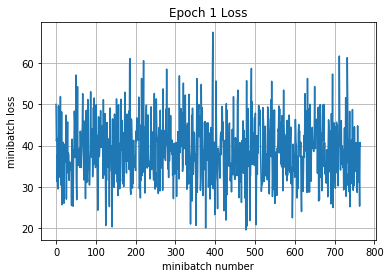

Validation
Epoch 1, Overall loss = 0.612 and accuracy of 0.793
Epoch 1, Overall loss = 0.633 and accuracy of 0.795
EPOCH = %d 36
Iteration 0: with minibatch training loss = 0.655 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.687 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.545 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.576 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.453 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.54 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.81 and accuracy of 0.7
Iteration 700: with minibatch training loss = 0.443 and accuracy of 0.83
Epoch 1, Overall loss = 0.598 and accuracy of 0.79


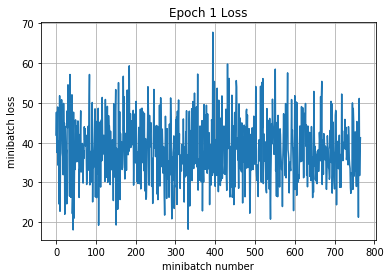

Validation
Epoch 1, Overall loss = 0.653 and accuracy of 0.787
Epoch 1, Overall loss = 0.627 and accuracy of 0.788
EPOCH = %d 37
Iteration 0: with minibatch training loss = 0.521 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.41 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.514 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.713 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.43 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.46 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.48 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.748 and accuracy of 0.77
Epoch 1, Overall loss = 0.594 and accuracy of 0.789


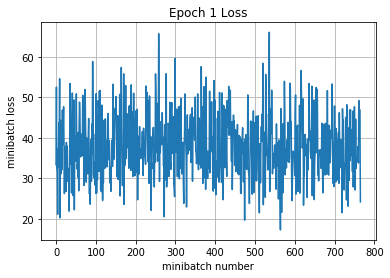

Validation
Epoch 1, Overall loss = 0.596 and accuracy of 0.804
Epoch 1, Overall loss = 0.6 and accuracy of 0.799
EPOCH = %d 38
Iteration 0: with minibatch training loss = 0.797 and accuracy of 0.75
Iteration 100: with minibatch training loss = 0.661 and accuracy of 0.72
Iteration 200: with minibatch training loss = 0.615 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.615 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.649 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.594 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.418 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.667 and accuracy of 0.78
Epoch 1, Overall loss = 0.584 and accuracy of 0.795


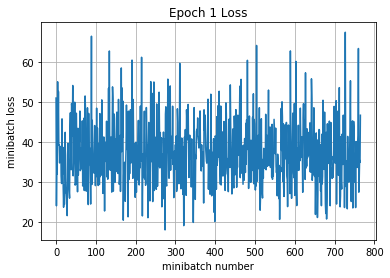

Validation
Epoch 1, Overall loss = 0.589 and accuracy of 0.798
Epoch 1, Overall loss = 0.604 and accuracy of 0.802
EPOCH = %d 39
Iteration 0: with minibatch training loss = 0.59 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.56 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.613 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.565 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.628 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.47 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.675 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.507 and accuracy of 0.83
Epoch 1, Overall loss = 0.58 and accuracy of 0.794


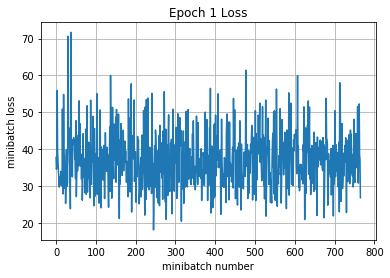

Validation
Epoch 1, Overall loss = 0.567 and accuracy of 0.81
Epoch 1, Overall loss = 0.568 and accuracy of 0.806
EPOCH = %d 40
Iteration 0: with minibatch training loss = 0.61 and accuracy of 0.8
Iteration 100: with minibatch training loss = 0.45 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.485 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.462 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.554 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.539 and accuracy of 0.75
Iteration 600: with minibatch training loss = 0.759 and accuracy of 0.73
Iteration 700: with minibatch training loss = 0.628 and accuracy of 0.77
Epoch 1, Overall loss = 0.575 and accuracy of 0.797


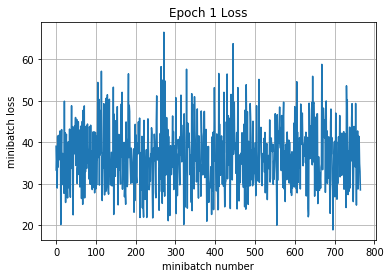

Validation
Epoch 1, Overall loss = 0.575 and accuracy of 0.799
Epoch 1, Overall loss = 0.581 and accuracy of 0.807
EPOCH = %d 41
Iteration 0: with minibatch training loss = 0.554 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.591 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.648 and accuracy of 0.73
Iteration 300: with minibatch training loss = 0.841 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.67 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.619 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.476 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.518 and accuracy of 0.78
Epoch 1, Overall loss = 0.57 and accuracy of 0.798


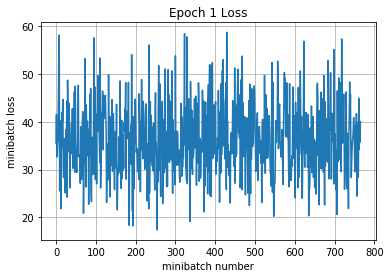

Validation
Epoch 1, Overall loss = 0.561 and accuracy of 0.802
Epoch 1, Overall loss = 0.572 and accuracy of 0.819
EPOCH = %d 42
Iteration 0: with minibatch training loss = 0.538 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.506 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.498 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.381 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.555 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.545 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.63 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.487 and accuracy of 0.89
Epoch 1, Overall loss = 0.564 and accuracy of 0.802


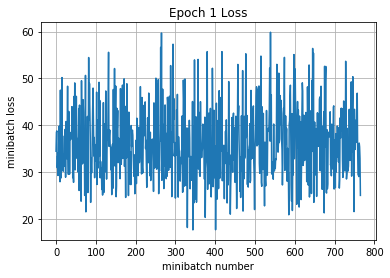

Validation
Epoch 1, Overall loss = 0.573 and accuracy of 0.804
Epoch 1, Overall loss = 0.599 and accuracy of 0.797
EPOCH = %d 43
Iteration 0: with minibatch training loss = 0.497 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.445 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.628 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.461 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.618 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.679 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.49 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.457 and accuracy of 0.8
Epoch 1, Overall loss = 0.557 and accuracy of 0.805


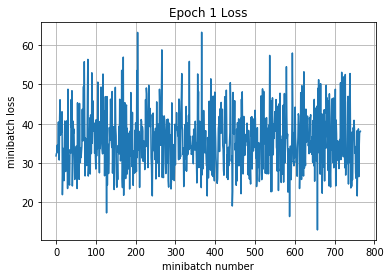

Validation
Epoch 1, Overall loss = 0.592 and accuracy of 0.803
Epoch 1, Overall loss = 0.602 and accuracy of 0.809
EPOCH = %d 44
Iteration 0: with minibatch training loss = 0.389 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.437 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.384 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.468 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.465 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.63 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.503 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.455 and accuracy of 0.8
Epoch 1, Overall loss = 0.551 and accuracy of 0.804


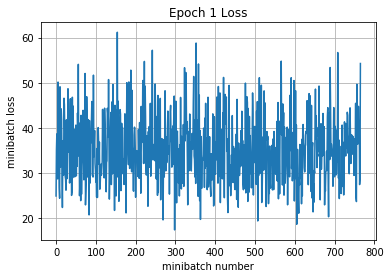

Validation
Epoch 1, Overall loss = 0.594 and accuracy of 0.805
Epoch 1, Overall loss = 0.582 and accuracy of 0.809
EPOCH = %d 45
Iteration 0: with minibatch training loss = 0.38 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.419 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.566 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.676 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.507 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.574 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.682 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.484 and accuracy of 0.84
Epoch 1, Overall loss = 0.544 and accuracy of 0.807


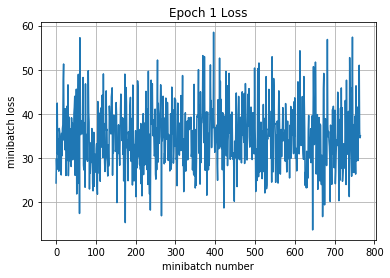

Validation
Epoch 1, Overall loss = 0.572 and accuracy of 0.811
Epoch 1, Overall loss = 0.611 and accuracy of 0.813
EPOCH = %d 46
Iteration 0: with minibatch training loss = 0.681 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.488 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.653 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.452 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.506 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.412 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.492 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.351 and accuracy of 0.84
Epoch 1, Overall loss = 0.542 and accuracy of 0.808


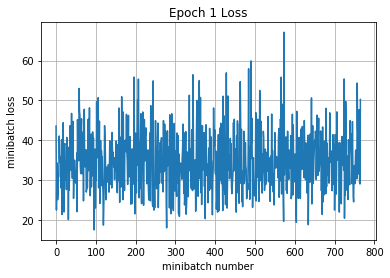

Validation
Epoch 1, Overall loss = 0.576 and accuracy of 0.813
Epoch 1, Overall loss = 0.593 and accuracy of 0.809
EPOCH = %d 47
Iteration 0: with minibatch training loss = 0.599 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.626 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.53 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.444 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.664 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.701 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.512 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.441 and accuracy of 0.83
Epoch 1, Overall loss = 0.532 and accuracy of 0.813


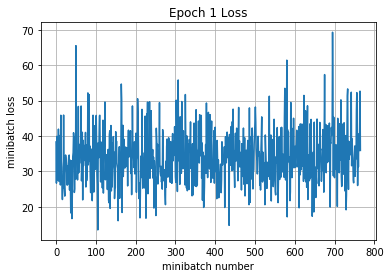

Validation
Epoch 1, Overall loss = 0.55 and accuracy of 0.817
Epoch 1, Overall loss = 0.542 and accuracy of 0.822
EPOCH = %d 48
Iteration 0: with minibatch training loss = 0.496 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.659 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.479 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.518 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.637 and accuracy of 0.77
Iteration 500: with minibatch training loss = 0.764 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.45 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.61 and accuracy of 0.75
Epoch 1, Overall loss = 0.523 and accuracy of 0.814


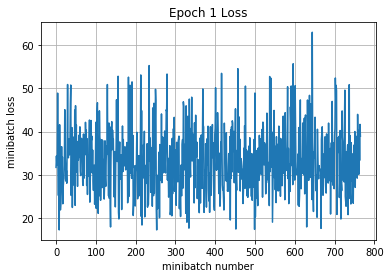

Validation
Epoch 1, Overall loss = 0.641 and accuracy of 0.799
Epoch 1, Overall loss = 0.628 and accuracy of 0.798
EPOCH = %d 49
Iteration 0: with minibatch training loss = 0.448 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.413 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.54 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.616 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.484 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.405 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.396 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.497 and accuracy of 0.83
Epoch 1, Overall loss = 0.521 and accuracy of 0.816


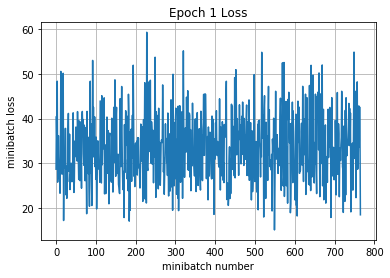

Validation
Epoch 1, Overall loss = 0.58 and accuracy of 0.81
Epoch 1, Overall loss = 0.577 and accuracy of 0.805
EPOCH = %d 50
Iteration 0: with minibatch training loss = 0.55 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.512 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.48 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.53 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.434 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.609 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.48 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.637 and accuracy of 0.8
Epoch 1, Overall loss = 0.515 and accuracy of 0.816


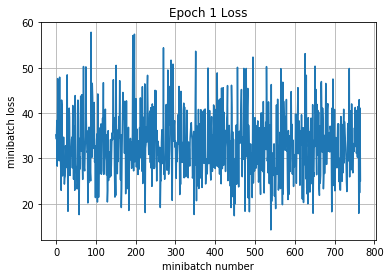

Validation
Epoch 1, Overall loss = 0.549 and accuracy of 0.823
Epoch 1, Overall loss = 0.533 and accuracy of 0.83
EPOCH = %d 51
Iteration 0: with minibatch training loss = 0.443 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.712 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.545 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.472 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.428 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.593 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.339 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.577 and accuracy of 0.78
Epoch 1, Overall loss = 0.505 and accuracy of 0.822


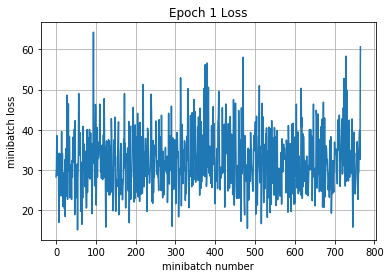

Validation
Epoch 1, Overall loss = 0.544 and accuracy of 0.819
Epoch 1, Overall loss = 0.539 and accuracy of 0.827
EPOCH = %d 52
Iteration 0: with minibatch training loss = 0.396 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.473 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.399 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.537 and accuracy of 0.77
Iteration 400: with minibatch training loss = 0.23 and accuracy of 0.97
Iteration 500: with minibatch training loss = 0.745 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.511 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.434 and accuracy of 0.86
Epoch 1, Overall loss = 0.509 and accuracy of 0.822


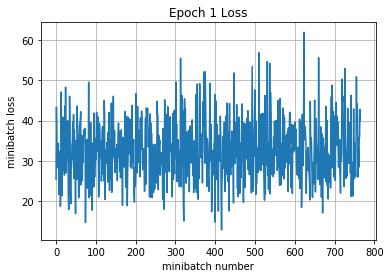

Validation
Epoch 1, Overall loss = 0.557 and accuracy of 0.81
Epoch 1, Overall loss = 0.574 and accuracy of 0.814
EPOCH = %d 53
Iteration 0: with minibatch training loss = 0.412 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.399 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.447 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.498 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.438 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.626 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.457 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.361 and accuracy of 0.91
Epoch 1, Overall loss = 0.496 and accuracy of 0.823


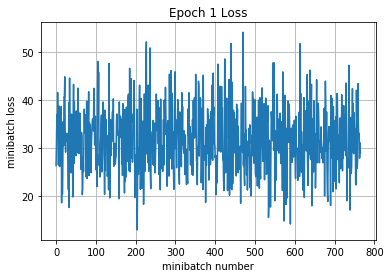

Validation
Epoch 1, Overall loss = 0.559 and accuracy of 0.81
Epoch 1, Overall loss = 0.594 and accuracy of 0.807
EPOCH = %d 54
Iteration 0: with minibatch training loss = 0.37 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.769 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.604 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.775 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.295 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.354 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.524 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.296 and accuracy of 0.91
Epoch 1, Overall loss = 0.494 and accuracy of 0.825


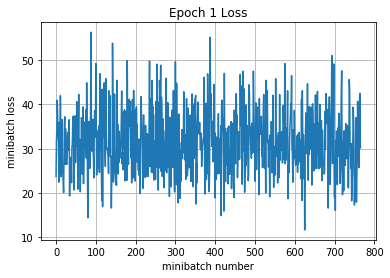

Validation
Epoch 1, Overall loss = 0.594 and accuracy of 0.818
Epoch 1, Overall loss = 0.58 and accuracy of 0.815
EPOCH = %d 55
Iteration 0: with minibatch training loss = 0.386 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.313 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.334 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.541 and accuracy of 0.8
Iteration 400: with minibatch training loss = 0.435 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.401 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.332 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.41 and accuracy of 0.86
Epoch 1, Overall loss = 0.485 and accuracy of 0.828


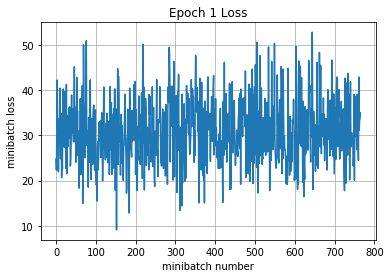

Validation
Epoch 1, Overall loss = 0.527 and accuracy of 0.83
Epoch 1, Overall loss = 0.536 and accuracy of 0.822
EPOCH = %d 56
Iteration 0: with minibatch training loss = 0.293 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.383 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.542 and accuracy of 0.78
Iteration 300: with minibatch training loss = 0.469 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.427 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.504 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.535 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.472 and accuracy of 0.84
Epoch 1, Overall loss = 0.487 and accuracy of 0.825


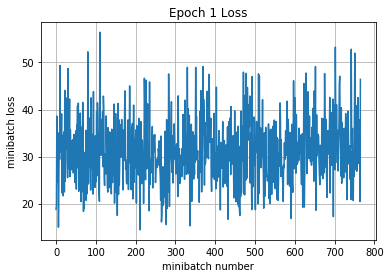

Validation
Epoch 1, Overall loss = 0.542 and accuracy of 0.823
Epoch 1, Overall loss = 0.559 and accuracy of 0.815
EPOCH = %d 57
Iteration 0: with minibatch training loss = 0.47 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.304 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.596 and accuracy of 0.72
Iteration 300: with minibatch training loss = 0.286 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.421 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.62 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.349 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.735 and accuracy of 0.77
Epoch 1, Overall loss = 0.48 and accuracy of 0.829


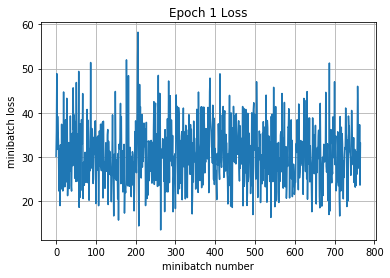

Validation
Epoch 1, Overall loss = 0.534 and accuracy of 0.823
Epoch 1, Overall loss = 0.525 and accuracy of 0.83
EPOCH = %d 58
Iteration 0: with minibatch training loss = 0.562 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.613 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.587 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.481 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.442 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.456 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.51 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.492 and accuracy of 0.81
Epoch 1, Overall loss = 0.48 and accuracy of 0.83


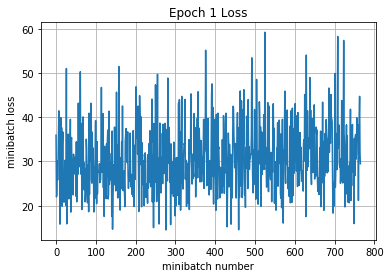

Validation
Epoch 1, Overall loss = 0.534 and accuracy of 0.831
Epoch 1, Overall loss = 0.542 and accuracy of 0.836
EPOCH = %d 59
Iteration 0: with minibatch training loss = 0.305 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.393 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.331 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.527 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.361 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.479 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.676 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.501 and accuracy of 0.78
Epoch 1, Overall loss = 0.473 and accuracy of 0.832


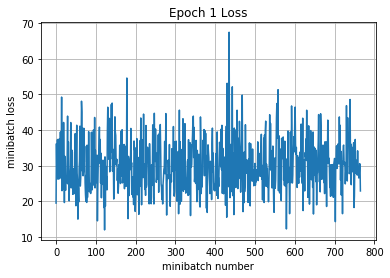

Validation
Epoch 1, Overall loss = 0.55 and accuracy of 0.835
Epoch 1, Overall loss = 0.543 and accuracy of 0.833
EPOCH = %d 60
Iteration 0: with minibatch training loss = 0.317 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.457 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.424 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.385 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.38 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.823 and accuracy of 0.7
Iteration 600: with minibatch training loss = 0.625 and accuracy of 0.77
Iteration 700: with minibatch training loss = 0.669 and accuracy of 0.81
Epoch 1, Overall loss = 0.467 and accuracy of 0.833


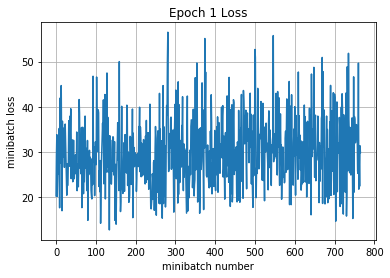

Validation
Epoch 1, Overall loss = 0.592 and accuracy of 0.804
Epoch 1, Overall loss = 0.589 and accuracy of 0.814
EPOCH = %d 61
Iteration 0: with minibatch training loss = 0.588 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.349 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.365 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.364 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.57 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.494 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.339 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.316 and accuracy of 0.84
Epoch 1, Overall loss = 0.46 and accuracy of 0.837


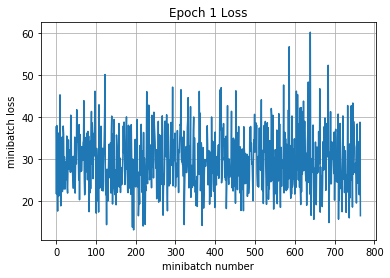

Validation
Epoch 1, Overall loss = 0.583 and accuracy of 0.821
Epoch 1, Overall loss = 0.584 and accuracy of 0.815
EPOCH = %d 62
Iteration 0: with minibatch training loss = 0.305 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.351 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.59 and accuracy of 0.8
Iteration 300: with minibatch training loss = 0.391 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.387 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.543 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.583 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.6 and accuracy of 0.8
Epoch 1, Overall loss = 0.459 and accuracy of 0.837


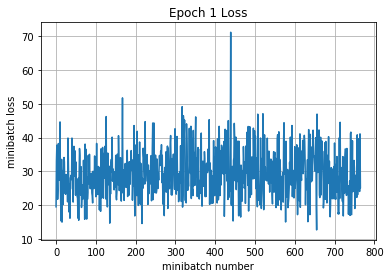

Validation
Epoch 1, Overall loss = 0.541 and accuracy of 0.819
Epoch 1, Overall loss = 0.558 and accuracy of 0.827
EPOCH = %d 63
Iteration 0: with minibatch training loss = 0.476 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.53 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.234 and accuracy of 0.94
Iteration 300: with minibatch training loss = 0.428 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.539 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.411 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.529 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.49 and accuracy of 0.8
Epoch 1, Overall loss = 0.457 and accuracy of 0.838


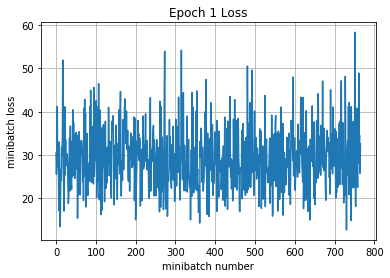

Validation
Epoch 1, Overall loss = 0.547 and accuracy of 0.811
Epoch 1, Overall loss = 0.54 and accuracy of 0.819
EPOCH = %d 64
Iteration 0: with minibatch training loss = 0.424 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.401 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.383 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.335 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.338 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.533 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.457 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.694 and accuracy of 0.8
Epoch 1, Overall loss = 0.446 and accuracy of 0.842


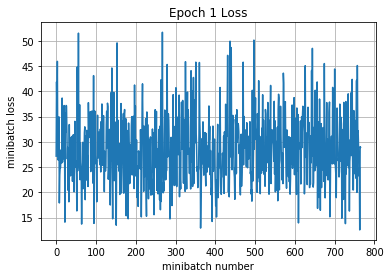

Validation
Epoch 1, Overall loss = 0.539 and accuracy of 0.82
Epoch 1, Overall loss = 0.535 and accuracy of 0.819
EPOCH = %d 65
Iteration 0: with minibatch training loss = 0.383 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.36 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.349 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.514 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.441 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.413 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.446 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.458 and accuracy of 0.88
Epoch 1, Overall loss = 0.448 and accuracy of 0.84


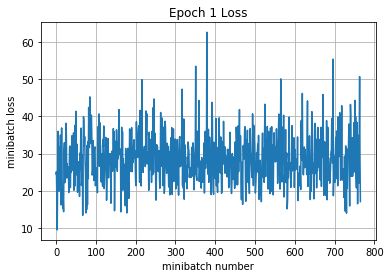

Validation
Epoch 1, Overall loss = 0.534 and accuracy of 0.833
Epoch 1, Overall loss = 0.521 and accuracy of 0.825
EPOCH = %d 66
Iteration 0: with minibatch training loss = 0.332 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.447 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.324 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.516 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.368 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.337 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.279 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.634 and accuracy of 0.77
Epoch 1, Overall loss = 0.441 and accuracy of 0.843


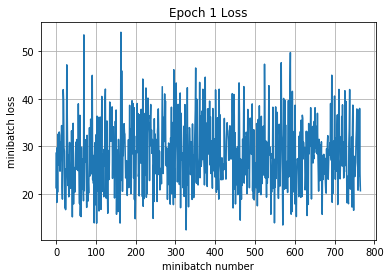

Validation
Epoch 1, Overall loss = 0.539 and accuracy of 0.838
Epoch 1, Overall loss = 0.554 and accuracy of 0.838
EPOCH = %d 67
Iteration 0: with minibatch training loss = 0.3 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.526 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.305 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.395 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.471 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.597 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.437 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.409 and accuracy of 0.81
Epoch 1, Overall loss = 0.435 and accuracy of 0.846


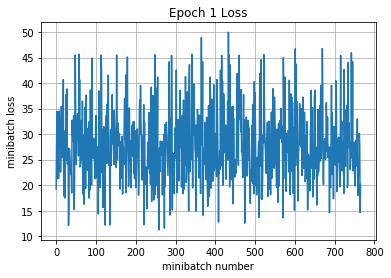

Validation
Epoch 1, Overall loss = 0.524 and accuracy of 0.83
Epoch 1, Overall loss = 0.527 and accuracy of 0.822
EPOCH = %d 68
Iteration 0: with minibatch training loss = 0.483 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.503 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.291 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.529 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.528 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.511 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.515 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.571 and accuracy of 0.77
Epoch 1, Overall loss = 0.434 and accuracy of 0.846


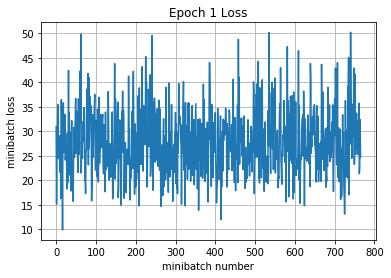

Validation
Epoch 1, Overall loss = 0.574 and accuracy of 0.799
Epoch 1, Overall loss = 0.58 and accuracy of 0.803
EPOCH = %d 69
Iteration 0: with minibatch training loss = 0.379 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.312 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.464 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.265 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.441 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.422 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.314 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.321 and accuracy of 0.88
Epoch 1, Overall loss = 0.426 and accuracy of 0.847


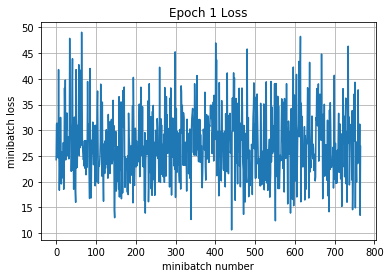

Validation
Epoch 1, Overall loss = 0.564 and accuracy of 0.822
Epoch 1, Overall loss = 0.556 and accuracy of 0.837
EPOCH = %d 70
Iteration 0: with minibatch training loss = 0.497 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.258 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.327 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.333 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.503 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.294 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.337 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.354 and accuracy of 0.91
Epoch 1, Overall loss = 0.426 and accuracy of 0.85


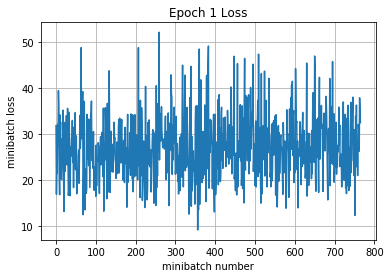

Validation
Epoch 1, Overall loss = 0.524 and accuracy of 0.83
Epoch 1, Overall loss = 0.521 and accuracy of 0.839
EPOCH = %d 71
Iteration 0: with minibatch training loss = 0.304 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.46 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.49 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.374 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.45 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.619 and accuracy of 0.77
Iteration 600: with minibatch training loss = 0.422 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.403 and accuracy of 0.83
Epoch 1, Overall loss = 0.42 and accuracy of 0.85


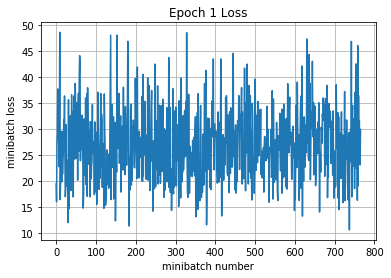

Validation
Epoch 1, Overall loss = 0.536 and accuracy of 0.823
Epoch 1, Overall loss = 0.522 and accuracy of 0.837
EPOCH = %d 72
Iteration 0: with minibatch training loss = 0.466 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.387 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.334 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.269 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.518 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.342 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.353 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.488 and accuracy of 0.78
Epoch 1, Overall loss = 0.419 and accuracy of 0.85


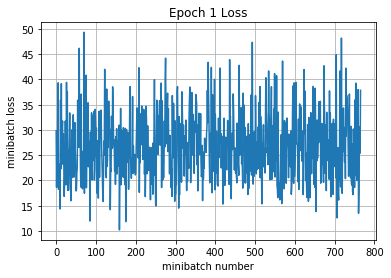

Validation
Epoch 1, Overall loss = 0.536 and accuracy of 0.83
Epoch 1, Overall loss = 0.536 and accuracy of 0.836
EPOCH = %d 73
Iteration 0: with minibatch training loss = 0.674 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.389 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.356 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.266 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.651 and accuracy of 0.73
Iteration 500: with minibatch training loss = 0.494 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.395 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.396 and accuracy of 0.88
Epoch 1, Overall loss = 0.412 and accuracy of 0.852


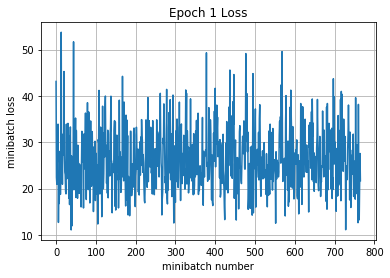

Validation
Epoch 1, Overall loss = 0.482 and accuracy of 0.856
Epoch 1, Overall loss = 0.462 and accuracy of 0.846
EPOCH = %d 74
Iteration 0: with minibatch training loss = 0.355 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.571 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.484 and accuracy of 0.77
Iteration 300: with minibatch training loss = 0.328 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.556 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.561 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.362 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.467 and accuracy of 0.81
Epoch 1, Overall loss = 0.415 and accuracy of 0.852


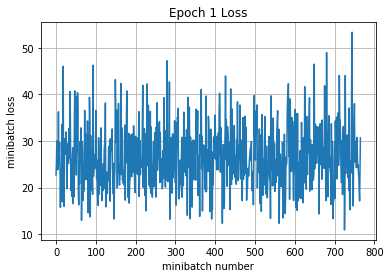

Validation
Epoch 1, Overall loss = 0.514 and accuracy of 0.833
Epoch 1, Overall loss = 0.527 and accuracy of 0.832
EPOCH = %d 75
Iteration 0: with minibatch training loss = 0.317 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.374 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.456 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.635 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.54 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.315 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.344 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.272 and accuracy of 0.89
Epoch 1, Overall loss = 0.412 and accuracy of 0.853


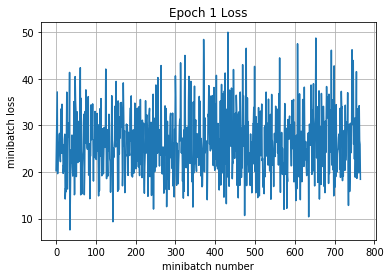

Validation
Epoch 1, Overall loss = 0.498 and accuracy of 0.837
Epoch 1, Overall loss = 0.509 and accuracy of 0.839
EPOCH = %d 76
Iteration 0: with minibatch training loss = 0.404 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.328 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.449 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.335 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.405 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.361 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.541 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.429 and accuracy of 0.91
Epoch 1, Overall loss = 0.407 and accuracy of 0.856


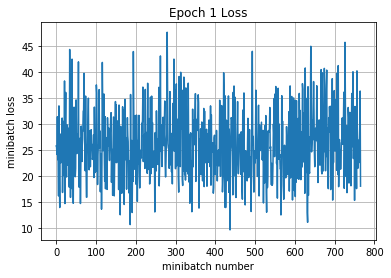

Validation
Epoch 1, Overall loss = 0.563 and accuracy of 0.824
Epoch 1, Overall loss = 0.57 and accuracy of 0.825
EPOCH = %d 77
Iteration 0: with minibatch training loss = 0.364 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.386 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.459 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.438 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.394 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.357 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.321 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.389 and accuracy of 0.84
Epoch 1, Overall loss = 0.401 and accuracy of 0.856


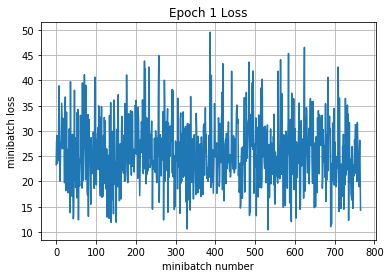

Validation
Epoch 1, Overall loss = 0.557 and accuracy of 0.822
Epoch 1, Overall loss = 0.552 and accuracy of 0.831
EPOCH = %d 78
Iteration 0: with minibatch training loss = 0.447 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.487 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.158 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.358 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.28 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.274 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.286 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.353 and accuracy of 0.88
Epoch 1, Overall loss = 0.399 and accuracy of 0.857


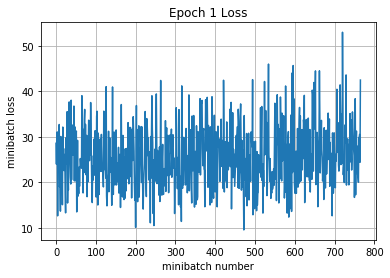

Validation
Epoch 1, Overall loss = 0.521 and accuracy of 0.828
Epoch 1, Overall loss = 0.521 and accuracy of 0.826
EPOCH = %d 79
Iteration 0: with minibatch training loss = 0.314 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.387 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.395 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.535 and accuracy of 0.81
Iteration 400: with minibatch training loss = 0.413 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.362 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.306 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.364 and accuracy of 0.88
Epoch 1, Overall loss = 0.399 and accuracy of 0.858


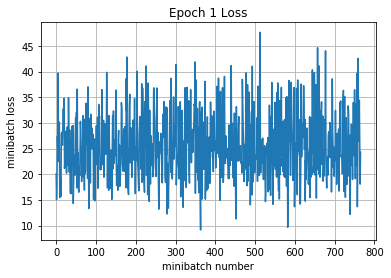

Validation
Epoch 1, Overall loss = 0.568 and accuracy of 0.821
Epoch 1, Overall loss = 0.59 and accuracy of 0.831
EPOCH = %d 80
Iteration 0: with minibatch training loss = 0.567 and accuracy of 0.77
Iteration 100: with minibatch training loss = 0.433 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.371 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.53 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.398 and accuracy of 0.86
Iteration 500: with minibatch training loss = 0.245 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.266 and accuracy of 0.91
Iteration 700: with minibatch training loss = 0.476 and accuracy of 0.83
Epoch 1, Overall loss = 0.391 and accuracy of 0.859


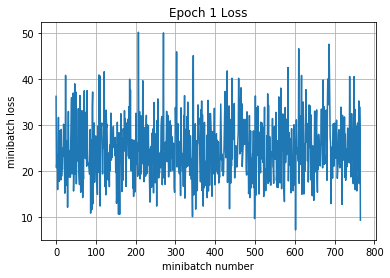

Validation
Epoch 1, Overall loss = 0.569 and accuracy of 0.818
Epoch 1, Overall loss = 0.551 and accuracy of 0.824
EPOCH = %d 81
Iteration 0: with minibatch training loss = 0.228 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.523 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.506 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.4 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.504 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.401 and accuracy of 0.81
Iteration 600: with minibatch training loss = 0.479 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.335 and accuracy of 0.91
Epoch 1, Overall loss = 0.39 and accuracy of 0.859


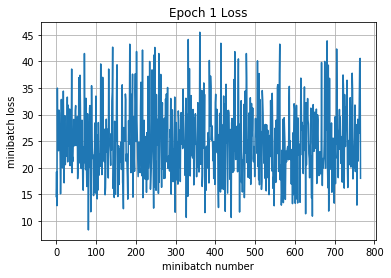

Validation
Epoch 1, Overall loss = 0.512 and accuracy of 0.828
Epoch 1, Overall loss = 0.526 and accuracy of 0.825
EPOCH = %d 82
Iteration 0: with minibatch training loss = 0.273 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.369 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.376 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.375 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.393 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.397 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.487 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.327 and accuracy of 0.89
Epoch 1, Overall loss = 0.388 and accuracy of 0.86


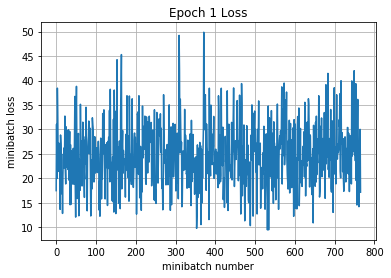

Validation
Epoch 1, Overall loss = 0.459 and accuracy of 0.84
Epoch 1, Overall loss = 0.485 and accuracy of 0.84
EPOCH = %d 83
Iteration 0: with minibatch training loss = 0.435 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.423 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.257 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.236 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.463 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.318 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.448 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.345 and accuracy of 0.88
Epoch 1, Overall loss = 0.378 and accuracy of 0.866


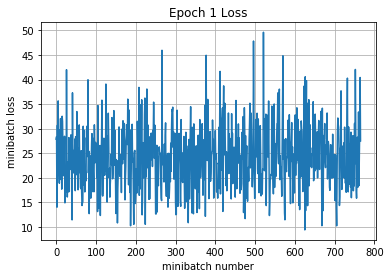

Validation
Epoch 1, Overall loss = 0.512 and accuracy of 0.832
Epoch 1, Overall loss = 0.532 and accuracy of 0.834
EPOCH = %d 84
Iteration 0: with minibatch training loss = 0.448 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.293 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.252 and accuracy of 0.94
Iteration 300: with minibatch training loss = 0.285 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.312 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.468 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.37 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.396 and accuracy of 0.89
Epoch 1, Overall loss = 0.38 and accuracy of 0.861


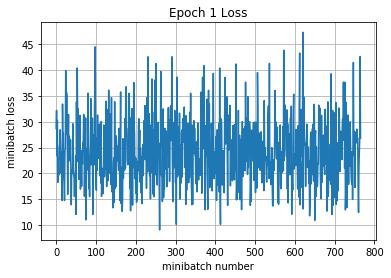

Validation
Epoch 1, Overall loss = 0.506 and accuracy of 0.841
Epoch 1, Overall loss = 0.503 and accuracy of 0.828
EPOCH = %d 85
Iteration 0: with minibatch training loss = 0.301 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.374 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.456 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.299 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.276 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.449 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.42 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.393 and accuracy of 0.89
Epoch 1, Overall loss = 0.378 and accuracy of 0.865


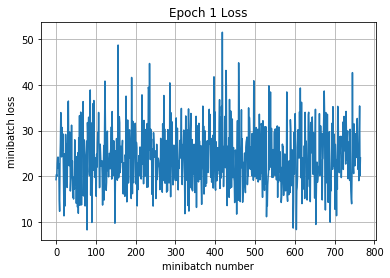

Validation
Epoch 1, Overall loss = 0.508 and accuracy of 0.837
Epoch 1, Overall loss = 0.492 and accuracy of 0.826
EPOCH = %d 86
Iteration 0: with minibatch training loss = 0.353 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.453 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.278 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.241 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.502 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.255 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.548 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.349 and accuracy of 0.86
Epoch 1, Overall loss = 0.371 and accuracy of 0.867


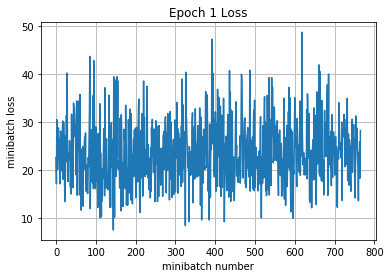

Validation
Epoch 1, Overall loss = 0.506 and accuracy of 0.846
Epoch 1, Overall loss = 0.509 and accuracy of 0.839
EPOCH = %d 87
Iteration 0: with minibatch training loss = 0.526 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.468 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.365 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.245 and accuracy of 0.89
Iteration 400: with minibatch training loss = 0.227 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.32 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.354 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.285 and accuracy of 0.83
Epoch 1, Overall loss = 0.366 and accuracy of 0.868


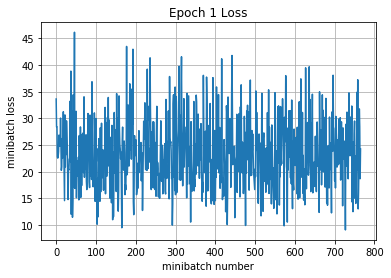

Validation
Epoch 1, Overall loss = 0.535 and accuracy of 0.833
Epoch 1, Overall loss = 0.5 and accuracy of 0.842
EPOCH = %d 88
Iteration 0: with minibatch training loss = 0.552 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.279 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.288 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.371 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.343 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.421 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.529 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.129 and accuracy of 0.98
Epoch 1, Overall loss = 0.368 and accuracy of 0.87


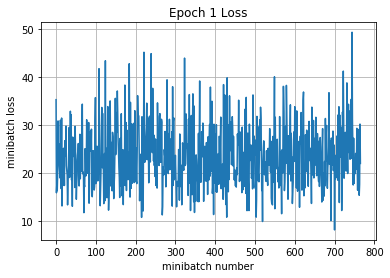

Validation
Epoch 1, Overall loss = 0.503 and accuracy of 0.836
Epoch 1, Overall loss = 0.496 and accuracy of 0.833
EPOCH = %d 89
Iteration 0: with minibatch training loss = 0.321 and accuracy of 0.89
Iteration 100: with minibatch training loss = 0.393 and accuracy of 0.81
Iteration 200: with minibatch training loss = 0.454 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.202 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.389 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.724 and accuracy of 0.72
Iteration 600: with minibatch training loss = 0.347 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.393 and accuracy of 0.86
Epoch 1, Overall loss = 0.36 and accuracy of 0.872


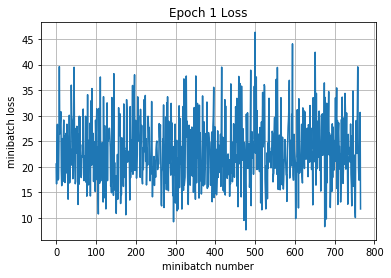

Validation
Epoch 1, Overall loss = 0.488 and accuracy of 0.836
Epoch 1, Overall loss = 0.518 and accuracy of 0.839
EPOCH = %d 90
Iteration 0: with minibatch training loss = 0.498 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.17 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.385 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.498 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.357 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.489 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.457 and accuracy of 0.83
Iteration 700: with minibatch training loss = 0.593 and accuracy of 0.8
Epoch 1, Overall loss = 0.362 and accuracy of 0.872


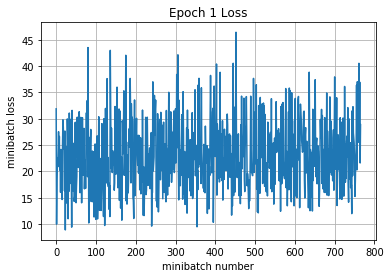

Validation
Epoch 1, Overall loss = 0.535 and accuracy of 0.84
Epoch 1, Overall loss = 0.548 and accuracy of 0.84
EPOCH = %d 91
Iteration 0: with minibatch training loss = 0.363 and accuracy of 0.83
Iteration 100: with minibatch training loss = 0.366 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.27 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.344 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.462 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.221 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.451 and accuracy of 0.81
Iteration 700: with minibatch training loss = 0.312 and accuracy of 0.91
Epoch 1, Overall loss = 0.357 and accuracy of 0.872


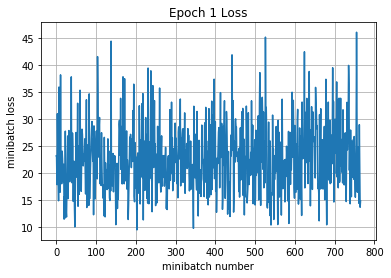

Validation
Epoch 1, Overall loss = 0.533 and accuracy of 0.828
Epoch 1, Overall loss = 0.548 and accuracy of 0.83
EPOCH = %d 92
Iteration 0: with minibatch training loss = 0.575 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.347 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.31 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.197 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.528 and accuracy of 0.81
Iteration 500: with minibatch training loss = 0.283 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.207 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.306 and accuracy of 0.86
Epoch 1, Overall loss = 0.356 and accuracy of 0.874


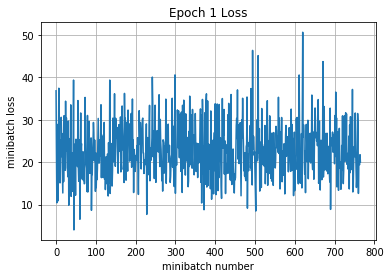

Validation
Epoch 1, Overall loss = 0.511 and accuracy of 0.845
Epoch 1, Overall loss = 0.52 and accuracy of 0.846
EPOCH = %d 93
Iteration 0: with minibatch training loss = 0.338 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.373 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.319 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.344 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.208 and accuracy of 0.94
Iteration 500: with minibatch training loss = 0.365 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.288 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.416 and accuracy of 0.81
Epoch 1, Overall loss = 0.353 and accuracy of 0.874


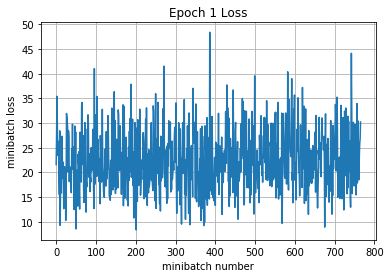

Validation
Epoch 1, Overall loss = 0.561 and accuracy of 0.819
Epoch 1, Overall loss = 0.529 and accuracy of 0.829
EPOCH = %d 94
Iteration 0: with minibatch training loss = 0.357 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.365 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.558 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.305 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.306 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.379 and accuracy of 0.88
Iteration 600: with minibatch training loss = 0.434 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.374 and accuracy of 0.83
Epoch 1, Overall loss = 0.357 and accuracy of 0.871


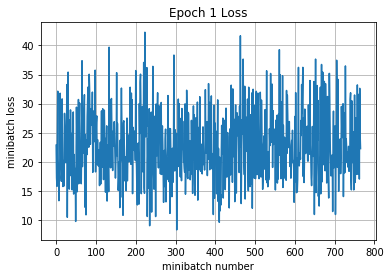

Validation
Epoch 1, Overall loss = 0.541 and accuracy of 0.833
Epoch 1, Overall loss = 0.532 and accuracy of 0.854
EPOCH = %d 95
Iteration 0: with minibatch training loss = 0.299 and accuracy of 0.91
Iteration 100: with minibatch training loss = 0.551 and accuracy of 0.78
Iteration 200: with minibatch training loss = 0.254 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.343 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.318 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.23 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.349 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.332 and accuracy of 0.84
Epoch 1, Overall loss = 0.344 and accuracy of 0.877


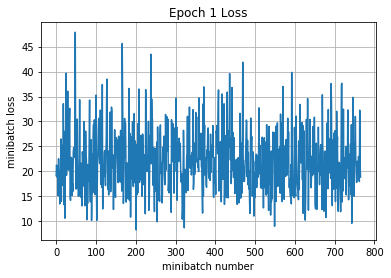

Validation
Epoch 1, Overall loss = 0.507 and accuracy of 0.835
Epoch 1, Overall loss = 0.524 and accuracy of 0.83
EPOCH = %d 96
Iteration 0: with minibatch training loss = 0.356 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.192 and accuracy of 0.97
Iteration 200: with minibatch training loss = 0.342 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.285 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.633 and accuracy of 0.75
Iteration 500: with minibatch training loss = 0.591 and accuracy of 0.78
Iteration 600: with minibatch training loss = 0.358 and accuracy of 0.88
Iteration 700: with minibatch training loss = 0.261 and accuracy of 0.92
Epoch 1, Overall loss = 0.344 and accuracy of 0.877


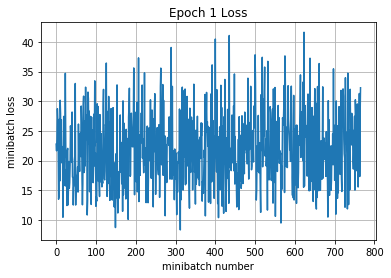

Validation
Epoch 1, Overall loss = 0.564 and accuracy of 0.832
Epoch 1, Overall loss = 0.572 and accuracy of 0.845
EPOCH = %d 97
Iteration 0: with minibatch training loss = 0.18 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.352 and accuracy of 0.84
Iteration 200: with minibatch training loss = 0.433 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.304 and accuracy of 0.86
Iteration 400: with minibatch training loss = 0.449 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.491 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.38 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.269 and accuracy of 0.92
Epoch 1, Overall loss = 0.337 and accuracy of 0.879


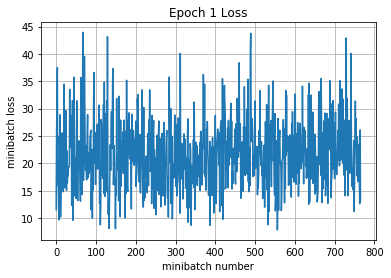

Validation
Epoch 1, Overall loss = 0.542 and accuracy of 0.828
Epoch 1, Overall loss = 0.525 and accuracy of 0.838
EPOCH = %d 98
Iteration 0: with minibatch training loss = 0.265 and accuracy of 0.92
Iteration 100: with minibatch training loss = 0.381 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.404 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.281 and accuracy of 0.88
Iteration 400: with minibatch training loss = 0.421 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.265 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.422 and accuracy of 0.86
Iteration 700: with minibatch training loss = 0.168 and accuracy of 0.94
Epoch 1, Overall loss = 0.335 and accuracy of 0.88


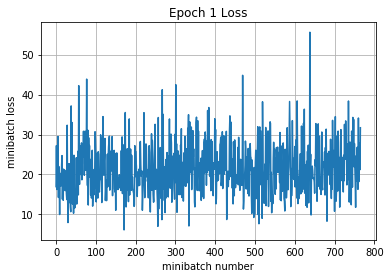

Validation
Epoch 1, Overall loss = 0.485 and accuracy of 0.844
Epoch 1, Overall loss = 0.5 and accuracy of 0.855
EPOCH = %d 99
Iteration 0: with minibatch training loss = 0.338 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.302 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.62 and accuracy of 0.84
Iteration 300: with minibatch training loss = 0.436 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.247 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.391 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.48 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.327 and accuracy of 0.88
Epoch 1, Overall loss = 0.336 and accuracy of 0.88


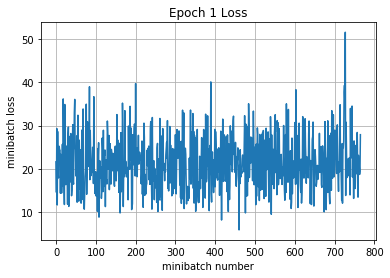

Validation
Epoch 1, Overall loss = 0.506 and accuracy of 0.841
Epoch 1, Overall loss = 0.512 and accuracy of 0.844


In [28]:
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
num_epochs = 100
for i in range(num_epochs):
    print ("EPOCH = %d",i)
    run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True,drop_o = 0.8)
    print('Validation')
    run_model(sess,y_out,mean_loss,X_val,y_val,1,64)
    run_model(sess,y_value,mean_loss2,X_val,y_val,1,64)

In [29]:
print('Training')
run_model(sess,y_value,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_value,mean_loss,X_val,y_val,1,64)


Training
Epoch 1, Overall loss = 0.152 and accuracy of 0.958
Validation
Epoch 1, Overall loss = 0.476 and accuracy of 0.844


(0.4760308246612549, 0.84399999999999997)